Classification Task

Author: Danil Kopysov (10742374)


In this script there are all of the steps I have made to prepare the solution. The code is splited into several sections:
- Data Import and preparation
- Division into subsets and preparation for classification
- Classification tree
- KNN
- Logistic regression
- Neural Network
- SVM
- Random forest
- Ensemble classificator

The most effective in terms of F1 measure is the last one - Ensemble classificator. So, it would be the main algorithm for further work.


## Data Import and preparation

In [2]:
import pandas as pd
data = pd.read_csv('stress_train.csv')
data.head(5)

,age,workclass,education,education_years,marital_status,occupation,relationship,race,sex,hours_week,country,permit,stress
0,43,Private,HS-grad,9,Divorced,Transport-moving,Not-in-family,NaN,Male,16,United-States,B,0
1,31,Self-emp-not-inc,Some-college,10,Married-civ-spouse,Craft-repair,Husband,NaN,Male,40,United-States,D,0
2,47,Self-emp-not-inc,Some-college,10,Divorced,Exec-managerial,Not-in-family,NaN,Female,65,United-States,C,0
3,32,Private,HS-grad,9,Never-married,Sales,Own-child,NaN,Female,35,United-States,B,0
4,25,State-gov,Some-college,10,Divorced,Protective-serv,Other-relative,NaN,Male,45,United-States,A,0


In [3]:
#Amount of NaNs by variables
print(data.isna().sum())
print(len(data))

age                    0
workclass            936
education              0
education_years        0
marital_status         0
occupation           940
relationship           0
race               12836
sex                    0
hours_week             0
country              263
permit                 0
stress                 0
dtype: int64
15164


In [4]:
#NaNs replacement and sanity check
data_rep = data.copy()
values = {'workclass': 'Others', "occupation": 'Others', 'race': 'White', 'country': 'Others'}
data_rep = data_rep.fillna(value=values)
print(data_rep.isna().sum())
print(len(data_rep))

age                0
workclass          0
education          0
education_years    0
marital_status     0
occupation         0
relationship       0
race               0
sex                0
hours_week         0
country            0
permit             0
stress             0
dtype: int64
15164


In [5]:
#Contingency tables (with percentage)
for i in ['race', 'country', 'workclass', 'education', 'marital_status', 'occupation', 'relationship', 'sex', 'permit']:
    data_crosstab_rep = pd.crosstab(data_rep[i], data_rep['stress'], margins = False).apply(lambda r: r/r.sum()*100, axis=1)
    print(' ')
    print(data_crosstab_rep) 

 
stress                      0          1
race                                    
Amer-Indian-Eskimo  87.323944  12.676056
Asian-Pac-Islander  76.855895  23.144105
Black               89.348371  10.651629
Other               90.909091   9.090909
White               77.360548  22.639452
 
stress                               0          1
country                                          
Cambodia                    100.000000   0.000000
Canada                       73.214286  26.785714
China                        75.862069  24.137931
Columbia                     94.285714   5.714286
Cuba                         76.086957  23.913043
Dominican-Republic           96.969697   3.030303
Ecuador                      90.000000  10.000000
El-Salvador                  96.000000   4.000000
England                      70.731707  29.268293
France                       64.705882  35.294118
Germany                      70.149254  29.850746
Greece                       63.636364  36.363636
Guatemala

In [6]:
#number of levels per variable
for i in list(data_rep):
      print( i, '-', len(data_rep[i].unique()))

age - 72
workclass - 9
education - 16
education_years - 16
marital_status - 5
occupation - 15
relationship - 6
race - 5
sex - 2
hours_week - 88
country - 41
permit - 5
stress - 2


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000012628803AC8>,
      dtype=object)

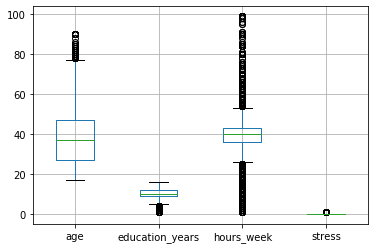

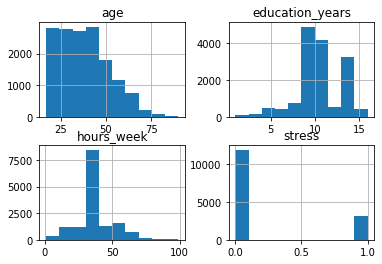

In [7]:
#Boxplots and histogramms
%matplotlib inline
data_rep.boxplot()
data_rep.hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001262ADED108>,
      dtype=object)

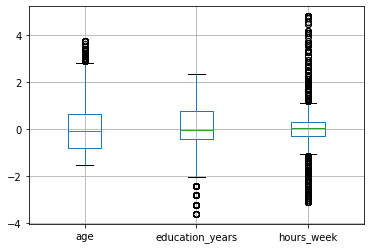

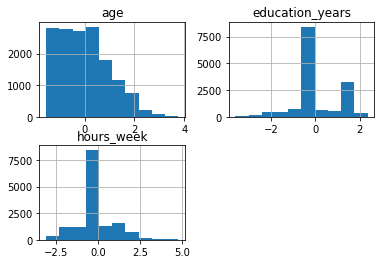

In [8]:
#Numerical variables standartization
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(data_rep[['age', 'education_years', 'hours_week']]) 
scaled_data_rep = pd.DataFrame(scaler.transform(data_rep[['age', 'education_years', 'hours_week']]))
scaled_data_rep.columns = ['age', 'education_years', 'hours_week']

#And graphs
%matplotlib inline
scaled_data_rep.boxplot()
scaled_data_rep.hist()

In [9]:
#Correlation matrix
scaled_data_rep1 = pd.merge(scaled_data_rep, data_rep[['stress']],left_index=True,right_index=True )
scaled_data_rep1.apply(lambda s: scaled_data_rep1.corrwith(s))

,age,education_years,hours_week,stress
age,1.000000,0.030460,0.079646,0.218209
education_years,0.030460,1.000000,0.146053,0.323726
hours_week,0.079646,0.146053,1.000000,0.220636
stress,0.218209,0.323726,0.220636,1.000000


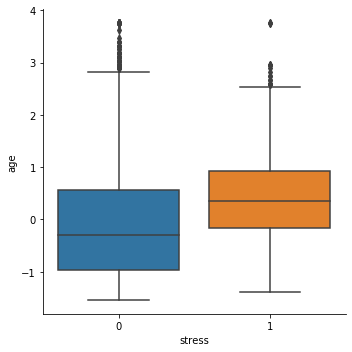

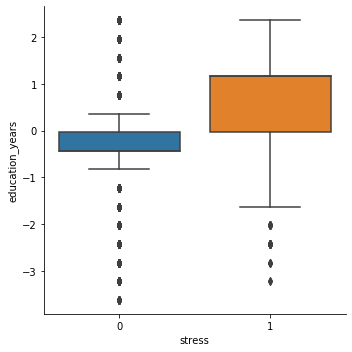

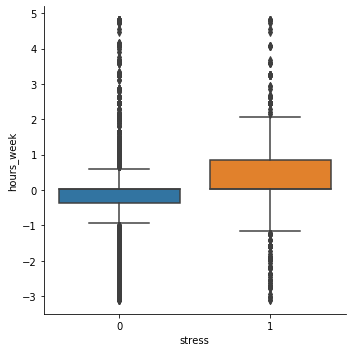

In [10]:
# 2Var boxplots. Evidence of possible significance of numerical variables
import seaborn as sns
column_names1 = list(scaled_data_rep)
for i in column_names1:
    sns.catplot(x="stress", y= i, kind="box", data=scaled_data_rep1) 

### PCA

In [11]:
#trying to do PCA
from sklearn.decomposition import PCA
import numpy as np
pca = PCA()
pca.fit(scaled_data_rep)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [12]:
#Table of components
df_pca = pd.DataFrame(pca.transform(scaled_data_rep))
df_pca.head()

,0,1,2
0,-1.407623,0.701716,-1.191648
1,-0.203753,-0.450334,0.180933
2,1.628202,0.364574,1.360021
3,-0.693046,-0.160246,0.123546
4,-0.106573,-0.875776,0.583228


          0        1    2
0  0.393455  0.71834  1.0


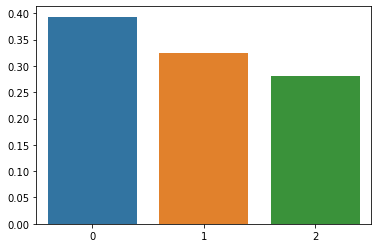

In [13]:
#Description of variance explanation capabilities (Graph - cumulative, table - regular)
explained_var = pd.DataFrame(pca.explained_variance_ratio_).transpose()
cum_explained_var=np.cumsum(pca.explained_variance_ratio_)
print(pd.DataFrame(cum_explained_var).transpose())

%matplotlib inline
import seaborn as sns
ax = sns.barplot( data=explained_var)

### Categorical variables transformation

In [11]:
data_transform_rep = data_rep.copy()

In [12]:
#Transformation of country
data_transform_rep.country.loc[(data_transform_rep.country == 'United-States')] = 1
data_transform_rep.country.loc[(data_transform_rep.country != 1)] = 0

#Transformation of sex
data_transform_rep.sex.loc[(data_transform_rep.sex == 'Male')] = 1
data_transform_rep.sex.loc[(data_transform_rep.sex != 1)] = 0

#Transformation of relationship
data_transform_rep.relationship.loc[(data_transform_rep.relationship == 'Husband')] = 1
data_transform_rep.relationship.loc[(data_transform_rep.relationship == 'Wife')] = 1
data_transform_rep.relationship.loc[(data_transform_rep.relationship != 1)] = 0


C:\Users\xiaomi\Anaconda3\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [13]:
# Turning categorical variables into sets of binaries
data_bin = data_transform_rep[['workclass', 'education', 'marital_status', 'occupation', 'race']].copy()

#Transformation of education, reducing of the number of levels
data_bin.education = data_bin.education.replace({"1st-4th": "School", "5th-6th": "School","7th-8th": "School", "9th": "School", 
                                                 "10th": "School", "11th": "School",  "12th": "School", "Preschool": "School"})

print(len(data_bin))

print(data_bin.groupby('education').count().race)

15164
education
Assoc-acdm       518
Assoc-voc        653
Bachelors       2449
Doctorate        178
HS-grad         4890
Masters          793
Prof-school      232
School          1939
Some-college    3512
Name: race, dtype: int64


In [14]:
data_bin1 = pd.get_dummies(data_bin, columns=['workclass', 'education', 'marital_status', 'occupation', 'race'], 
                          prefix = ['workclass', 'education', 'marital_status', 'occupation', 'race'])
print(list(data_bin1))

['workclass_Federal-gov', 'workclass_Local-gov', 'workclass_Never-worked', 'workclass_Others', 'workclass_Private', 'workclass_Self-emp-inc', 'workclass_Self-emp-not-inc', 'workclass_State-gov', 'workclass_Without-pay', 'education_Assoc-acdm', 'education_Assoc-voc', 'education_Bachelors', 'education_Doctorate', 'education_HS-grad', 'education_Masters', 'education_Prof-school', 'education_School', 'education_Some-college', 'marital_status_Divorced', 'marital_status_Married-civ-spouse', 'marital_status_Never-married', 'marital_status_Separated', 'marital_status_Widowed', 'occupation_Adm-clerical', 'occupation_Armed-Forces', 'occupation_Craft-repair', 'occupation_Exec-managerial', 'occupation_Farming-fishing', 'occupation_Handlers-cleaners', 'occupation_Machine-op-inspct', 'occupation_Other-service', 'occupation_Others', 'occupation_Priv-house-serv', 'occupation_Prof-specialty', 'occupation_Protective-serv', 'occupation_Sales', 'occupation_Tech-support', 'occupation_Transport-moving', 'ra

In [15]:
#Merging into final dataset
df_final = pd.merge(data_bin1, data_transform_rep[['sex', 'country', 'relationship']], left_index = True, right_index = True )
df_final = pd.merge(df_final, scaled_data_rep1, left_index = True, right_index = True)

print(df_final.shape)
print(list(df_final))

(15164, 50)
['workclass_Federal-gov', 'workclass_Local-gov', 'workclass_Never-worked', 'workclass_Others', 'workclass_Private', 'workclass_Self-emp-inc', 'workclass_Self-emp-not-inc', 'workclass_State-gov', 'workclass_Without-pay', 'education_Assoc-acdm', 'education_Assoc-voc', 'education_Bachelors', 'education_Doctorate', 'education_HS-grad', 'education_Masters', 'education_Prof-school', 'education_School', 'education_Some-college', 'marital_status_Divorced', 'marital_status_Married-civ-spouse', 'marital_status_Never-married', 'marital_status_Separated', 'marital_status_Widowed', 'occupation_Adm-clerical', 'occupation_Armed-Forces', 'occupation_Craft-repair', 'occupation_Exec-managerial', 'occupation_Farming-fishing', 'occupation_Handlers-cleaners', 'occupation_Machine-op-inspct', 'occupation_Other-service', 'occupation_Others', 'occupation_Priv-house-serv', 'occupation_Prof-specialty', 'occupation_Protective-serv', 'occupation_Sales', 'occupation_Tech-support', 'occupation_Transport-

## Division into subsets and preparation for classification

In [16]:
b = ['workclass_Federal-gov', 'workclass_Local-gov', 'workclass_Never-worked', 'workclass_Others',
     'workclass_Private', 'workclass_Self-emp-inc', 'workclass_Self-emp-not-inc', 'workclass_State-gov', 
     'workclass_Without-pay', 'education_Assoc-acdm', 'education_Assoc-voc', 'education_Bachelors', 'education_Doctorate',
     'education_HS-grad', 'education_Masters', 'education_Prof-school', 'education_School', 'education_Some-college', 
     'marital_status_Divorced', 'marital_status_Married-civ-spouse', 'marital_status_Never-married', 'marital_status_Separated',
     'marital_status_Widowed', 'occupation_Adm-clerical', 'occupation_Armed-Forces', 'occupation_Craft-repair',
     'occupation_Exec-managerial', 'occupation_Farming-fishing', 'occupation_Handlers-cleaners',
     'occupation_Machine-op-inspct', 'occupation_Other-service', 'occupation_Others', 'occupation_Priv-house-serv',
     'occupation_Prof-specialty', 'occupation_Protective-serv', 'occupation_Sales', 'occupation_Tech-support',
     'occupation_Transport-moving', 'race_Amer-Indian-Eskimo', 'race_Asian-Pac-Islander', 'race_Black', 'race_Other',
     'race_White', 'sex', 'country', 'relationship', 'age', 'education_years', 'hours_week']

In [17]:
#Separation on target and explanatory variables
X = df_final.loc[:, b]
y = df_final.loc[:,['stress']]

In [18]:
from sklearn.model_selection import train_test_split

#spliting data into test and training set

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size =0.30, #by default is 75%-25%
                                                    #shuffle is set True by default,
                                                    stratify=y, #preserve target propotions in train and the test set we have same
                                                    #proportin of 0 and 1
                                                    random_state= 123) #fix random seed for replicability

print(X_train.shape, X_test.shape)

(10614, 49) (4550, 49)


### SMOTE oversampling

stress
0    11952
1     3212
dtype: int64


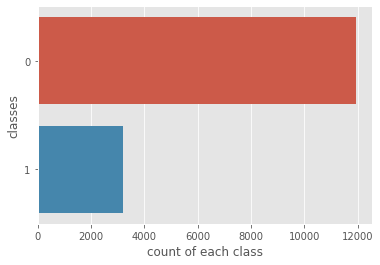

In [29]:
print(y.groupby('stress').size())

#some imports to plot 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('ggplot')

#Visualize Class Counts
sns.countplot(y=y.stress ,data=y)
plt.xlabel("count of each class")
plt.ylabel("classes")
plt.show()

In [30]:
#Applying SMOTE oversampling technique
from imblearn.over_sampling import SMOTE
columns = list(X)

os = SMOTE(random_state=123)
os_data_X, os_data_y = os.fit_sample(X_train, y_train)
os_data_X = pd.DataFrame(data=os_data_X,columns=columns )
os_data_y= pd.DataFrame(data=os_data_y,columns=['stress'])
print(os_data_X.shape)
print(os_data_y.shape)

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


(16732, 49)
(16732, 1)


In [31]:
# Checking the numbers of our data
print("length of oversampled data is ", len(os_data_X))
print("Number of no depressed in oversampled data",len(os_data_y[os_data_y['stress']==0]))
print("Number of depressed",len(os_data_y[os_data_y['stress']==1]))
print("Proportion of no depresed data in oversampled data is ",len(os_data_y[os_data_y['stress']==0])/len(os_data_X))
print("Proportion of depressed data in oversampled data is ",len(os_data_y[os_data_y['stress']==1])/len(os_data_X))

length of oversampled data is  16732
Number of no depressed in oversampled data 8366
Number of depressed 8366
Proportion of no depresed data in oversampled data is  0.5
Proportion of depressed data in oversampled data is  0.5


## Classification tree

#### The try with SMOTE

In [21]:
# Creation of parameters of the model
import numpy as np
from sklearn.tree import DecisionTreeClassifier
classifier_tree_1 = DecisionTreeClassifier()
parameters = {'criterion': ['entropy','gini'], 
              'max_depth': np.arange(3,15),
              'min_samples_split': np.arange(5,25),
              'min_samples_leaf': np.arange(2,10)}

In [33]:
# Creation of the grid search
from sklearn.model_selection import GridSearchCV
gs_tree1 = GridSearchCV(classifier_tree_1, parameters, cv=5, scoring = 'f1', verbose=50, n_jobs=-1, refit=True)

In [34]:
#training of the model
gs_tree1 = gs_tree1.fit(os_data_X, os_data_y)

Fitting 5 folds for each of 3840 candidates, totalling 19200 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed

[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 134 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 135 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 139 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 142 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 143 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 147 tasks      | elapsed:    5.7s
[Paralle

[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 273 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 274 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 275 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 277 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 278 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 279 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 281 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 282 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done 283 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done 284 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done 285 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done 286 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done 287 tasks      | elapsed:    8.1s
[Paralle

[Parallel(n_jobs=-1)]: Done 410 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 411 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 412 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 413 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 414 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 415 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 416 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 417 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 419 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 420 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 421 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 422 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 423 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 424 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 425 tasks      | elapsed:   10.8s
[Paralle

[Parallel(n_jobs=-1)]: Done 545 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done 546 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done 547 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done 548 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done 549 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 550 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 551 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 552 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 553 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 554 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 555 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 556 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 557 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 558 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done 559 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done 560 tasks      | elapsed:   13.2s
[Paralle

[Parallel(n_jobs=-1)]: Done 690 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 691 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 692 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 693 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 694 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 695 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 696 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 697 tasks      | elapsed:   15.5s
[Parallel(n_jobs=-1)]: Done 698 tasks      | elapsed:   15.5s
[Parallel(n_jobs=-1)]: Done 699 tasks      | elapsed:   15.5s
[Parallel(n_jobs=-1)]: Done 700 tasks      | elapsed:   15.5s
[Parallel(n_jobs=-1)]: Done 701 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 702 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 703 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 704 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 705 tasks      | elapsed:   15.6s
[Paralle

[Parallel(n_jobs=-1)]: Done 825 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done 826 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done 827 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done 829 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done 830 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done 831 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 832 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 833 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 834 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 835 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 836 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 837 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 838 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 839 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 840 tasks      | elapsed:   18.1s
[Paralle

[Parallel(n_jobs=-1)]: Done 960 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 961 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 962 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 963 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 964 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 965 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 966 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 967 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 968 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 969 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 970 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 971 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 972 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 973 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 974 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 975 tasks      | elapsed:   20.9s
[Paralle

[Parallel(n_jobs=-1)]: Done 1092 tasks      | elapsed:   23.2s
[Parallel(n_jobs=-1)]: Done 1093 tasks      | elapsed:   23.2s
[Parallel(n_jobs=-1)]: Done 1094 tasks      | elapsed:   23.2s
[Parallel(n_jobs=-1)]: Done 1095 tasks      | elapsed:   23.2s
[Parallel(n_jobs=-1)]: Done 1096 tasks      | elapsed:   23.2s
[Parallel(n_jobs=-1)]: Done 1097 tasks      | elapsed:   23.2s
[Parallel(n_jobs=-1)]: Done 1098 tasks      | elapsed:   23.3s
[Parallel(n_jobs=-1)]: Done 1099 tasks      | elapsed:   23.3s
[Parallel(n_jobs=-1)]: Done 1100 tasks      | elapsed:   23.3s
[Parallel(n_jobs=-1)]: Done 1101 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 1102 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 1103 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 1104 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 1105 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 1106 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 1107 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1230 tasks      | elapsed:   25.9s
[Parallel(n_jobs=-1)]: Done 1231 tasks      | elapsed:   25.9s
[Parallel(n_jobs=-1)]: Done 1232 tasks      | elapsed:   25.9s
[Parallel(n_jobs=-1)]: Done 1233 tasks      | elapsed:   25.9s
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 1235 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 1236 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 1237 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 1239 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 1240 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done 1241 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done 1243 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done 1244 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done 1245 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1364 tasks      | elapsed:   28.3s
[Parallel(n_jobs=-1)]: Done 1365 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done 1366 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done 1367 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done 1368 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done 1369 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done 1370 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done 1371 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done 1372 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done 1373 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done 1374 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done 1375 tasks      | elapsed:   28.6s
[Parallel(n_jobs=-1)]: Done 1376 tasks      | elapsed:   28.6s
[Parallel(n_jobs=-1)]: Done 1377 tasks      | elapsed:   28.6s
[Parallel(n_jobs=-1)]: Done 1378 tasks      | elapsed:   28.6s
[Parallel(n_jobs=-1)]: Done 1379 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1497 tasks      | elapsed:   30.8s
[Parallel(n_jobs=-1)]: Done 1498 tasks      | elapsed:   30.8s
[Parallel(n_jobs=-1)]: Done 1499 tasks      | elapsed:   30.8s
[Parallel(n_jobs=-1)]: Done 1500 tasks      | elapsed:   30.9s
[Parallel(n_jobs=-1)]: Done 1501 tasks      | elapsed:   30.9s
[Parallel(n_jobs=-1)]: Done 1502 tasks      | elapsed:   30.9s
[Parallel(n_jobs=-1)]: Done 1503 tasks      | elapsed:   30.9s
[Parallel(n_jobs=-1)]: Done 1504 tasks      | elapsed:   31.0s
[Parallel(n_jobs=-1)]: Done 1505 tasks      | elapsed:   31.0s
[Parallel(n_jobs=-1)]: Done 1506 tasks      | elapsed:   31.0s
[Parallel(n_jobs=-1)]: Done 1507 tasks      | elapsed:   31.0s
[Parallel(n_jobs=-1)]: Done 1508 tasks      | elapsed:   31.0s
[Parallel(n_jobs=-1)]: Done 1509 tasks      | elapsed:   31.1s
[Parallel(n_jobs=-1)]: Done 1510 tasks      | elapsed:   31.1s
[Parallel(n_jobs=-1)]: Done 1511 tasks      | elapsed:   31.1s
[Parallel(n_jobs=-1)]: Done 1512 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1636 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 1637 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1638 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1639 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1640 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1641 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1642 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1643 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 1644 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 1645 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 1646 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 1647 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 1648 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 1649 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 1650 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 1651 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1772 tasks      | elapsed:   36.2s
[Parallel(n_jobs=-1)]: Done 1773 tasks      | elapsed:   36.2s
[Parallel(n_jobs=-1)]: Done 1774 tasks      | elapsed:   36.2s
[Parallel(n_jobs=-1)]: Done 1775 tasks      | elapsed:   36.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   36.3s
[Parallel(n_jobs=-1)]: Done 1777 tasks      | elapsed:   36.3s
[Parallel(n_jobs=-1)]: Done 1778 tasks      | elapsed:   36.3s
[Parallel(n_jobs=-1)]: Done 1779 tasks      | elapsed:   36.3s
[Parallel(n_jobs=-1)]: Done 1780 tasks      | elapsed:   36.4s
[Parallel(n_jobs=-1)]: Done 1781 tasks      | elapsed:   36.4s
[Parallel(n_jobs=-1)]: Done 1782 tasks      | elapsed:   36.4s
[Parallel(n_jobs=-1)]: Done 1783 tasks      | elapsed:   36.4s
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:   36.4s
[Parallel(n_jobs=-1)]: Done 1785 tasks      | elapsed:   36.5s
[Parallel(n_jobs=-1)]: Done 1786 tasks      | elapsed:   36.5s
[Parallel(n_jobs=-1)]: Done 1787 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1905 tasks      | elapsed:   39.0s
[Parallel(n_jobs=-1)]: Done 1906 tasks      | elapsed:   39.0s
[Parallel(n_jobs=-1)]: Done 1907 tasks      | elapsed:   39.0s
[Parallel(n_jobs=-1)]: Done 1908 tasks      | elapsed:   39.1s
[Parallel(n_jobs=-1)]: Done 1909 tasks      | elapsed:   39.1s
[Parallel(n_jobs=-1)]: Done 1910 tasks      | elapsed:   39.1s
[Parallel(n_jobs=-1)]: Done 1911 tasks      | elapsed:   39.1s
[Parallel(n_jobs=-1)]: Done 1912 tasks      | elapsed:   39.1s
[Parallel(n_jobs=-1)]: Done 1913 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 1914 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 1915 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 1916 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 1917 tasks      | elapsed:   39.3s
[Parallel(n_jobs=-1)]: Done 1918 tasks      | elapsed:   39.3s
[Parallel(n_jobs=-1)]: Done 1919 tasks      | elapsed:   39.3s
[Parallel(n_jobs=-1)]: Done 1920 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2044 tasks      | elapsed:   41.8s
[Parallel(n_jobs=-1)]: Done 2045 tasks      | elapsed:   41.8s
[Parallel(n_jobs=-1)]: Done 2046 tasks      | elapsed:   41.8s
[Parallel(n_jobs=-1)]: Done 2047 tasks      | elapsed:   41.8s
[Parallel(n_jobs=-1)]: Done 2048 tasks      | elapsed:   41.9s
[Parallel(n_jobs=-1)]: Done 2049 tasks      | elapsed:   41.9s
[Parallel(n_jobs=-1)]: Done 2050 tasks      | elapsed:   41.9s
[Parallel(n_jobs=-1)]: Done 2051 tasks      | elapsed:   41.9s
[Parallel(n_jobs=-1)]: Done 2052 tasks      | elapsed:   42.0s
[Parallel(n_jobs=-1)]: Done 2053 tasks      | elapsed:   42.0s
[Parallel(n_jobs=-1)]: Done 2054 tasks      | elapsed:   42.0s
[Parallel(n_jobs=-1)]: Done 2055 tasks      | elapsed:   42.0s
[Parallel(n_jobs=-1)]: Done 2056 tasks      | elapsed:   42.0s
[Parallel(n_jobs=-1)]: Done 2057 tasks      | elapsed:   42.1s
[Parallel(n_jobs=-1)]: Done 2058 tasks      | elapsed:   42.1s
[Parallel(n_jobs=-1)]: Done 2059 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2178 tasks      | elapsed:   44.5s
[Parallel(n_jobs=-1)]: Done 2179 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 2180 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 2181 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 2182 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 2183 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 2184 tasks      | elapsed:   44.7s
[Parallel(n_jobs=-1)]: Done 2185 tasks      | elapsed:   44.7s
[Parallel(n_jobs=-1)]: Done 2186 tasks      | elapsed:   44.7s
[Parallel(n_jobs=-1)]: Done 2187 tasks      | elapsed:   44.7s
[Parallel(n_jobs=-1)]: Done 2188 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 2189 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 2190 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 2191 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 2192 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 2193 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2312 tasks      | elapsed:   47.5s
[Parallel(n_jobs=-1)]: Done 2313 tasks      | elapsed:   47.6s
[Parallel(n_jobs=-1)]: Done 2314 tasks      | elapsed:   47.6s
[Parallel(n_jobs=-1)]: Done 2315 tasks      | elapsed:   47.6s
[Parallel(n_jobs=-1)]: Done 2316 tasks      | elapsed:   47.6s
[Parallel(n_jobs=-1)]: Done 2317 tasks      | elapsed:   47.6s
[Parallel(n_jobs=-1)]: Done 2318 tasks      | elapsed:   47.7s
[Parallel(n_jobs=-1)]: Done 2319 tasks      | elapsed:   47.7s
[Parallel(n_jobs=-1)]: Done 2320 tasks      | elapsed:   47.7s
[Parallel(n_jobs=-1)]: Done 2321 tasks      | elapsed:   47.7s
[Parallel(n_jobs=-1)]: Done 2322 tasks      | elapsed:   47.7s
[Parallel(n_jobs=-1)]: Done 2323 tasks      | elapsed:   47.7s
[Parallel(n_jobs=-1)]: Done 2324 tasks      | elapsed:   47.8s
[Parallel(n_jobs=-1)]: Done 2325 tasks      | elapsed:   47.8s
[Parallel(n_jobs=-1)]: Done 2326 tasks      | elapsed:   47.8s
[Parallel(n_jobs=-1)]: Done 2327 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2443 tasks      | elapsed:   50.2s
[Parallel(n_jobs=-1)]: Done 2444 tasks      | elapsed:   50.2s
[Parallel(n_jobs=-1)]: Done 2445 tasks      | elapsed:   50.2s
[Parallel(n_jobs=-1)]: Done 2446 tasks      | elapsed:   50.2s
[Parallel(n_jobs=-1)]: Done 2447 tasks      | elapsed:   50.2s
[Parallel(n_jobs=-1)]: Done 2448 tasks      | elapsed:   50.3s
[Parallel(n_jobs=-1)]: Done 2449 tasks      | elapsed:   50.3s
[Parallel(n_jobs=-1)]: Done 2450 tasks      | elapsed:   50.3s
[Parallel(n_jobs=-1)]: Done 2451 tasks      | elapsed:   50.3s
[Parallel(n_jobs=-1)]: Done 2452 tasks      | elapsed:   50.4s
[Parallel(n_jobs=-1)]: Done 2453 tasks      | elapsed:   50.4s
[Parallel(n_jobs=-1)]: Done 2454 tasks      | elapsed:   50.4s
[Parallel(n_jobs=-1)]: Done 2455 tasks      | elapsed:   50.4s
[Parallel(n_jobs=-1)]: Done 2456 tasks      | elapsed:   50.5s
[Parallel(n_jobs=-1)]: Done 2457 tasks      | elapsed:   50.5s
[Parallel(n_jobs=-1)]: Done 2458 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2575 tasks      | elapsed:   53.6s
[Parallel(n_jobs=-1)]: Done 2576 tasks      | elapsed:   53.7s
[Parallel(n_jobs=-1)]: Done 2577 tasks      | elapsed:   53.7s
[Parallel(n_jobs=-1)]: Done 2578 tasks      | elapsed:   53.7s
[Parallel(n_jobs=-1)]: Done 2579 tasks      | elapsed:   53.7s
[Parallel(n_jobs=-1)]: Done 2580 tasks      | elapsed:   53.8s
[Parallel(n_jobs=-1)]: Done 2581 tasks      | elapsed:   53.8s
[Parallel(n_jobs=-1)]: Done 2582 tasks      | elapsed:   53.8s
[Parallel(n_jobs=-1)]: Done 2583 tasks      | elapsed:   53.8s
[Parallel(n_jobs=-1)]: Done 2584 tasks      | elapsed:   53.9s
[Parallel(n_jobs=-1)]: Done 2585 tasks      | elapsed:   53.9s
[Parallel(n_jobs=-1)]: Done 2586 tasks      | elapsed:   53.9s
[Parallel(n_jobs=-1)]: Done 2587 tasks      | elapsed:   54.0s
[Parallel(n_jobs=-1)]: Done 2588 tasks      | elapsed:   54.0s
[Parallel(n_jobs=-1)]: Done 2589 tasks      | elapsed:   54.0s
[Parallel(n_jobs=-1)]: Done 2590 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2707 tasks      | elapsed:   56.9s
[Parallel(n_jobs=-1)]: Done 2708 tasks      | elapsed:   56.9s
[Parallel(n_jobs=-1)]: Done 2709 tasks      | elapsed:   56.9s
[Parallel(n_jobs=-1)]: Done 2710 tasks      | elapsed:   57.0s
[Parallel(n_jobs=-1)]: Done 2711 tasks      | elapsed:   57.0s
[Parallel(n_jobs=-1)]: Done 2712 tasks      | elapsed:   57.0s
[Parallel(n_jobs=-1)]: Done 2713 tasks      | elapsed:   57.0s
[Parallel(n_jobs=-1)]: Done 2714 tasks      | elapsed:   57.1s
[Parallel(n_jobs=-1)]: Done 2715 tasks      | elapsed:   57.1s
[Parallel(n_jobs=-1)]: Done 2716 tasks      | elapsed:   57.1s
[Parallel(n_jobs=-1)]: Done 2717 tasks      | elapsed:   57.1s
[Parallel(n_jobs=-1)]: Done 2718 tasks      | elapsed:   57.1s
[Parallel(n_jobs=-1)]: Done 2719 tasks      | elapsed:   57.1s
[Parallel(n_jobs=-1)]: Done 2720 tasks      | elapsed:   57.2s
[Parallel(n_jobs=-1)]: Done 2721 tasks      | elapsed:   57.2s
[Parallel(n_jobs=-1)]: Done 2722 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2845 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2846 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2847 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2848 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2849 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2850 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2851 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2852 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2853 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2854 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2855 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2856 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2857 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2858 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2859 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2975 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2976 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2977 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2978 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2979 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2980 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2981 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2982 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2983 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2984 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2985 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2986 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2987 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2988 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2989 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2990 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3108 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3109 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3110 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3111 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3112 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3113 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3114 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3115 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3116 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3117 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3118 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3119 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3120 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3121 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3122 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3123 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3239 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3240 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3241 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3242 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3243 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3244 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3245 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3246 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3247 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3248 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3249 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3250 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3251 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3252 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3253 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3254 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3372 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3373 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3374 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3375 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3376 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3377 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3378 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3379 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3380 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3381 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3382 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3383 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3384 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3385 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3386 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3387 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3505 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3506 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3507 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3508 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3509 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3510 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3511 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3512 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3513 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3514 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3515 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3516 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3517 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3518 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3519 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3638 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3639 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3640 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3641 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3642 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3643 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3644 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3645 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3646 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3647 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3648 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3649 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3650 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3651 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3652 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3653 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3774 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3775 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3776 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3777 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3778 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3779 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3780 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3781 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3782 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3783 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3784 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3785 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3786 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3787 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3788 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3789 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3909 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3910 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3911 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3912 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3913 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3914 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3915 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3916 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3917 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3918 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3919 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3920 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3921 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3922 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3923 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3924 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4047 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4048 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4049 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4050 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4051 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4052 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4053 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4054 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4055 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4056 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4057 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4058 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4059 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4060 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4061 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4062 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4183 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4184 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4185 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4186 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4187 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4188 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4189 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4190 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4191 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4192 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4193 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4194 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4195 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4196 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4197 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4198 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4318 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4319 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4320 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4321 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4322 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4323 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4324 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4325 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4326 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4327 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4328 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4329 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4330 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4331 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4332 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4333 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4450 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4451 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4452 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4453 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4454 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4455 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4456 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4457 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4458 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4459 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4460 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4461 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4462 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4463 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4464 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4465 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4589 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4590 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4591 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4592 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4593 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4594 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4595 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4596 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4597 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4598 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4599 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4600 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4601 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4602 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4603 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4604 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4724 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4725 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4726 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4727 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4728 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4729 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4730 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4731 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4732 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4733 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4734 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4735 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4736 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4737 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4738 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4739 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4856 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4857 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4858 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4859 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4860 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4861 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4862 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4863 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4864 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4865 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4866 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4867 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4868 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4869 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4870 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 4871 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4989 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 4990 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 4991 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 4992 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 4993 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 4994 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 4995 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 4996 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 4997 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 4998 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 4999 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5000 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5001 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5002 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5003 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5004 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5124 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5125 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5126 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5127 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5128 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5129 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5130 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5131 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5132 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5133 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5134 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5135 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5136 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5137 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5138 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5139 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5255 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5256 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5257 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5258 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5259 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5260 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5261 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5262 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5263 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5264 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5265 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5266 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5267 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5268 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5269 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5270 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5392 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5393 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5394 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5395 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5396 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5397 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5398 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5399 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5400 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5401 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5402 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5403 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5404 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5405 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5406 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5407 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5526 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5527 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5528 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5529 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5530 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5531 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5532 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5533 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5534 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5535 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5536 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5537 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5538 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5539 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5540 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5541 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5659 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5660 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5661 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5662 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5663 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5664 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5665 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5666 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5667 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5668 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5669 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5670 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5671 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5672 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5673 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5674 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5796 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5797 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5798 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5799 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5800 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5801 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5802 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5803 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5804 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5805 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5806 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5807 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5808 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5809 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5810 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 5811 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5929 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5930 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5931 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5932 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5933 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5934 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5935 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5936 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5937 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5938 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5939 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5940 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5941 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5942 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5943 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 5944 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6065 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6066 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6067 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6068 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6069 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6070 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6071 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6072 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6073 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6074 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6075 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6076 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6077 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6078 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6079 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6080 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6200 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6201 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6202 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6203 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6204 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6205 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6206 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6207 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6208 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6209 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6210 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6211 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6212 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6213 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6214 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6215 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6332 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6333 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6334 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6335 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6336 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6337 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6338 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6339 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6340 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6341 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6342 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6343 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6344 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6345 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6346 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6347 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6466 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6467 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6468 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6469 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6470 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6471 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6472 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6473 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6474 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6475 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6476 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6477 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6478 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6479 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6480 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 6481 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6603 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6604 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6605 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6606 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6607 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6608 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6609 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6610 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6611 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6612 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6613 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6614 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6615 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6616 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6617 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6618 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6735 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6736 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6737 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6738 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6739 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6740 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6741 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6742 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6743 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6744 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6745 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6746 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6747 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6748 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6749 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 6750 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6870 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6871 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6872 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6873 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6874 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6875 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6876 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6877 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6878 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6879 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6880 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6881 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6882 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6883 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6884 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 6885 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7006 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7007 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7008 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7009 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7010 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7011 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7012 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7013 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7014 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7015 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7016 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7017 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7018 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7019 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7020 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7021 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7140 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7141 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7142 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7143 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7144 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7145 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7146 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7147 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7148 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7149 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7150 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7151 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7152 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7153 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7154 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7155 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7274 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7275 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7276 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7277 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7278 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7279 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7280 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7281 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7282 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7283 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7284 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7285 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7286 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7287 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7288 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7289 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7406 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7407 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7408 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7409 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7410 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7411 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7412 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7413 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7414 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7415 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7416 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7417 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7418 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7419 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7420 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 7421 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7540 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7541 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7542 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7543 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7544 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7545 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7546 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7547 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7548 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7549 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7550 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7551 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7552 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7553 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7554 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7555 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7672 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7673 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7674 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7675 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7676 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7677 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7678 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7679 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7680 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7681 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7682 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7683 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7684 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7685 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7686 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 7687 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7804 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7805 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7806 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7807 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7808 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7809 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7810 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7811 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7812 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7813 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7814 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7815 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7816 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7817 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7818 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 7819 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7941 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7942 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7943 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7944 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7945 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7946 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7947 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7948 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7949 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7950 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7951 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7952 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7953 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7954 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7955 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 7956 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8073 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8074 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8075 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8076 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8077 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8078 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8079 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8080 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8081 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8082 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8083 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8084 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8085 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8086 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8087 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8088 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8204 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8205 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8206 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8207 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8208 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8209 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8210 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8211 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8212 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8213 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8214 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8215 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8216 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8217 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8218 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8219 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8339 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8340 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8341 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8342 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8343 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8344 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8345 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8346 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8347 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8348 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8349 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8350 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8351 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8352 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8353 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8354 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8470 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8471 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8472 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8473 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8474 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8475 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8476 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8477 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8478 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8479 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8480 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8481 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8482 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8483 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8484 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 8485 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8603 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8604 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8605 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8606 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8607 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8608 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8609 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8610 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8611 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8612 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8613 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8614 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8615 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8616 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8617 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8618 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8738 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 8739 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8740 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8741 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8742 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8743 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8744 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8745 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8746 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8747 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8748 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8749 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8750 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8751 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8752 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8753 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8869 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8870 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8871 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8872 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8873 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8874 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8875 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8876 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8877 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8878 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8879 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8880 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8881 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8882 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8883 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8884 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9004 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9005 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9006 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9007 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9008 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9009 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9010 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9011 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9012 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9013 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9014 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9015 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9016 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9017 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9018 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9019 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9142 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9143 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9144 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9145 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9146 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9147 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9148 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9149 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9150 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9151 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9152 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9153 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9154 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9155 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9156 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9157 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9279 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9280 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9281 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9282 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9283 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9284 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9285 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9286 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9287 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9288 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9289 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9290 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9291 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9292 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9293 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 9294 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9415 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9416 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9417 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9418 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9419 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9420 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9421 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9422 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9423 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9424 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9425 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9426 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9427 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9428 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9429 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 9430 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9552 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9553 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9554 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9555 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9556 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9557 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9558 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9559 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9560 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9561 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9562 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9563 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9564 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9565 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9566 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9567 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9684 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9685 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9686 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9687 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9688 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9689 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9690 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9691 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9692 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9693 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9694 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9695 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9696 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9697 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9698 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 9699 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9822 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9823 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9824 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9825 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9826 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9827 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9828 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9829 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9830 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9831 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9832 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9833 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9834 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9835 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9836 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9837 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9960 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9961 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9962 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9963 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9964 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9965 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9966 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9967 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9968 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9969 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9970 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9971 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9972 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9973 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9974 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 9975 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 10095 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10096 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10097 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10098 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10099 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10100 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10101 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10102 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10103 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10104 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10105 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10106 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10107 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10108 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10109 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10110 tasks 

[Parallel(n_jobs=-1)]: Done 10228 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10229 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10230 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10231 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10232 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10233 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10234 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10235 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10236 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10237 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10238 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10239 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10240 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10241 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10242 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10243 tasks 

[Parallel(n_jobs=-1)]: Done 10362 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10363 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10364 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10365 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10366 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10367 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10368 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10369 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 10370 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10371 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10372 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10373 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10374 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10375 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10376 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10377 tasks 

[Parallel(n_jobs=-1)]: Done 10491 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10492 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10493 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10494 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10495 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10496 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10497 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10498 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10499 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10500 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10501 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10502 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10503 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10504 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10505 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10506 tasks 

[Parallel(n_jobs=-1)]: Done 10626 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10627 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10628 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10629 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10630 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10631 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10632 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10633 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10634 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10635 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10636 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10637 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10638 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10639 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10640 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 10641 tasks 

[Parallel(n_jobs=-1)]: Done 10756 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10757 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10758 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10759 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10760 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10761 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10762 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10763 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10764 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10765 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10766 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10767 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10768 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10769 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10770 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10771 tasks 

[Parallel(n_jobs=-1)]: Done 10892 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10893 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10894 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10895 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10896 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10897 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10898 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10899 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10900 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10901 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10902 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10903 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10904 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10905 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10906 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 10907 tasks 

[Parallel(n_jobs=-1)]: Done 11028 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11029 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11030 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11031 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11032 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11033 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11034 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11035 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11036 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11037 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11038 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11039 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11040 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11041 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11042 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11043 tasks 

[Parallel(n_jobs=-1)]: Done 11161 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11162 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11163 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11164 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11165 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11166 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11167 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11168 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11169 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11170 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11171 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11172 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11173 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11174 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11175 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11176 tasks 

[Parallel(n_jobs=-1)]: Done 11292 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11293 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11294 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11295 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11296 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11297 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11298 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11299 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11300 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11301 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11302 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11303 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11304 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11305 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11306 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11307 tasks 

[Parallel(n_jobs=-1)]: Done 11427 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11428 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11429 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11430 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11431 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11432 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11433 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11434 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11435 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11436 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11437 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11438 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11439 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11440 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11441 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11442 tasks 

[Parallel(n_jobs=-1)]: Done 11556 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11557 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11558 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11559 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11560 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11561 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11562 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11563 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11564 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11565 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11566 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11567 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11568 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11569 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11570 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11571 tasks 

[Parallel(n_jobs=-1)]: Done 11692 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11693 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11694 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11695 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11696 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11697 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11698 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11699 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11700 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11701 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11702 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11703 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11704 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11705 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11706 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11707 tasks 

[Parallel(n_jobs=-1)]: Done 11828 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11829 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 11830 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11831 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11832 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11833 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11834 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11835 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11836 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11837 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11838 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11839 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11840 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11841 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11842 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11843 tasks 

[Parallel(n_jobs=-1)]: Done 11958 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11959 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11960 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11961 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11962 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11963 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11964 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11965 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11966 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11967 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11968 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11969 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11970 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11971 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11972 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 11973 tasks 

[Parallel(n_jobs=-1)]: Done 12091 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 12092 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 12093 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 12094 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 12095 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 12096 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 12097 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 12098 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 12099 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 12100 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 12101 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 12102 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12103 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12104 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12105 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12106 tasks 

[Parallel(n_jobs=-1)]: Done 12227 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12228 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12229 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12230 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12231 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12232 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12233 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12234 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12235 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12236 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12237 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12238 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12239 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12240 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12241 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12242 tasks 

[Parallel(n_jobs=-1)]: Done 12360 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12361 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12362 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12363 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12364 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12365 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12366 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12367 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12368 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12369 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12370 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12371 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12372 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12373 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12374 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12375 tasks 

[Parallel(n_jobs=-1)]: Done 12495 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12496 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12497 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12498 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12499 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12500 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12501 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12502 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12503 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12504 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12505 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12506 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12507 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12508 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12509 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12510 tasks 

[Parallel(n_jobs=-1)]: Done 12627 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12628 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12629 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12630 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12631 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12632 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12633 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12634 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12635 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12636 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12637 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12638 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12639 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12640 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12641 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12642 tasks 

[Parallel(n_jobs=-1)]: Done 12760 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12761 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12762 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12763 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12764 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12765 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12766 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12767 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12768 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12769 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12770 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12771 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12772 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12773 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12774 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12775 tasks 

[Parallel(n_jobs=-1)]: Done 12895 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12896 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12897 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12898 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12899 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12900 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12901 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12902 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12903 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12904 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12905 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 12906 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 12907 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 12908 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 12909 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 12910 tasks 

[Parallel(n_jobs=-1)]: Done 13030 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13031 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13032 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13033 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13034 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13035 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13036 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13037 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13038 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13039 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13040 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13041 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13042 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13043 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13044 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13045 tasks 

[Parallel(n_jobs=-1)]: Done 13166 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13167 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13168 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13169 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13170 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13171 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13172 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13173 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13174 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13175 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13176 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13177 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13178 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13179 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13180 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13181 tasks 

[Parallel(n_jobs=-1)]: Done 13296 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13297 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13298 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13299 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13300 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13301 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13302 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13303 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13304 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13305 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13306 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13307 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13308 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13309 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13310 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 13311 tasks 

[Parallel(n_jobs=-1)]: Done 13428 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13429 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13430 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13431 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13432 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13433 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13434 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13435 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13436 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13437 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13438 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13439 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13440 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13441 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13442 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13443 tasks 

[Parallel(n_jobs=-1)]: Done 13561 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13562 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13563 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13564 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13565 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13566 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13567 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13568 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13569 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13570 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13571 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13572 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13573 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13574 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13575 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13576 tasks 

[Parallel(n_jobs=-1)]: Done 13695 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13696 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13697 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13698 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13699 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13700 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13701 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13702 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13703 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13704 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13705 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13706 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13707 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13708 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13709 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13710 tasks 

[Parallel(n_jobs=-1)]: Done 13830 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13831 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13832 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13833 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13834 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13835 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13836 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13837 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13838 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13839 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13840 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13841 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13842 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13843 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13844 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13845 tasks 

[Parallel(n_jobs=-1)]: Done 13967 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13968 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13969 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13970 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13971 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13972 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13973 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13974 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13975 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13976 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13977 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13978 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13979 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13980 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13981 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13982 tasks 

[Parallel(n_jobs=-1)]: Done 14096 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14097 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14098 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14099 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14100 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14101 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14102 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14103 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14104 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14105 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14106 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14107 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14108 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14109 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14110 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 14111 tasks 

[Parallel(n_jobs=-1)]: Done 14228 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14229 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14230 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14231 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14232 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14233 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14234 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14235 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14236 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14237 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14238 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14239 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14240 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14241 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14242 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14243 tasks 

[Parallel(n_jobs=-1)]: Done 14365 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14366 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14367 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14368 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14369 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14370 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14371 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14372 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14373 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14374 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14375 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14376 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14377 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14378 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14379 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14380 tasks 

[Parallel(n_jobs=-1)]: Done 14497 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14498 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14499 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14500 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14501 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14502 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14503 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14504 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14505 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14506 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14507 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14508 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14509 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14510 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14511 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14512 tasks 

[Parallel(n_jobs=-1)]: Done 14631 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14632 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14633 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14634 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14635 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14636 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14637 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14638 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14639 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14640 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14641 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14642 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14643 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14644 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14645 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14646 tasks 

[Parallel(n_jobs=-1)]: Done 14760 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14761 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14762 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14763 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14764 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14765 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14766 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14767 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14768 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14769 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14770 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14771 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14772 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14773 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14774 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14775 tasks 

[Parallel(n_jobs=-1)]: Done 14889 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14890 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14891 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14892 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14893 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14894 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14895 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14896 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14897 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14898 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14899 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14900 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14901 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14902 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14903 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14904 tasks 

[Parallel(n_jobs=-1)]: Done 15024 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15025 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15026 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15027 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15028 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15029 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15030 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15031 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15032 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15033 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15034 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15035 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15036 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15037 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15038 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15039 tasks 

[Parallel(n_jobs=-1)]: Done 15153 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15154 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15155 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15156 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15157 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15158 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15159 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15160 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15161 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15162 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15163 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15164 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15165 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15166 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15167 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 15168 tasks 

[Parallel(n_jobs=-1)]: Done 15284 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15285 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15286 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15287 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15288 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15289 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15290 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15291 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15292 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15293 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15294 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15295 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15296 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15297 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15298 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15299 tasks 

[Parallel(n_jobs=-1)]: Done 15417 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15418 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15419 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15420 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15421 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15422 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15423 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15424 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15425 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15426 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15427 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15428 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15429 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15430 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15431 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15432 tasks 

[Parallel(n_jobs=-1)]: Done 15548 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15549 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15550 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15551 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15552 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15553 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15554 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15555 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15556 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15557 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15558 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15559 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15560 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15561 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15562 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15563 tasks 

[Parallel(n_jobs=-1)]: Done 15677 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15678 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15679 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15680 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15681 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15682 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15683 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15684 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15685 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15686 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15687 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15688 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15689 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15690 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15691 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15692 tasks 

[Parallel(n_jobs=-1)]: Done 15812 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15813 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15814 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15815 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15816 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15817 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15818 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15819 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15820 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15821 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15822 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15823 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15824 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15825 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15826 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 15827 tasks 

[Parallel(n_jobs=-1)]: Done 15943 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15944 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15945 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15946 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15947 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15948 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15949 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15950 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15951 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15952 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15953 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15954 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15955 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15956 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15957 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15958 tasks 

[Parallel(n_jobs=-1)]: Done 16074 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16075 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16076 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16077 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16078 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16079 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16080 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16081 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16082 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16083 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16084 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16085 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16086 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16087 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16088 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 16089 tasks 

[Parallel(n_jobs=-1)]: Done 16208 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16209 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16210 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16211 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16212 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16213 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16214 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16215 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16216 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16217 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16218 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16219 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16220 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16221 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16222 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 16223 tasks 

[Parallel(n_jobs=-1)]: Done 16337 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16338 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16339 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16340 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16341 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16342 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16343 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16344 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16345 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16346 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16347 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16348 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16349 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16350 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16351 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16352 tasks 

[Parallel(n_jobs=-1)]: Done 16469 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16470 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16471 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16472 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16473 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16474 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16475 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16476 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16477 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16478 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16479 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16480 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16481 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16482 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16483 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16484 tasks 

[Parallel(n_jobs=-1)]: Done 16600 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16601 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16602 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16603 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16604 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16605 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16606 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16607 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16608 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16609 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16610 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16611 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16612 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16613 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16614 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16615 tasks 

[Parallel(n_jobs=-1)]: Done 16729 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16730 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16731 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16732 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16733 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16734 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16735 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16736 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16737 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16738 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16739 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16740 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16741 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16742 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16743 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16744 tasks 

[Parallel(n_jobs=-1)]: Done 16861 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16862 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16863 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16864 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16865 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16866 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16867 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16868 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16869 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16870 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16871 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16872 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16873 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16874 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16875 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16876 tasks 

[Parallel(n_jobs=-1)]: Done 16993 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16994 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16995 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16996 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16997 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16998 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16999 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17000 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17001 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17002 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17003 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17004 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17005 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17006 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17007 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17008 tasks 

[Parallel(n_jobs=-1)]: Done 17123 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17124 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17125 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17126 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17127 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17128 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17129 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17130 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17131 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17132 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17133 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17134 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17135 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17136 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17137 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 17138 tasks 

[Parallel(n_jobs=-1)]: Done 17256 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17257 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17258 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17259 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17260 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17261 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17262 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17263 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17264 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17265 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17266 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17267 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17268 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17269 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17270 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 17271 tasks 

[Parallel(n_jobs=-1)]: Done 17391 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17392 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17393 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17394 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17395 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17396 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17397 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17398 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17399 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17400 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17401 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17402 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17403 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17404 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17405 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17406 tasks 

[Parallel(n_jobs=-1)]: Done 17521 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17522 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17523 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17524 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17525 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17526 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17527 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17528 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17529 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17530 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17531 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17532 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17533 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17534 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17535 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17536 tasks 

[Parallel(n_jobs=-1)]: Done 17656 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17657 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17658 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17659 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17660 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17661 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17662 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17663 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17664 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17665 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17666 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17667 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17668 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17669 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17670 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17671 tasks 

[Parallel(n_jobs=-1)]: Done 17785 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17786 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17787 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17788 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17789 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17790 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17791 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17792 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17793 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17794 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17795 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17796 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17797 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17798 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17799 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17800 tasks 

[Parallel(n_jobs=-1)]: Done 17920 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17921 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17922 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17923 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17924 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17925 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17926 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17927 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17928 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17929 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17930 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17931 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17932 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17933 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17934 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17935 tasks 

[Parallel(n_jobs=-1)]: Done 18053 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18054 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18055 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18056 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18057 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18058 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18059 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18060 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18061 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18062 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18063 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18064 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18065 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18066 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18067 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18068 tasks 

[Parallel(n_jobs=-1)]: Done 18185 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18186 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18187 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18188 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18189 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18190 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18191 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18192 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18193 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18194 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18195 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18196 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18197 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18198 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18199 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 18200 tasks 

[Parallel(n_jobs=-1)]: Done 18321 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18322 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18323 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18324 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18325 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18326 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18327 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18328 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18329 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18330 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18331 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18332 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18333 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18334 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18335 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 18336 tasks 

[Parallel(n_jobs=-1)]: Done 18457 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18458 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18459 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18460 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18461 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18462 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18463 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18464 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18465 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18466 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18467 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18468 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18469 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18470 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18471 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18472 tasks 

[Parallel(n_jobs=-1)]: Done 18587 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18588 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18589 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18590 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18591 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18592 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18593 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18594 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18595 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18596 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18597 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18598 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18599 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18600 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18601 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18602 tasks 

[Parallel(n_jobs=-1)]: Done 18716 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18717 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18718 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18719 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18720 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18721 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18722 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18723 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18724 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18725 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18726 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18727 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18728 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18729 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18730 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18731 tasks 

[Parallel(n_jobs=-1)]: Done 18851 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18852 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18853 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18854 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18855 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18856 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18857 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18858 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18859 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18860 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18861 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18862 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18863 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18864 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18865 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18866 tasks 

[Parallel(n_jobs=-1)]: Done 18980 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18981 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18982 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18983 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18984 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18985 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18986 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18987 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18988 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18989 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18990 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18991 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18992 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18993 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18994 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 18995 tasks 

[Parallel(n_jobs=-1)]: Done 19110 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19111 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19112 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19113 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19114 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19115 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19116 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19117 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19118 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19119 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19120 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19121 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19122 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19123 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19124 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 19125 tasks 

In [35]:
#summarize the results of the GRIDSEARCH
print('***GRIDSEARCH RESULTS***')

print("Best score: %f using %s" % (gs_tree1.best_score_, gs_tree1.best_params_))
means = gs_tree1.cv_results_['mean_test_score']
stds = gs_tree1.cv_results_['std_test_score']
params = gs_tree1.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***GRIDSEARCH RESULTS***
Best score: 0.864608 using {'criterion': 'gini', 'max_depth': 13, 'min_samples_leaf': 2, 'min_samples_split': 5}
0.829491 (0.010591) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 5}
0.829491 (0.010591) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 6}
0.829491 (0.010591) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 7}
0.829491 (0.010591) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 8}
0.829491 (0.010591) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 9}
0.829491 (0.010591) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 10}
0.829491 (0.010591) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 11}
0.829491 (0.010591) with: {'criterion': 'entropy', 'max_depth'

0.836734 (0.015144) with: {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 19}
0.836734 (0.015144) with: {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 20}
0.836734 (0.015144) with: {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 21}
0.836734 (0.015144) with: {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 22}
0.836734 (0.015144) with: {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 23}
0.836734 (0.015144) with: {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 24}
0.836734 (0.015144) with: {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 8, 'min_samples_split': 5}
0.836734 (0.015144) with: {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 8, 'min_samples_split': 6}
0.836734 (0.015144) with: {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 8, 'min_samples_split'

In [36]:
# Checking the model on the test set (OVERFITTING)
best_model_tree1 = gs_tree1.best_estimator_
y_pred = best_model_tree1.predict(X_test)
from sklearn import metrics
print('***RESULTS ON TEST SET***')
print("f1_score: ", metrics.f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.6307829181494663


#### The try without SMOTE

In [22]:
from sklearn.model_selection import GridSearchCV
gs_tree2 = GridSearchCV(classifier_tree_1, parameters, cv=5, scoring = 'f1', verbose=50, n_jobs=-1, refit=True)

In [23]:
gs_tree2 = gs_tree2.fit(X_train, y_train)

Fitting 5 folds for each of 3840 candidates, totalling 19200 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed

[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 170 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 174 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 178 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 182 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 186 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 190 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    6.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 684 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done 688 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done 692 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done 696 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done 700 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done 704 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 708 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 712 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 716 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 720 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 724 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 728 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 732 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 736 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 740 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 744 tasks      | elapsed:   10.7s
[Paralle

[Parallel(n_jobs=-1)]: Done 1228 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 1232 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 1236 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 1240 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 1244 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 1248 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 1252 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 1256 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 1260 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done 1264 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 1268 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 1272 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 1276 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 1280 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 1284 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 1288 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1772 tasks      | elapsed:   21.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done 1780 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 1796 tasks      | elapsed:   21.6s
[Parallel(n_jobs=-1)]: Done 1800 tasks      | elapsed:   21.6s
[Parallel(n_jobs=-1)]: Done 1804 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done 1808 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done 1812 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done 1816 tasks      | elapsed:   21.8s
[Parallel(n_jobs=-1)]: Done 1820 tasks      | elapsed:   21.9s
[Parallel(n_jobs=-1)]: Done 1824 tasks      | elapsed:   22.0s
[Parallel(n_jobs=-1)]: Done 1828 tasks      | elapsed:   22.0s
[Parallel(n_jobs=-1)]: Done 1832 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2296 tasks      | elapsed:   27.5s
[Parallel(n_jobs=-1)]: Done 2300 tasks      | elapsed:   27.5s
[Parallel(n_jobs=-1)]: Done 2304 tasks      | elapsed:   27.5s
[Parallel(n_jobs=-1)]: Done 2308 tasks      | elapsed:   27.6s
[Parallel(n_jobs=-1)]: Done 2312 tasks      | elapsed:   27.7s
[Parallel(n_jobs=-1)]: Done 2316 tasks      | elapsed:   27.7s
[Parallel(n_jobs=-1)]: Done 2320 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 2324 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 2328 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 2332 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 2336 tasks      | elapsed:   27.9s
[Parallel(n_jobs=-1)]: Done 2340 tasks      | elapsed:   27.9s
[Parallel(n_jobs=-1)]: Done 2344 tasks      | elapsed:   28.0s
[Parallel(n_jobs=-1)]: Done 2348 tasks      | elapsed:   28.1s
[Parallel(n_jobs=-1)]: Done 2352 tasks      | elapsed:   28.1s
[Parallel(n_jobs=-1)]: Done 2356 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2828 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 2832 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 2836 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 2840 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 2848 tasks      | elapsed:   33.9s
[Parallel(n_jobs=-1)]: Done 2852 tasks      | elapsed:   33.9s
[Parallel(n_jobs=-1)]: Done 2856 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 2860 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 2864 tasks      | elapsed:   34.2s
[Parallel(n_jobs=-1)]: Done 2868 tasks      | elapsed:   34.2s
[Parallel(n_jobs=-1)]: Done 2872 tasks      | elapsed:   34.2s
[Parallel(n_jobs=-1)]: Done 2876 tasks      | elapsed:   34.3s
[Parallel(n_jobs=-1)]: Done 2880 tasks      | elapsed:   34.3s
[Parallel(n_jobs=-1)]: Done 2884 tasks      | elapsed:   34.3s
[Parallel(n_jobs=-1)]: Done 2888 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3368 tasks      | elapsed:   40.3s
[Parallel(n_jobs=-1)]: Done 3372 tasks      | elapsed:   40.4s
[Parallel(n_jobs=-1)]: Done 3376 tasks      | elapsed:   40.4s
[Parallel(n_jobs=-1)]: Done 3380 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 3384 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 3388 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 3392 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done 3396 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done 3400 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done 3404 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done 3408 tasks      | elapsed:   40.9s
[Parallel(n_jobs=-1)]: Done 3412 tasks      | elapsed:   41.0s
[Parallel(n_jobs=-1)]: Done 3416 tasks      | elapsed:   41.0s
[Parallel(n_jobs=-1)]: Done 3420 tasks      | elapsed:   41.1s
[Parallel(n_jobs=-1)]: Done 3424 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Done 3428 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3900 tasks      | elapsed:   47.5s
[Parallel(n_jobs=-1)]: Done 3904 tasks      | elapsed:   47.5s
[Parallel(n_jobs=-1)]: Done 3908 tasks      | elapsed:   47.5s
[Parallel(n_jobs=-1)]: Done 3912 tasks      | elapsed:   47.5s
[Parallel(n_jobs=-1)]: Done 3916 tasks      | elapsed:   47.6s
[Parallel(n_jobs=-1)]: Done 3920 tasks      | elapsed:   47.6s
[Parallel(n_jobs=-1)]: Done 3924 tasks      | elapsed:   47.7s
[Parallel(n_jobs=-1)]: Done 3928 tasks      | elapsed:   47.8s
[Parallel(n_jobs=-1)]: Done 3932 tasks      | elapsed:   47.9s
[Parallel(n_jobs=-1)]: Done 3936 tasks      | elapsed:   47.9s
[Parallel(n_jobs=-1)]: Done 3940 tasks      | elapsed:   47.9s
[Parallel(n_jobs=-1)]: Done 3944 tasks      | elapsed:   48.0s
[Parallel(n_jobs=-1)]: Done 3948 tasks      | elapsed:   48.0s
[Parallel(n_jobs=-1)]: Done 3952 tasks      | elapsed:   48.1s
[Parallel(n_jobs=-1)]: Done 3956 tasks      | elapsed:   48.1s
[Parallel(n_jobs=-1)]: Done 3960 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4436 tasks      | elapsed:   55.1s
[Parallel(n_jobs=-1)]: Done 4440 tasks      | elapsed:   55.1s
[Parallel(n_jobs=-1)]: Done 4444 tasks      | elapsed:   55.2s
[Parallel(n_jobs=-1)]: Done 4448 tasks      | elapsed:   55.3s
[Parallel(n_jobs=-1)]: Done 4452 tasks      | elapsed:   55.3s
[Parallel(n_jobs=-1)]: Done 4456 tasks      | elapsed:   55.4s
[Parallel(n_jobs=-1)]: Done 4460 tasks      | elapsed:   55.5s
[Parallel(n_jobs=-1)]: Done 4464 tasks      | elapsed:   55.5s
[Parallel(n_jobs=-1)]: Done 4468 tasks      | elapsed:   55.6s
[Parallel(n_jobs=-1)]: Done 4472 tasks      | elapsed:   55.6s
[Parallel(n_jobs=-1)]: Done 4476 tasks      | elapsed:   55.6s
[Parallel(n_jobs=-1)]: Done 4480 tasks      | elapsed:   55.7s
[Parallel(n_jobs=-1)]: Done 4484 tasks      | elapsed:   55.8s
[Parallel(n_jobs=-1)]: Done 4488 tasks      | elapsed:   55.8s
[Parallel(n_jobs=-1)]: Done 4492 tasks      | elapsed:   55.9s
[Parallel(n_jobs=-1)]: Done 4496 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4968 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 4972 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 4980 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 4984 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 4988 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 4992 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 4996 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 5000 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 5004 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 5008 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 5012 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 5016 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 5020 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 5024 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 5028 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5492 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5496 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5500 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5504 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5508 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5512 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5516 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5520 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5524 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5528 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5532 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5536 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5540 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5544 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5548 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 5552 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6020 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6024 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6028 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6032 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6036 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6040 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6044 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6048 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6052 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6056 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6060 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6064 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6068 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6072 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6076 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 6080 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6552 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 6556 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 6560 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 6564 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 6568 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 6572 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 6576 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 6580 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 6584 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 6588 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 6592 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 6596 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 6600 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 6604 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 6608 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 6612 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7080 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7084 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7088 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7092 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7096 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7100 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7104 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7108 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7112 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7116 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7120 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7124 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7128 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7132 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7136 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 7140 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7604 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7608 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7612 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7616 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7620 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7624 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7628 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7632 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7636 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7640 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7644 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7648 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7652 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7656 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7660 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 7664 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8136 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8140 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8144 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8148 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8152 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8156 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8160 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8164 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8168 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8172 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8176 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8180 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8184 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8188 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8192 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 8196 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8664 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8668 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8672 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8676 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8680 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8684 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8688 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8692 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8696 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8700 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8704 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8708 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8712 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8716 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8720 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8724 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9188 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9192 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9196 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9200 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9204 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9208 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9212 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9216 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9220 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9224 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9228 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9232 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9236 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9240 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9244 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 9248 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9716 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9720 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9724 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9728 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9732 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9736 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9740 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9744 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9748 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9752 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9756 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9760 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9764 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9768 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9772 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 10252 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10256 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10260 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10264 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10268 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10272 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10276 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10280 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10284 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10288 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10292 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10296 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10300 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10304 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10308 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 10312 tasks 

[Parallel(n_jobs=-1)]: Done 10772 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10776 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10780 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10784 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10788 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10792 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10796 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10800 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10804 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10808 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10812 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10816 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10820 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10824 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10828 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 10832 tasks 

[Parallel(n_jobs=-1)]: Done 11288 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 11292 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 11296 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 11300 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 11304 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 11308 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 11312 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11316 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11320 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11324 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11328 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11332 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11336 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11340 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11344 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11348 tasks 

[Parallel(n_jobs=-1)]: Done 11812 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11816 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11820 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11824 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11828 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11832 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11836 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11840 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11844 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11848 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11852 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11856 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11860 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11864 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11868 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 11872 tasks 

[Parallel(n_jobs=-1)]: Done 12336 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 12340 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 12344 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 12348 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 12352 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 12356 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 12360 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 12364 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 12368 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 12372 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 12376 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 12380 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 12384 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 12388 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 12392 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 12396 tasks 

[Parallel(n_jobs=-1)]: Done 12856 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12860 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12864 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12868 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12872 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12876 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12880 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12884 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12888 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12892 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12896 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12900 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12904 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12908 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12912 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 12916 tasks 

[Parallel(n_jobs=-1)]: Done 13376 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13380 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13384 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13388 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13392 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13396 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13400 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13404 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13408 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13412 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13416 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13420 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13424 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13428 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13432 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 13436 tasks 

[Parallel(n_jobs=-1)]: Done 13896 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13900 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13904 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13908 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13912 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13916 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13920 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13924 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13928 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13932 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13936 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13940 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13944 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13948 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13952 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 13956 tasks 

[Parallel(n_jobs=-1)]: Done 14416 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14420 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14424 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14428 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14432 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14436 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14440 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14444 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14448 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14452 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14456 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14460 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14464 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14468 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14472 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 14476 tasks 

[Parallel(n_jobs=-1)]: Done 14940 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14944 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14948 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14952 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14956 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14960 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14964 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14968 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14972 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14976 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14980 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14984 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14988 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14992 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 14996 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 15000 tasks 

[Parallel(n_jobs=-1)]: Done 15456 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15460 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15464 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15468 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15472 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15476 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15480 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15484 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15488 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15492 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15496 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15500 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15504 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15508 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15512 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 15516 tasks 

[Parallel(n_jobs=-1)]: Done 15984 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 15988 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 15992 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 15996 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16000 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16004 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16008 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16012 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16016 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16020 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16024 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16028 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16032 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16036 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16040 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 16044 tasks 

[Parallel(n_jobs=-1)]: Done 16520 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 16524 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 16528 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 16532 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 16536 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 16540 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 16544 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 16548 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 16552 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 16556 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 16560 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 16564 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 16568 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 16572 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 16576 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 16580 tasks 

[Parallel(n_jobs=-1)]: Done 17044 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17048 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17052 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17056 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17060 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17064 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17068 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17072 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17076 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17080 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17084 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17088 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17092 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17096 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17100 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 17104 tasks 

[Parallel(n_jobs=-1)]: Done 17568 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17572 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17576 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17580 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17584 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17588 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17592 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17596 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17600 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17604 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17608 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17612 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17616 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17620 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 17624 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 17628 tasks 

[Parallel(n_jobs=-1)]: Done 18084 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18088 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18092 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18096 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18100 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18104 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18108 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18112 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18116 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18120 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18124 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18128 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18132 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18136 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18140 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 18144 tasks 

[Parallel(n_jobs=-1)]: Done 18608 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18612 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18616 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18620 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18624 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18628 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18632 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18636 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18640 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18644 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18648 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18652 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18656 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18660 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18664 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 18668 tasks 

[Parallel(n_jobs=-1)]: Done 19128 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 19132 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 19136 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 19140 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 19200 out of 19200 | elapsed:  4.5min finished


In [24]:
#summarize the results of the GRIDSEARCH
print('***GRIDSEARCH RESULTS***')

print("Best score: %f using %s" % (gs_tree2.best_score_, gs_tree2.best_params_))
means = gs_tree2.cv_results_['mean_test_score']
stds = gs_tree2.cv_results_['std_test_score']
params = gs_tree2.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***GRIDSEARCH RESULTS***
Best score: 0.591129 using {'criterion': 'entropy', 'max_depth': 8, 'min_samples_leaf': 9, 'min_samples_split': 24}
0.527482 (0.036263) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 5}
0.527482 (0.036263) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 6}
0.527482 (0.036263) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 7}
0.527482 (0.036263) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 8}
0.527482 (0.036263) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 9}
0.527482 (0.036263) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 10}
0.527482 (0.036263) with: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 11}
0.527482 (0.036263) with: {'criterion': 'entropy', 'max_dep

0.576095 (0.018854) with: {'criterion': 'entropy', 'max_depth': 13, 'min_samples_leaf': 6, 'min_samples_split': 17}
0.575498 (0.018958) with: {'criterion': 'entropy', 'max_depth': 13, 'min_samples_leaf': 6, 'min_samples_split': 18}
0.580484 (0.017021) with: {'criterion': 'entropy', 'max_depth': 13, 'min_samples_leaf': 6, 'min_samples_split': 19}
0.581359 (0.015920) with: {'criterion': 'entropy', 'max_depth': 13, 'min_samples_leaf': 6, 'min_samples_split': 20}
0.582362 (0.015548) with: {'criterion': 'entropy', 'max_depth': 13, 'min_samples_leaf': 6, 'min_samples_split': 21}
0.581435 (0.016731) with: {'criterion': 'entropy', 'max_depth': 13, 'min_samples_leaf': 6, 'min_samples_split': 22}
0.581028 (0.017225) with: {'criterion': 'entropy', 'max_depth': 13, 'min_samples_leaf': 6, 'min_samples_split': 23}
0.583383 (0.017923) with: {'criterion': 'entropy', 'max_depth': 13, 'min_samples_leaf': 6, 'min_samples_split': 24}
0.577728 (0.020756) with: {'criterion': 'entropy', 'max_depth': 13, 'min

0.573091 (0.014841) with: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split': 7}
0.571826 (0.015135) with: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split': 8}
0.573321 (0.016168) with: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split': 9}
0.572669 (0.016122) with: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split': 10}
0.572232 (0.014631) with: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split': 11}
0.571934 (0.014403) with: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split': 12}
0.572881 (0.015323) with: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split': 13}
0.570809 (0.015356) with: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split': 14}
0.571066 (0.014386) with: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split':

In [25]:
# Checking the model on the test set (OVERFITTING)
best_model_tree2 = gs_tree2.best_estimator_
y_pred = best_model_tree2.predict(X_test)
from sklearn import metrics
print('***RESULTS ON TEST SET***')
print("f1_score: ", metrics.f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.6217948717948718


## KNN (without SMOTE)

In [41]:
#Building KNN model
from sklearn.neighbors import KNeighborsClassifier
classifier_knn = KNeighborsClassifier()
parameters = {'n_neighbors':np.arange(1,20)}

from sklearn.model_selection import GridSearchCV
gs_knn = GridSearchCV(classifier_knn, parameters, cv=5, scoring = 'f1', verbose=50, n_jobs=-1)

In [42]:
#Training KNN model
gs_knn = gs_knn.fit(X_train, y_train)

Fitting 5 folds for each of 19 candidates, totalling 95 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:715: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


In [43]:
#summarize the results of the GRIDSEARCH
print("Best score: %f using %s" % (gs_knn.best_score_, gs_knn.best_params_))
means = gs_knn.cv_results_['mean_test_score']
stds = gs_knn.cv_results_['std_test_score']
params = gs_knn.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("Mean %f Std (%f) with: %r" % (mean, stdev, param))

Best score: 0.615997 using {'n_neighbors': 11}
Mean 0.570791 Std (0.008909) with: {'n_neighbors': 1}
Mean 0.490502 Std (0.028227) with: {'n_neighbors': 2}
Mean 0.587070 Std (0.011088) with: {'n_neighbors': 3}
Mean 0.534962 Std (0.018609) with: {'n_neighbors': 4}
Mean 0.590786 Std (0.017154) with: {'n_neighbors': 5}
Mean 0.555667 Std (0.019067) with: {'n_neighbors': 6}
Mean 0.596402 Std (0.008960) with: {'n_neighbors': 7}
Mean 0.567604 Std (0.009595) with: {'n_neighbors': 8}
Mean 0.605846 Std (0.013453) with: {'n_neighbors': 9}
Mean 0.587048 Std (0.015096) with: {'n_neighbors': 10}
Mean 0.615997 Std (0.014396) with: {'n_neighbors': 11}
Mean 0.597440 Std (0.012800) with: {'n_neighbors': 12}
Mean 0.612505 Std (0.014443) with: {'n_neighbors': 13}
Mean 0.598411 Std (0.017697) with: {'n_neighbors': 14}
Mean 0.614823 Std (0.011820) with: {'n_neighbors': 15}
Mean 0.600709 Std (0.018848) with: {'n_neighbors': 16}
Mean 0.609868 Std (0.016049) with: {'n_neighbors': 17}
Mean 0.602275 Std (0.018949

In [44]:
#Prediction
best_model_knn = gs_knn.best_estimator_
y_pred = best_model_knn.predict(X_test)

In [45]:
# Checking the model on the test set

from sklearn import metrics
print('***RESULTS ON TEST SET***')
print("f1_score: ", metrics.f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.6172701949860724


## Logistic regression

#### With SMOTE

In [46]:
#Building the logistic regression model
from sklearn.linear_model import LogisticRegression

classifier_glm1 = LogisticRegression()
parameters = {"C":[1e-4,1e-3,1e-2,1e-1,1,10], 'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 
              'max_iter': [100, 150, 200, 300]}

from sklearn.model_selection import GridSearchCV
gs_glm1 = GridSearchCV(classifier_glm1, parameters, cv=5, scoring = 'f1', verbose=50, n_jobs=-1, refit=True)

In [47]:
#Training on oversampled ds
gs_glm1 = gs_glm1.fit(os_data_X, os_data_y)

Fitting 5 folds for each of 120 candidates, totalling 600 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1308s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  13 ta

[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 270 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 274 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 278 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:    9.7s
[Paralle

[Parallel(n_jobs=-1)]: Done 441 tasks      | elapsed:   23.5s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:   23.6s
[Parallel(n_jobs=-1)]: Done 443 tasks      | elapsed:   23.7s
[Parallel(n_jobs=-1)]: Done 444 tasks      | elapsed:   23.7s
[Parallel(n_jobs=-1)]: Done 445 tasks      | elapsed:   23.8s
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:   24.4s
[Parallel(n_jobs=-1)]: Done 447 tasks      | elapsed:   24.5s
[Parallel(n_jobs=-1)]: Done 448 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done 449 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 450 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 451 tasks      | elapsed:   25.4s
[Parallel(n_jobs=-1)]: Done 452 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 453 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 454 tasks      | elapsed:   25.7s
[Parallel(n_jobs=-1)]: Done 455 tasks      | elapsed:   25.9s
[Parallel(n_jobs=-1)]: Done 456 tasks      | elapsed:   25.9s
[Paralle

[Parallel(n_jobs=-1)]: Done 574 tasks      | elapsed:   49.5s
[Parallel(n_jobs=-1)]: Done 575 tasks      | elapsed:   49.7s
[Parallel(n_jobs=-1)]: Done 576 tasks      | elapsed:   50.1s
[Parallel(n_jobs=-1)]: Done 577 tasks      | elapsed:   50.1s
[Parallel(n_jobs=-1)]: Done 578 tasks      | elapsed:   50.5s
[Parallel(n_jobs=-1)]: Done 579 tasks      | elapsed:   50.8s
[Parallel(n_jobs=-1)]: Done 580 tasks      | elapsed:   50.8s
[Parallel(n_jobs=-1)]: Done 581 tasks      | elapsed:   50.9s
[Parallel(n_jobs=-1)]: Done 582 tasks      | elapsed:   51.1s
[Parallel(n_jobs=-1)]: Done 583 tasks      | elapsed:   51.1s
[Parallel(n_jobs=-1)]: Done 584 tasks      | elapsed:   51.2s
[Parallel(n_jobs=-1)]: Done 585 tasks      | elapsed:   51.2s
[Parallel(n_jobs=-1)]: Done 598 out of 600 | elapsed:   59.5s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:  1.0min finished


C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [48]:
#summarize the results of the GRIDSEARCH
print('***GRIDSEARCH RESULTS***')

print("Best score: %f using %s" % (gs_glm1.best_score_, gs_glm1.best_params_))
means = gs_glm1.cv_results_['mean_test_score']
stds = gs_glm1.cv_results_['std_test_score']
params = gs_glm1.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***GRIDSEARCH RESULTS***
Best score: 0.828255 using {'C': 0.01, 'max_iter': 100, 'solver': 'liblinear'}
0.818136 (0.005110) with: {'C': 0.0001, 'max_iter': 100, 'solver': 'newton-cg'}
0.818136 (0.005110) with: {'C': 0.0001, 'max_iter': 100, 'solver': 'lbfgs'}
0.818521 (0.003307) with: {'C': 0.0001, 'max_iter': 100, 'solver': 'liblinear'}
0.818049 (0.004978) with: {'C': 0.0001, 'max_iter': 100, 'solver': 'sag'}
0.818090 (0.005199) with: {'C': 0.0001, 'max_iter': 100, 'solver': 'saga'}
0.818136 (0.005110) with: {'C': 0.0001, 'max_iter': 150, 'solver': 'newton-cg'}
0.818136 (0.005110) with: {'C': 0.0001, 'max_iter': 150, 'solver': 'lbfgs'}
0.818521 (0.003307) with: {'C': 0.0001, 'max_iter': 150, 'solver': 'liblinear'}
0.818137 (0.005205) with: {'C': 0.0001, 'max_iter': 150, 'solver': 'sag'}
0.818136 (0.005110) with: {'C': 0.0001, 'max_iter': 150, 'solver': 'saga'}
0.818136 (0.005110) with: {'C': 0.0001, 'max_iter': 200, 'solver': 'newton-cg'}
0.818136 (0.005110) with: {'C': 0.0001, 'max_i

In [49]:
#Prediction
best_model_glm1 = gs_glm1.best_estimator_
y_pred = best_model_glm1.predict(X_test)

In [50]:
#EVALUATE THE PREDICTION (OVERFITTING)
from sklearn.metrics import f1_score
print('***RESULTS ON TEST SET***')
print("f1_score: ", f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.6372854914196567


#### Without SMOTE

In [51]:
#Training
gs_glm2 = GridSearchCV(classifier_glm1, parameters, cv=5, scoring = 'f1', verbose=50, n_jobs=-1, refit=True)
gs_glm2 = gs_glm2.fit(X_train, y_train)

Fitting 5 folds for each of 120 candidates, totalling 600 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1490s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  13 ta

[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 270 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 274 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 278 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 282 tasks      | elapsed:    6.5s
[Paralle

[Parallel(n_jobs=-1)]: Done 489 tasks      | elapsed:   20.2s
[Parallel(n_jobs=-1)]: Done 490 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 491 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 492 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 493 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 494 tasks      | elapsed:   20.9s
[Parallel(n_jobs=-1)]: Done 495 tasks      | elapsed:   21.0s
[Parallel(n_jobs=-1)]: Done 496 tasks      | elapsed:   21.3s
[Parallel(n_jobs=-1)]: Done 497 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done 498 tasks      | elapsed:   21.6s
[Parallel(n_jobs=-1)]: Done 499 tasks      | elapsed:   21.9s
[Parallel(n_jobs=-1)]: Done 500 tasks      | elapsed:   21.9s
[Parallel(n_jobs=-1)]: Done 501 tasks      | elapsed:   22.0s
[Parallel(n_jobs=-1)]: Done 502 tasks      | elapsed:   22.2s
[Parallel(n_jobs=-1)]: Done 503 tasks      | elapsed:   22.2s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:   22.3s
[Paralle

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


In [52]:
#summarize the results of the GRIDSEARCH
print('***GRIDSEARCH RESULTS***')

print("Best score: %f using %s" % (gs_glm2.best_score_, gs_glm2.best_params_))
means = gs_glm2.cv_results_['mean_test_score']
stds = gs_glm2.cv_results_['std_test_score']
params = gs_glm2.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***GRIDSEARCH RESULTS***
Best score: 0.614275 using {'C': 10, 'max_iter': 100, 'solver': 'lbfgs'}
0.000000 (0.000000) with: {'C': 0.0001, 'max_iter': 100, 'solver': 'newton-cg'}
0.000000 (0.000000) with: {'C': 0.0001, 'max_iter': 100, 'solver': 'lbfgs'}
0.031298 (0.010952) with: {'C': 0.0001, 'max_iter': 100, 'solver': 'liblinear'}
0.000000 (0.000000) with: {'C': 0.0001, 'max_iter': 100, 'solver': 'sag'}
0.000000 (0.000000) with: {'C': 0.0001, 'max_iter': 100, 'solver': 'saga'}
0.000000 (0.000000) with: {'C': 0.0001, 'max_iter': 150, 'solver': 'newton-cg'}
0.000000 (0.000000) with: {'C': 0.0001, 'max_iter': 150, 'solver': 'lbfgs'}
0.031298 (0.010952) with: {'C': 0.0001, 'max_iter': 150, 'solver': 'liblinear'}
0.000000 (0.000000) with: {'C': 0.0001, 'max_iter': 150, 'solver': 'sag'}
0.000000 (0.000000) with: {'C': 0.0001, 'max_iter': 150, 'solver': 'saga'}
0.000000 (0.000000) with: {'C': 0.0001, 'max_iter': 200, 'solver': 'newton-cg'}
0.000000 (0.000000) with: {'C': 0.0001, 'max_iter': 

In [53]:
#Prediction
best_model_glm2 = gs_glm2.best_estimator_
y_pred = best_model_glm2.predict(X_test)

In [54]:
#EVALUATE THE PREDICTION (OVERFITTING)
from sklearn.metrics import f1_score
print('***RESULTS ON TEST SET***')
print("f1_score: ", f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.5985832349468714


## Neural Network

#### With SMOTE

In [55]:
#Building the Neural network model
from sklearn.neural_network import MLPClassifier

classifier_NN1 = MLPClassifier()
parameters = {"hidden_layer_sizes":[(10, 15, 20, 30), (30, 40, 20, 10), (10, 20, 20, 20, 20)],  
              "max_iter": [100, 200], "alpha": [0.00001,0.001,0.1], "activation": 
              ['identity', 'tanh', 'relu'], "learning_rate" : ['constant', 'invscaling', 'adaptive'],
              "solver" : ['lbfgs', 'sgd', 'adam'],  "learning_rate_init": [0.001], "tol": [0.001], 
              "validation_fraction": [0.2], "verbose": [True]}

In [56]:
#Setting parameters for grid search
from sklearn.model_selection import GridSearchCV
gs_NN1 = GridSearchCV(classifier_NN1, parameters, cv=3, scoring = 'f1', verbose=50, n_jobs=-1, refit=True)

In [58]:
#Training
gs_NN1 = gs_NN1.fit(os_data_X, os_data_y)

Fitting 3 folds for each of 486 candidates, totalling 1458 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 131 tasks      | elapsed:   44.1s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:   44.4s
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:   45.3s
[Parallel(n_jobs=-1)]: Done 134 tasks      | elapsed:   45.3s
[Parallel(n_jobs=-1)]: Done 135 tasks      | elapsed:   45.4s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:   45.4s
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:   45.4s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   45.5s
[Parallel(n_jobs=-1)]: Done 139 tasks      | elapsed:   45.6s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:   45.7s
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed:   46.6s
[Parallel(n_jobs=-1)]: Done 142 tasks      | elapsed:   46.9s
[Parallel(n_jobs=-1)]: Done 143 tasks      | elapsed:   47.1s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:   47.1s
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:   47.2s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   47.3s
[Paralle

[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 270 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 271 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 273 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 274 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 275 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 277 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 278 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 279 tasks      | elapsed:  1.5min
[Paralle

[Parallel(n_jobs=-1)]: Done 398 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 399 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 400 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 401 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 402 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 403 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 404 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 405 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 406 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 407 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 409 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 410 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 411 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 412 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 413 tasks      | elapsed:  2.2min
[Paralle

[Parallel(n_jobs=-1)]: Done 531 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 532 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 533 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 534 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 535 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 536 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 537 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 538 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 539 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 540 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 541 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 542 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 543 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 544 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 545 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 546 tasks      | elapsed:  3.9min
[Paralle

[Parallel(n_jobs=-1)]: Done 664 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 665 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 666 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 667 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 668 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 669 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 670 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 671 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 672 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 673 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 674 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 675 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 676 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 677 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 678 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 679 tasks      | elapsed:  7.5min
[Paralle

[Parallel(n_jobs=-1)]: Done 797 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 798 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 799 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 800 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 801 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 802 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 803 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 804 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 805 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 806 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 807 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 808 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 809 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 810 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 811 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 812 tasks      | elapsed: 11.2min
[Paralle

[Parallel(n_jobs=-1)]: Done 931 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 932 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 933 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 934 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 935 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 936 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 937 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 938 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 939 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 940 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 941 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 942 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 943 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 944 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 945 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 946 tasks      | elapsed: 14.3min
[Paralle

[Parallel(n_jobs=-1)]: Done 1063 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 1064 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 1065 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 1066 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 1067 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 1068 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 1069 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 1070 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 1071 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 1072 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 1073 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 1074 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 1075 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 1076 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 1077 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 1078 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1194 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 1195 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 1196 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 1197 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 1198 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 1199 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 1200 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 1201 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 1202 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 1203 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 1204 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 1205 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 1206 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 1207 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 1208 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 1209 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1326 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1327 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1328 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 1329 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 1330 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 1331 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 1332 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 1333 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 1334 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 1335 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 1336 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 1337 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 1338 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 1339 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 1340 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 1341 tasks      | elapsed: 

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 2, loss = 0.38770988
Iteration 3, loss = 0.36994773
Iteration 4, loss = 0.35923954
Iteration 5, loss = 0.35296449
Iteration 6, loss = 0.34995427
Iteration 7, loss = 0.34347546
Iteration 8, loss = 0.34038326
Iteration 9, loss = 0.33658204
Iteration 10, loss = 0.33272728
Iteration 11, loss = 0.32885243
Iteration 12, loss = 0.32491481
Iteration 13, loss = 0.32090152
Iteration 14, loss = 0.31843386
Iteration 15, loss = 0.31536837
Iteration 16, loss = 0.31370077
Iteration 17, loss = 0.30806655
Iteration 18, loss = 0.30606465
Iteration 19, loss = 0.30252573
Iteration 20, loss = 0.29954699
Iteration 21, loss = 0.29618978
Iteration 22, loss = 0.29462991
Iteration 23, loss = 0.29212997
Iteration 24, loss = 0.28878919
Iteration 25, loss = 0.28827741
Iteration 26, loss = 0.28459345
Iteration 27, loss = 0.28263482
Iteration 28, loss = 0.28211606
Iteration 29, loss = 0.27851356
Iteration 30, loss = 0.27507095
Iteration 31, loss = 0.27545281
Iteration 32, loss = 0.27159433
Iteration 33, lo

In [59]:
#summarize the results of the GRIDSEARCH
print('***GRIDSEARCH RESULTS***')

print("Best score: %f using %s" % (gs_NN1.best_score_, gs_NN1.best_params_))
means = gs_NN1.cv_results_['mean_test_score']
stds = gs_NN1.cv_results_['std_test_score']
params = gs_NN1.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***GRIDSEARCH RESULTS***
Best score: 0.889425 using {'activation': 'relu', 'alpha': 1e-05, 'hidden_layer_sizes': (30, 40, 20, 10), 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 200, 'solver': 'adam', 'tol': 0.001, 'validation_fraction': 0.2, 'verbose': True}
0.824989 (0.011867) with: {'activation': 'identity', 'alpha': 1e-05, 'hidden_layer_sizes': (10, 15, 20, 30), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 100, 'solver': 'lbfgs', 'tol': 0.001, 'validation_fraction': 0.2, 'verbose': True}
0.822783 (0.008409) with: {'activation': 'identity', 'alpha': 1e-05, 'hidden_layer_sizes': (10, 15, 20, 30), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 100, 'solver': 'sgd', 'tol': 0.001, 'validation_fraction': 0.2, 'verbose': True}
0.824376 (0.011462) with: {'activation': 'identity', 'alpha': 1e-05, 'hidden_layer_sizes': (10, 15, 20, 30), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 100, 'solver': '

In [60]:
#TEST ON THE TEST SET 
best_model_NN1 = gs_NN1.best_estimator_
y_pred = best_model_NN1.predict(X_test)

In [61]:
#EVALUATE tHE PREDICTION (OVERFITTING)
from sklearn.metrics import f1_score
print('***RESULTS ON TEST SET***')
print("f1_score: ", f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.5995717344753747


#### Without SMOTE

In [62]:
#Setting parameters for grid search
from sklearn.model_selection import GridSearchCV
gs_NN2 = GridSearchCV(classifier_NN1, parameters, cv=3, scoring = 'f1', verbose=50, n_jobs=-1, refit=True)

In [63]:
#Training
gs_NN2 = gs_NN2.fit(X_train, y_train)

Fitting 3 folds for each of 486 candidates, totalling 1458 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 131 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done 134 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done 135 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:   21.9s
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:   22.0s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   22.0s
[Parallel(n_jobs=-1)]: Done 139 tasks      | elapsed:   22.2s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:   22.3s
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed:   22.7s
[Parallel(n_jobs=-1)]: Done 142 tasks      | elapsed:   23.0s
[Parallel(n_jobs=-1)]: Done 143 tasks      | elapsed:   23.2s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:   23.3s
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   23.5s
[Paralle

[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:   49.3s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:   49.4s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:   49.4s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:   49.8s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:   50.2s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:   50.3s
[Parallel(n_jobs=-1)]: Done 270 tasks      | elapsed:   50.5s
[Parallel(n_jobs=-1)]: Done 271 tasks      | elapsed:   50.9s
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:   51.2s
[Parallel(n_jobs=-1)]: Done 273 tasks      | elapsed:   51.3s
[Parallel(n_jobs=-1)]: Done 274 tasks      | elapsed:   51.3s
[Parallel(n_jobs=-1)]: Done 275 tasks      | elapsed:   52.0s
[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:   52.2s
[Parallel(n_jobs=-1)]: Done 277 tasks      | elapsed:   52.2s
[Parallel(n_jobs=-1)]: Done 278 tasks      | elapsed:   52.2s
[Parallel(n_jobs=-1)]: Done 279 tasks      | elapsed:   52.2s
[Paralle

[Parallel(n_jobs=-1)]: Done 398 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 399 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 400 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 401 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 402 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 403 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 404 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 405 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 406 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 407 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 409 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 410 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 411 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 412 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 413 tasks      | elapsed:  1.3min
[Paralle

[Parallel(n_jobs=-1)]: Done 532 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 533 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 534 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 535 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 536 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 537 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 538 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 539 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 540 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 541 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 542 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 543 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 544 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 545 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 546 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 547 tasks      | elapsed:  2.3min
[Paralle

[Parallel(n_jobs=-1)]: Done 666 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 667 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 668 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 669 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 670 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 671 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 672 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 673 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 674 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 675 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 676 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 677 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 678 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 679 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 680 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 681 tasks      | elapsed:  4.3min
[Paralle

[Parallel(n_jobs=-1)]: Done 799 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 800 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 801 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 802 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 803 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 804 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 805 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 806 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 807 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 808 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 809 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 810 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 811 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 812 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 813 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 814 tasks      | elapsed:  6.2min
[Paralle

[Parallel(n_jobs=-1)]: Done 933 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 934 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 935 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 936 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 937 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 938 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 939 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 940 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 941 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 942 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 943 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 944 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 945 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 946 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 947 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 948 tasks      | elapsed:  7.8min
[Paralle

[Parallel(n_jobs=-1)]: Done 1065 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 1066 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 1067 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 1068 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 1069 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 1070 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 1071 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 1072 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 1073 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 1074 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 1075 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 1076 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 1077 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 1078 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 1079 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 1080 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1197 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1198 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1199 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1200 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1201 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1202 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1203 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1204 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1205 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1206 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1207 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1208 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 1209 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 1210 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 1211 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 1212 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1328 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 1329 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 1330 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 1331 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 1332 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 1333 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 1334 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 1335 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 1336 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 1337 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 1338 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 1339 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 1340 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 1341 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 1342 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 1343 tasks      | elapsed: 

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 2, loss = 0.38387075
Iteration 3, loss = 0.36175796
Iteration 4, loss = 0.35231440
Iteration 5, loss = 0.34542594
Iteration 6, loss = 0.34150466
Iteration 7, loss = 0.34005153
Iteration 8, loss = 0.33573533
Iteration 9, loss = 0.33431452
Iteration 10, loss = 0.33260754
Iteration 11, loss = 0.33248348
Iteration 12, loss = 0.33105034
Iteration 13, loss = 0.32913157
Iteration 14, loss = 0.32786659
Iteration 15, loss = 0.32732551
Iteration 16, loss = 0.32670798
Iteration 17, loss = 0.32643263
Iteration 18, loss = 0.32442070
Iteration 19, loss = 0.32420469
Iteration 20, loss = 0.32252896
Iteration 21, loss = 0.32308110
Iteration 22, loss = 0.32384898
Iteration 23, loss = 0.32081158
Iteration 24, loss = 0.32113673
Iteration 25, loss = 0.32030171
Iteration 26, loss = 0.32014276
Iteration 27, loss = 0.32017546
Iteration 28, loss = 0.31969496
Iteration 29, loss = 0.31867964
Iteration 30, loss = 0.31950458
Iteration 31, loss = 0.31815207
Iteration 32, loss = 0.31751824
Iteration 33, lo

In [64]:
#summarize the results of the GRIDSEARCH
print('***GRIDSEARCH RESULTS***')

print("Best score: %f using %s" % (gs_NN2.best_score_, gs_NN2.best_params_))
means = gs_NN2.cv_results_['mean_test_score']
stds = gs_NN2.cv_results_['std_test_score']
params = gs_NN2.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***GRIDSEARCH RESULTS***
Best score: 0.647602 using {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (10, 20, 20, 20, 20), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 100, 'solver': 'adam', 'tol': 0.001, 'validation_fraction': 0.2, 'verbose': True}
0.613351 (0.006848) with: {'activation': 'identity', 'alpha': 1e-05, 'hidden_layer_sizes': (10, 15, 20, 30), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 100, 'solver': 'lbfgs', 'tol': 0.001, 'validation_fraction': 0.2, 'verbose': True}
0.578813 (0.019402) with: {'activation': 'identity', 'alpha': 1e-05, 'hidden_layer_sizes': (10, 15, 20, 30), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 100, 'solver': 'sgd', 'tol': 0.001, 'validation_fraction': 0.2, 'verbose': True}
0.601558 (0.016934) with: {'activation': 'identity', 'alpha': 1e-05, 'hidden_layer_sizes': (10, 15, 20, 30), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 100, 'solver':

In [65]:
#TEST ON THE TEST SET 
best_model_NN2 = gs_NN2.best_estimator_
y_pred = best_model_NN2.predict(X_test)

In [66]:
#EVALUATE tHE PREDICTION (OVERFITTING)
from sklearn.metrics import f1_score
print('***RESULTS ON TEST SET***')
print("f1_score: ", f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.6205673758865248


## SVM

In [67]:
from sklearn.svm import SVC

classifier_SVM1 = SVC()
parameters = {"kernel":['linear', 'poly'], 'degree': [2, 3], "C":[0.1,10, 100],"gamma":[1e-4,0.01,1], 
              'class_weight' : ["balanced"]}

In [68]:
from sklearn.model_selection import GridSearchCV
gs_SVM1 = GridSearchCV(classifier_SVM1, parameters, cv=2, scoring = 'f1', verbose=50, n_jobs=-1, refit=True)

In [69]:
gs_SVM1 = gs_SVM1.fit(X_train, y_train)

Fitting 2 folds for each of 36 candidates, totalling 72 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   1

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [70]:
#summarize the results of your GRIDSEARCH
print('***GRIDSEARCH RESULTS***')

print("Best score: %f using %s" % (gs_SVM1.best_score_, gs_SVM1.best_params_))
means = gs_SVM1.cv_results_['mean_test_score']
stds = gs_SVM1.cv_results_['std_test_score']
params = gs_SVM1.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***GRIDSEARCH RESULTS***
Best score: 0.634756 using {'C': 100, 'class_weight': 'balanced', 'degree': 2, 'gamma': 0.01, 'kernel': 'poly'}
0.617713 (0.001197) with: {'C': 0.1, 'class_weight': 'balanced', 'degree': 2, 'gamma': 0.0001, 'kernel': 'linear'}
0.349557 (0.000000) with: {'C': 0.1, 'class_weight': 'balanced', 'degree': 2, 'gamma': 0.0001, 'kernel': 'poly'}
0.617713 (0.001197) with: {'C': 0.1, 'class_weight': 'balanced', 'degree': 2, 'gamma': 0.01, 'kernel': 'linear'}
0.577161 (0.040842) with: {'C': 0.1, 'class_weight': 'balanced', 'degree': 2, 'gamma': 0.01, 'kernel': 'poly'}
0.617713 (0.001197) with: {'C': 0.1, 'class_weight': 'balanced', 'degree': 2, 'gamma': 1, 'kernel': 'linear'}
0.634079 (0.000334) with: {'C': 0.1, 'class_weight': 'balanced', 'degree': 2, 'gamma': 1, 'kernel': 'poly'}
0.617713 (0.001197) with: {'C': 0.1, 'class_weight': 'balanced', 'degree': 3, 'gamma': 0.0001, 'kernel': 'linear'}
0.349557 (0.000000) with: {'C': 0.1, 'class_weight': 'balanced', 'degree': 3, 

In [41]:
from sklearn.svm import SVC

best_model_SVM12 = SVC(kernel='poly', degree = 2, gamma = 0.01, C=100, class_weight="balanced")

best_model_SVM12.fit(X_train, y_train)
y_pred = best_model_SVM12.predict(X_test)

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [42]:
from sklearn.metrics import f1_score
print('***RESULTS ON TEST SET***')
print("f1_score: ", f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.6360451537563254


In [72]:
from sklearn.metrics import f1_score
print('***RESULTS ON TEST SET***')
print("f1_score: ", f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.6360451537563254


## Random Forest

#### Without SMOTE

In [26]:
from sklearn.ensemble import RandomForestClassifier
import numpy as np


classifier_rf = RandomForestClassifier()
parameters = {'criterion': ['entropy','gini'], 
              'max_depth': np.arange(3,25),
              'class_weight': ['balanced'],
              'min_samples_split': np.arange(3,20),
              'min_samples_leaf': np.arange(10,20)}

In [27]:
#DEFINE YOUR GRIDSEARCH 

from sklearn.model_selection import GridSearchCV
gs_rf = GridSearchCV(classifier_rf, parameters, cv=5, scoring = 'f1', verbose=50, n_jobs=-1, refit=True)
gs_rf = gs_rf.fit(X_train, y_train)

Fitting 5 folds for each of 7480 candidates, totalling 37400 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed

[Parallel(n_jobs=-1)]: Done 135 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 139 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 142 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 143 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 147 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 149 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 150 tasks      | elapsed:    6.8s
[Paralle

[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 277 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 278 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 279 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 281 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 282 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 283 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 284 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 285 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 286 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 287 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 288 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 289 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 290 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 291 tasks      | elapsed:    9.5s
[Paralle

[Parallel(n_jobs=-1)]: Done 411 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 412 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 413 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1981s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 414 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 415 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 416 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 417 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done 419 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done 420 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done 421 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done 422 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done 423 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done 424 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done 425 tasks      | elap

[Parallel(n_jobs=-1)]: Done 658 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 660 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 662 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 664 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 666 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 668 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 670 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 672 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 674 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done 676 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done 678 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 680 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 682 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 684 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 686 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 688 tasks      | elapsed:   16.1s
[Paralle

[Parallel(n_jobs=-1)]: Done 930 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done 932 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done 934 tasks      | elapsed:   20.4s
[Parallel(n_jobs=-1)]: Done 936 tasks      | elapsed:   20.4s
[Parallel(n_jobs=-1)]: Done 938 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done 940 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done 942 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 944 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 946 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 948 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 950 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 952 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 954 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 956 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 958 tasks      | elapsed:   20.9s
[Parallel(n_jobs=-1)]: Done 960 tasks      | elapsed:   20.9s
[Paralle

[Parallel(n_jobs=-1)]: Done 1204 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 1206 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 1208 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 1210 tasks      | elapsed:   25.6s
[Parallel(n_jobs=-1)]: Done 1212 tasks      | elapsed:   25.7s
[Parallel(n_jobs=-1)]: Done 1214 tasks      | elapsed:   25.7s
[Parallel(n_jobs=-1)]: Done 1216 tasks      | elapsed:   25.7s
[Parallel(n_jobs=-1)]: Done 1218 tasks      | elapsed:   25.8s
[Parallel(n_jobs=-1)]: Done 1220 tasks      | elapsed:   25.8s
[Parallel(n_jobs=-1)]: Done 1222 tasks      | elapsed:   25.8s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   25.8s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:   25.9s
[Parallel(n_jobs=-1)]: Done 1228 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 1230 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 1232 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1468 tasks      | elapsed:   29.9s
[Parallel(n_jobs=-1)]: Done 1470 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 1472 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 1474 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 1476 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 1478 tasks      | elapsed:   30.1s
[Parallel(n_jobs=-1)]: Done 1480 tasks      | elapsed:   30.2s
[Parallel(n_jobs=-1)]: Done 1482 tasks      | elapsed:   30.2s
[Parallel(n_jobs=-1)]: Done 1484 tasks      | elapsed:   30.2s
[Parallel(n_jobs=-1)]: Done 1486 tasks      | elapsed:   30.3s
[Parallel(n_jobs=-1)]: Done 1488 tasks      | elapsed:   30.3s
[Parallel(n_jobs=-1)]: Done 1490 tasks      | elapsed:   30.3s
[Parallel(n_jobs=-1)]: Done 1492 tasks      | elapsed:   30.3s
[Parallel(n_jobs=-1)]: Done 1494 tasks      | elapsed:   30.4s
[Parallel(n_jobs=-1)]: Done 1496 tasks      | elapsed:   30.4s
[Parallel(n_jobs=-1)]: Done 1498 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1738 tasks      | elapsed:   34.9s
[Parallel(n_jobs=-1)]: Done 1740 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 1742 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 1744 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 1746 tasks      | elapsed:   35.1s
[Parallel(n_jobs=-1)]: Done 1748 tasks      | elapsed:   35.1s
[Parallel(n_jobs=-1)]: Done 1750 tasks      | elapsed:   35.2s
[Parallel(n_jobs=-1)]: Done 1752 tasks      | elapsed:   35.2s
[Parallel(n_jobs=-1)]: Done 1754 tasks      | elapsed:   35.2s
[Parallel(n_jobs=-1)]: Done 1756 tasks      | elapsed:   35.3s
[Parallel(n_jobs=-1)]: Done 1758 tasks      | elapsed:   35.3s
[Parallel(n_jobs=-1)]: Done 1760 tasks      | elapsed:   35.3s
[Parallel(n_jobs=-1)]: Done 1762 tasks      | elapsed:   35.4s
[Parallel(n_jobs=-1)]: Done 1764 tasks      | elapsed:   35.4s
[Parallel(n_jobs=-1)]: Done 1766 tasks      | elapsed:   35.5s
[Parallel(n_jobs=-1)]: Done 1768 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2004 tasks      | elapsed:   40.3s
[Parallel(n_jobs=-1)]: Done 2006 tasks      | elapsed:   40.4s
[Parallel(n_jobs=-1)]: Done 2008 tasks      | elapsed:   40.5s
[Parallel(n_jobs=-1)]: Done 2010 tasks      | elapsed:   40.5s
[Parallel(n_jobs=-1)]: Done 2012 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 2014 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 2016 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 2018 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 2020 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done 2022 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done 2024 tasks      | elapsed:   40.8s
[Parallel(n_jobs=-1)]: Done 2026 tasks      | elapsed:   40.8s
[Parallel(n_jobs=-1)]: Done 2028 tasks      | elapsed:   40.9s
[Parallel(n_jobs=-1)]: Done 2030 tasks      | elapsed:   40.9s
[Parallel(n_jobs=-1)]: Done 2032 tasks      | elapsed:   40.9s
[Parallel(n_jobs=-1)]: Done 2034 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2266 tasks      | elapsed:   45.2s
[Parallel(n_jobs=-1)]: Done 2268 tasks      | elapsed:   45.3s
[Parallel(n_jobs=-1)]: Done 2270 tasks      | elapsed:   45.3s
[Parallel(n_jobs=-1)]: Done 2272 tasks      | elapsed:   45.3s
[Parallel(n_jobs=-1)]: Done 2274 tasks      | elapsed:   45.4s
[Parallel(n_jobs=-1)]: Done 2276 tasks      | elapsed:   45.4s
[Parallel(n_jobs=-1)]: Done 2278 tasks      | elapsed:   45.5s
[Parallel(n_jobs=-1)]: Done 2280 tasks      | elapsed:   45.5s
[Parallel(n_jobs=-1)]: Done 2282 tasks      | elapsed:   45.5s
[Parallel(n_jobs=-1)]: Done 2284 tasks      | elapsed:   45.6s
[Parallel(n_jobs=-1)]: Done 2286 tasks      | elapsed:   45.6s
[Parallel(n_jobs=-1)]: Done 2288 tasks      | elapsed:   45.7s
[Parallel(n_jobs=-1)]: Done 2290 tasks      | elapsed:   45.7s
[Parallel(n_jobs=-1)]: Done 2292 tasks      | elapsed:   45.8s
[Parallel(n_jobs=-1)]: Done 2294 tasks      | elapsed:   45.8s
[Parallel(n_jobs=-1)]: Done 2296 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2536 tasks      | elapsed:   50.6s
[Parallel(n_jobs=-1)]: Done 2538 tasks      | elapsed:   50.6s
[Parallel(n_jobs=-1)]: Done 2540 tasks      | elapsed:   50.7s
[Parallel(n_jobs=-1)]: Done 2542 tasks      | elapsed:   50.7s
[Parallel(n_jobs=-1)]: Done 2544 tasks      | elapsed:   50.7s
[Parallel(n_jobs=-1)]: Done 2546 tasks      | elapsed:   50.8s
[Parallel(n_jobs=-1)]: Done 2548 tasks      | elapsed:   50.9s
[Parallel(n_jobs=-1)]: Done 2550 tasks      | elapsed:   50.9s
[Parallel(n_jobs=-1)]: Done 2552 tasks      | elapsed:   50.9s
[Parallel(n_jobs=-1)]: Done 2554 tasks      | elapsed:   51.0s
[Parallel(n_jobs=-1)]: Done 2556 tasks      | elapsed:   51.0s
[Parallel(n_jobs=-1)]: Done 2558 tasks      | elapsed:   51.1s
[Parallel(n_jobs=-1)]: Done 2560 tasks      | elapsed:   51.1s
[Parallel(n_jobs=-1)]: Done 2562 tasks      | elapsed:   51.1s
[Parallel(n_jobs=-1)]: Done 2564 tasks      | elapsed:   51.1s
[Parallel(n_jobs=-1)]: Done 2566 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2802 tasks      | elapsed:   56.4s
[Parallel(n_jobs=-1)]: Done 2804 tasks      | elapsed:   56.4s
[Parallel(n_jobs=-1)]: Done 2806 tasks      | elapsed:   56.5s
[Parallel(n_jobs=-1)]: Done 2808 tasks      | elapsed:   56.5s
[Parallel(n_jobs=-1)]: Done 2810 tasks      | elapsed:   56.6s
[Parallel(n_jobs=-1)]: Done 2812 tasks      | elapsed:   56.6s
[Parallel(n_jobs=-1)]: Done 2814 tasks      | elapsed:   56.6s
[Parallel(n_jobs=-1)]: Done 2816 tasks      | elapsed:   56.7s
[Parallel(n_jobs=-1)]: Done 2818 tasks      | elapsed:   56.7s
[Parallel(n_jobs=-1)]: Done 2820 tasks      | elapsed:   56.8s
[Parallel(n_jobs=-1)]: Done 2822 tasks      | elapsed:   56.8s
[Parallel(n_jobs=-1)]: Done 2824 tasks      | elapsed:   56.9s
[Parallel(n_jobs=-1)]: Done 2826 tasks      | elapsed:   56.9s
[Parallel(n_jobs=-1)]: Done 2828 tasks      | elapsed:   56.9s
[Parallel(n_jobs=-1)]: Done 2830 tasks      | elapsed:   57.0s
[Parallel(n_jobs=-1)]: Done 2832 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3064 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3066 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3068 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3070 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3072 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3074 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3076 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3078 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3080 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3082 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3084 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3086 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3088 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3090 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3092 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3094 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3328 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3330 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3332 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3334 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3336 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3338 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3340 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3342 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3344 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3346 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3348 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3350 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3352 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3354 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3356 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3358 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3594 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3596 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3598 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3600 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3602 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3604 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3606 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3608 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3610 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3612 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3614 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3616 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3618 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3620 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3622 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3624 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3856 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3858 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3860 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3862 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3864 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3866 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3868 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3870 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3872 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3874 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3876 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3878 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3880 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3882 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3884 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3886 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4124 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4126 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4128 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4130 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4132 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4134 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4136 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4138 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4140 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4142 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4144 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4146 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4148 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4150 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4152 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 4154 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4392 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4394 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4396 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4398 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4400 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4402 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4404 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4406 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4408 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4410 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4412 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4414 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4416 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4418 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4420 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 4422 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4656 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4658 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4660 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4662 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4664 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4666 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4668 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4670 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4672 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4674 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4676 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4678 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4680 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4682 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4684 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 4686 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4922 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4924 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4926 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4928 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4930 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4932 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4934 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4936 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4938 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4940 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4942 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4944 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4946 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4948 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4950 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4952 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5194 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5196 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5198 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5200 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5202 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5204 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5206 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5208 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5210 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5212 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5214 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5216 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5218 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5220 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5222 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 5224 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5464 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5466 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5468 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5470 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5472 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5474 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5476 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5478 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5480 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5482 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5484 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5486 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5488 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5490 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5492 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 5494 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5730 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5732 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 5734 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5736 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5738 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5740 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5742 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5744 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5746 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5748 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5750 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5752 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5754 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5756 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5758 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 5760 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5994 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5996 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 5998 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6000 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6002 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6004 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6006 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6008 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6010 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6012 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6014 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6016 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6018 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6020 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6022 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 6024 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6256 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6258 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6260 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6262 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6264 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6266 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6268 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6270 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6272 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6274 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6276 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6278 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6280 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6282 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6284 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 6286 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6524 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6526 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6528 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6530 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6532 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6534 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6536 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6538 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6540 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6542 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6544 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6546 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6548 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6550 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6552 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 6554 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6790 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6792 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6794 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6796 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6798 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6800 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6802 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6804 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6806 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6808 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6810 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6812 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6814 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6816 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6818 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 6820 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7058 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7060 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7062 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7064 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7066 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7068 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7070 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7072 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7074 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7076 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7078 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7080 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7082 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7084 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7086 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 7088 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7324 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7326 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7328 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7330 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7332 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7334 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7336 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7338 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7340 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7342 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7344 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7346 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7348 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7350 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7352 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 7354 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7596 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7598 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7600 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7602 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7604 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7606 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7608 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7610 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7612 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7614 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7616 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7618 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7620 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7622 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7624 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 7626 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7858 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7860 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7862 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7864 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7866 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7868 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7870 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7872 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7874 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7876 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7878 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7880 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7882 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7884 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7886 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 7888 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8122 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8124 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8126 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8128 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8130 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8132 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8134 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8136 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8138 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8140 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8142 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8144 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8146 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8148 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8150 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 8152 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8392 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8394 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8396 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8398 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8400 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8402 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8404 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8406 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8408 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8410 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8412 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8414 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8416 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8418 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8420 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 8422 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8658 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8660 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8662 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8664 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8666 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8668 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8670 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8672 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8674 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8676 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8678 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8680 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8682 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8684 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 8686 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8688 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8922 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 8924 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8926 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8928 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8930 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8932 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8934 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8936 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8938 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8940 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8942 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8944 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8946 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8948 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8950 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 8952 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9186 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9188 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9190 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9192 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9194 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9196 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9198 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9200 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9202 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9204 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9206 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9208 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9210 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9212 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9214 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 9216 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9454 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9456 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9458 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9460 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9462 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9464 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9466 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9468 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9470 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9472 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9474 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9476 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9478 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9480 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9482 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 9484 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9718 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9720 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9722 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9724 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9726 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9728 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9730 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9732 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9734 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9736 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9738 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9740 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9742 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9744 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9746 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 9748 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9980 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9982 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9984 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9986 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9988 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9990 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9992 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9994 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9996 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 9998 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 10000 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 10002 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 10004 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 10006 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 10008 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 10010 tasks      | ela

[Parallel(n_jobs=-1)]: Done 10246 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10248 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10250 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10252 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10254 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10256 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10258 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10260 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10262 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10264 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10266 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10268 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10270 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10272 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10274 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 10276 tasks 

[Parallel(n_jobs=-1)]: Done 10508 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10510 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10512 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10514 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10516 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10518 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10520 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10522 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10524 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10526 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10528 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10530 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10532 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10534 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10536 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 10538 tasks 

[Parallel(n_jobs=-1)]: Done 10766 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10768 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10770 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10772 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10774 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10776 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10778 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10780 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10782 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10784 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10786 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10788 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10790 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10792 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10794 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 10796 tasks 

[Parallel(n_jobs=-1)]: Done 11030 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11032 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11034 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11036 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11038 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11040 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11042 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11044 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11046 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11048 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11050 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11052 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11054 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11056 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11058 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 11060 tasks 

[Parallel(n_jobs=-1)]: Done 11294 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11296 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11298 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11300 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11302 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11304 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11306 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11308 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11310 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11312 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11314 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11316 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11318 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11320 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11322 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 11324 tasks 

[Parallel(n_jobs=-1)]: Done 11562 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11564 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11566 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11568 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11570 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11572 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11574 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11576 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11578 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11580 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11582 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11584 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11586 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11588 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11590 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 11592 tasks 

[Parallel(n_jobs=-1)]: Done 11826 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11828 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11830 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11832 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11834 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11836 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11838 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11840 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11842 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11844 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11846 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11848 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11850 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11852 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11854 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 11856 tasks 

[Parallel(n_jobs=-1)]: Done 12084 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12086 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12088 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12090 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12092 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12094 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12096 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12098 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12100 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12102 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12104 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12106 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12108 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12110 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12112 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 12114 tasks 

[Parallel(n_jobs=-1)]: Done 12348 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12350 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12352 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12354 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12356 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12358 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12360 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12362 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12364 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12366 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12368 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12370 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12372 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12374 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12376 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 12378 tasks 

[Parallel(n_jobs=-1)]: Done 12606 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12608 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12610 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12612 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12614 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12616 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12618 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12620 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12622 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12624 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12626 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12628 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12630 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12632 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12634 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 12636 tasks 

[Parallel(n_jobs=-1)]: Done 12878 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12880 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12882 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12884 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12886 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12888 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12890 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12892 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12894 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12896 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12898 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12900 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12902 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12904 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12906 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 12908 tasks 

[Parallel(n_jobs=-1)]: Done 13140 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13142 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13144 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13146 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13148 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13150 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13152 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13154 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13156 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13158 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13160 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13162 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13164 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13166 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13168 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 13170 tasks 

[Parallel(n_jobs=-1)]: Done 13404 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13406 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13408 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13410 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13412 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13414 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13416 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13418 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13420 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13422 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13424 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13426 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13428 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13430 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13432 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 13434 tasks 

[Parallel(n_jobs=-1)]: Done 13666 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13668 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13670 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13672 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13674 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13676 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13678 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13680 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13682 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13684 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13686 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13688 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13690 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13692 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13694 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 13696 tasks 

[Parallel(n_jobs=-1)]: Done 13930 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13932 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13934 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13936 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13938 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13940 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13942 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13944 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13946 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13948 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13950 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13952 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13954 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13956 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13958 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 13960 tasks 

[Parallel(n_jobs=-1)]: Done 14192 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14194 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14196 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14198 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14200 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14202 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14204 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14206 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14208 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14210 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14212 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14214 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14216 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14218 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14220 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 14222 tasks 

[Parallel(n_jobs=-1)]: Done 14452 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14454 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14456 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14458 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14460 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14462 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14464 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14466 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 14468 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14470 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14472 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14474 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14476 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14478 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14480 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 14482 tasks 

[Parallel(n_jobs=-1)]: Done 14710 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14712 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14714 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14716 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14718 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14720 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14722 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14724 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14726 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14728 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14730 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14732 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14734 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14736 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14738 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 14740 tasks 

[Parallel(n_jobs=-1)]: Done 14970 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14972 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14974 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14976 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14978 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14980 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14982 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14984 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14986 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14988 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14990 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14992 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14994 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14996 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 14998 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 15000 tasks 

[Parallel(n_jobs=-1)]: Done 15230 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15232 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15234 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15236 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15238 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15240 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15242 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15244 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15246 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15248 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15250 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15252 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15254 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15256 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15258 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 15260 tasks 

[Parallel(n_jobs=-1)]: Done 15490 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15492 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15494 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15496 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15498 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15500 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15502 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15504 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15506 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15508 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15510 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15512 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15514 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15516 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15518 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 15520 tasks 

[Parallel(n_jobs=-1)]: Done 15758 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15760 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15762 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15764 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15766 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15768 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15770 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15772 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15774 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15776 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15778 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15780 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15782 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15784 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15786 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 15788 tasks 

[Parallel(n_jobs=-1)]: Done 16020 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16022 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16024 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16026 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16028 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16030 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16032 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16034 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16036 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16038 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16040 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16042 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16044 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16046 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16048 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 16050 tasks 

[Parallel(n_jobs=-1)]: Done 16278 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16280 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16282 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16284 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16286 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16288 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16290 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16292 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16294 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16296 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16298 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16300 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16302 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16304 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16306 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 16308 tasks 

[Parallel(n_jobs=-1)]: Done 16536 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 16538 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16540 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16542 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16544 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16546 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16548 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16550 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16552 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16554 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16556 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16558 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16560 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16562 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16564 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 16566 tasks 

[Parallel(n_jobs=-1)]: Done 16800 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16802 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16804 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16806 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16808 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16810 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16812 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16814 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16816 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16818 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16820 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16822 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16824 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16826 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16828 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 16830 tasks 

[Parallel(n_jobs=-1)]: Done 17062 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17064 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17066 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17068 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17070 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17072 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17074 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17076 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17078 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17080 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17082 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17084 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17086 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17088 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17090 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 17092 tasks 

[Parallel(n_jobs=-1)]: Done 17324 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17326 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17328 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17330 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17332 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17334 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17336 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17338 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17340 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17342 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17344 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17346 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17348 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17350 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17352 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 17354 tasks 

[Parallel(n_jobs=-1)]: Done 17584 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17586 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17588 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17590 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17592 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17594 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 17596 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 17598 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 17600 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 17602 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 17604 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 17606 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 17608 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 17610 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 17612 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 17614 tasks 

[Parallel(n_jobs=-1)]: Done 17850 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17852 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17854 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17856 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17858 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17860 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17862 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17864 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17866 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17868 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17870 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17872 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17874 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17876 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17878 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 17880 tasks 

[Parallel(n_jobs=-1)]: Done 18118 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18120 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18122 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18124 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18126 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18128 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18130 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18132 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18134 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18136 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18138 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18140 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18142 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18144 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18146 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 18148 tasks 

[Parallel(n_jobs=-1)]: Done 18380 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18382 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18384 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18386 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18388 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18390 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18392 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18394 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18396 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18398 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18400 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18402 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18404 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18406 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18408 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 18410 tasks 

[Parallel(n_jobs=-1)]: Done 18644 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18646 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18648 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18650 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18652 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18654 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18656 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18658 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18660 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18662 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18664 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18666 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18668 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18670 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18672 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18674 tasks 

[Parallel(n_jobs=-1)]: Done 18904 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18906 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18908 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18910 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18912 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18914 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18916 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18918 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18920 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18922 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18924 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18926 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18928 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18930 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18932 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 18934 tasks 

[Parallel(n_jobs=-1)]: Done 19172 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19174 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19176 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19178 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19180 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19182 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19184 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19186 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19188 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19190 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19192 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19194 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19196 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19198 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19200 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 19202 tasks 

[Parallel(n_jobs=-1)]: Done 19438 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19440 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19442 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19444 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19446 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19448 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19450 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19452 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19454 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19456 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19458 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19460 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19462 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19464 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19466 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 19468 tasks 

[Parallel(n_jobs=-1)]: Done 19706 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19708 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19710 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19712 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19714 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19716 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19718 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19720 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19722 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19724 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19726 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19728 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19730 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19732 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19734 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19736 tasks 

[Parallel(n_jobs=-1)]: Done 19974 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19976 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19978 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19980 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19982 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 19984 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 19986 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 19988 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 19990 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 19992 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 19994 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 19996 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 19998 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20000 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20002 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20004 tasks 

[Parallel(n_jobs=-1)]: Done 20234 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20236 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20238 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20240 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20242 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20244 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20246 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20248 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20250 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20252 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20254 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20256 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20258 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20260 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20262 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 20264 tasks 

[Parallel(n_jobs=-1)]: Done 20494 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20496 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20498 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20500 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20502 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20504 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20506 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20508 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20510 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20512 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20514 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20516 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20518 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20520 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20522 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 20524 tasks 

[Parallel(n_jobs=-1)]: Done 20760 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20762 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20764 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20766 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20768 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20770 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20772 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20774 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20776 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20778 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20780 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20782 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20784 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20786 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20788 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20790 tasks 

[Parallel(n_jobs=-1)]: Done 21024 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21026 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21028 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21030 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21032 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21034 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21036 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21038 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21040 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21042 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21044 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21046 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21048 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21050 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21052 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 21054 tasks 

[Parallel(n_jobs=-1)]: Done 21286 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21288 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21290 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21292 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21294 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21296 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21298 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21300 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21302 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21304 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21306 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21308 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21310 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21312 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21314 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21316 tasks 

[Parallel(n_jobs=-1)]: Done 21548 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21550 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21552 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21554 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21556 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21558 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21560 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21562 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21564 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21566 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21568 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21570 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21572 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21574 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21576 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21578 tasks 

[Parallel(n_jobs=-1)]: Done 21808 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21810 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21812 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21814 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21816 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21818 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21820 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21822 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21824 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21826 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21828 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21830 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21832 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21834 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21836 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21838 tasks 

[Parallel(n_jobs=-1)]: Done 22074 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22076 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22078 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22080 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22082 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22084 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22086 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22088 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22090 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22092 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22094 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22096 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22098 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22100 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22102 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 22104 tasks 

[Parallel(n_jobs=-1)]: Done 22332 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22334 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22336 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22338 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22340 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22342 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22344 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22346 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22348 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22350 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22352 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22354 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22356 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22358 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22360 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 22362 tasks 

[Parallel(n_jobs=-1)]: Done 22594 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22596 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22598 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22600 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22602 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22604 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22606 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22608 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22610 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22612 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22614 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22616 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22618 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22620 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22622 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 22624 tasks 

[Parallel(n_jobs=-1)]: Done 22862 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22864 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22866 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22868 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22870 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22872 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22874 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22876 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22878 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22880 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22882 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22884 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22886 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22888 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22890 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 22892 tasks 

[Parallel(n_jobs=-1)]: Done 23122 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23124 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23126 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23128 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23130 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23132 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23134 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23136 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23138 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23140 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23142 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23144 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23146 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23148 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23150 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 23152 tasks 

[Parallel(n_jobs=-1)]: Done 23382 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23384 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23386 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23388 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23390 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23392 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23394 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23396 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23398 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23400 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23402 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23404 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23406 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23408 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23410 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 23412 tasks 

[Parallel(n_jobs=-1)]: Done 23650 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 23652 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 23654 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 23656 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 23658 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 23660 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 23662 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 23664 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 23666 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23668 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23670 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23672 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23674 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23676 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23678 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23680 tasks 

[Parallel(n_jobs=-1)]: Done 23910 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23912 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23914 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23916 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23918 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23920 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 23922 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 23924 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 23926 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 23928 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 23930 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 23932 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 23934 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 23936 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 23938 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 23940 tasks 

[Parallel(n_jobs=-1)]: Done 24172 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24174 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24176 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24178 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24180 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24182 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24184 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24186 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24188 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24190 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24192 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24194 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24196 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24198 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24200 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 24202 tasks 

[Parallel(n_jobs=-1)]: Done 24434 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24436 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24438 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24440 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24442 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24444 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24446 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24448 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24450 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24452 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24454 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24456 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24458 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24460 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24462 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 24464 tasks 

[Parallel(n_jobs=-1)]: Done 24696 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24698 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24700 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24702 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24704 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24706 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24708 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24710 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24712 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24714 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24716 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24718 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24720 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24722 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24724 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 24726 tasks 

[Parallel(n_jobs=-1)]: Done 24964 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24966 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24968 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24970 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24972 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24974 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24976 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24978 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24980 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24982 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24984 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24986 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24988 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24990 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24992 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 24994 tasks 

[Parallel(n_jobs=-1)]: Done 25222 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25224 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25226 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25228 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25230 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25232 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25234 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25236 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25238 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25240 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25242 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25244 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25246 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25248 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25250 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 25252 tasks 

[Parallel(n_jobs=-1)]: Done 25480 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25482 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25484 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25486 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25488 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25490 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25492 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25494 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25496 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25498 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25500 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25502 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25504 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25506 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25508 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 25510 tasks 

[Parallel(n_jobs=-1)]: Done 25742 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 25744 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 25746 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 25748 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25750 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25752 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25754 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25756 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25758 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25760 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25762 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25764 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25766 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25768 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25770 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 25772 tasks 

[Parallel(n_jobs=-1)]: Done 26000 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26002 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26004 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26006 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26008 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26010 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26012 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26014 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26016 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26018 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26020 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26022 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26024 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26026 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26028 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 26030 tasks 

[Parallel(n_jobs=-1)]: Done 26258 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26260 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26262 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26264 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26266 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26268 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26270 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26272 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26274 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26276 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26278 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26280 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26282 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26284 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26286 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 26288 tasks 

[Parallel(n_jobs=-1)]: Done 26516 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26518 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26520 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26522 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26524 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26526 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26528 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26530 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26532 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26534 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26536 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26538 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26540 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26542 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26544 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 26546 tasks 

[Parallel(n_jobs=-1)]: Done 26778 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26780 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26782 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26784 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26786 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26788 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26790 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26792 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26794 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26796 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26798 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26800 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26802 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26804 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26806 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 26808 tasks 

[Parallel(n_jobs=-1)]: Done 27036 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27038 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27040 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27042 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27044 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27046 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27048 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27050 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27052 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27054 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27056 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27058 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27060 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27062 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27064 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 27066 tasks 

[Parallel(n_jobs=-1)]: Done 27306 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27308 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27310 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27312 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27314 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27316 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27318 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27320 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27322 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27324 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27326 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27328 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27330 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27332 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27334 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 27336 tasks 

[Parallel(n_jobs=-1)]: Done 27566 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27568 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27570 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27572 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27574 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27576 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27578 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27580 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27582 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27584 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27586 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27588 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27590 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27592 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27594 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 27596 tasks 

[Parallel(n_jobs=-1)]: Done 27826 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27828 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27830 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27832 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27834 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27836 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27838 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27840 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27842 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27844 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27846 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27848 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27850 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27852 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27854 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 27856 tasks 

[Parallel(n_jobs=-1)]: Done 28086 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28088 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28090 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28092 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28094 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28096 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28098 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28100 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28102 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28104 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28106 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28108 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28110 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28112 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28114 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 28116 tasks 

[Parallel(n_jobs=-1)]: Done 28350 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28352 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28354 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28356 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28358 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28360 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28362 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28364 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28366 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28368 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28370 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28372 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28374 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28376 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28378 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 28380 tasks 

[Parallel(n_jobs=-1)]: Done 28614 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28616 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28618 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28620 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28622 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28624 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28626 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28628 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28630 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28632 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28634 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28636 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28638 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28640 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28642 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 28644 tasks 

[Parallel(n_jobs=-1)]: Done 28880 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28882 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28884 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28886 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28888 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28890 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28892 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28894 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28896 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28898 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28900 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28902 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 28904 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 28906 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 28908 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 28910 tasks 

[Parallel(n_jobs=-1)]: Done 29146 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29148 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29150 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29152 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29154 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29156 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29158 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29160 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29162 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29164 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29166 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29168 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29170 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29172 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29174 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 29176 tasks 

[Parallel(n_jobs=-1)]: Done 29404 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29406 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29408 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29410 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29412 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29414 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29416 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29418 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29420 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29422 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29424 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29426 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29428 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29430 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29432 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 29434 tasks 

[Parallel(n_jobs=-1)]: Done 29664 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29666 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29668 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29670 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29672 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29674 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29676 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29678 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29680 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29682 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29684 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29686 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29688 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29690 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29692 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 29694 tasks 

[Parallel(n_jobs=-1)]: Done 29926 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29928 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29930 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29932 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29934 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29936 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29938 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29940 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29942 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29944 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29946 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29948 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29950 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29952 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29954 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 29956 tasks 

[Parallel(n_jobs=-1)]: Done 30184 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30186 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30188 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30190 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30192 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30194 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30196 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30198 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30200 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30202 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30204 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30206 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30208 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30210 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30212 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 30214 tasks 

[Parallel(n_jobs=-1)]: Done 30444 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 30446 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 30448 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 30450 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 30452 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 30454 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 30456 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 30458 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 30460 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 30462 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 30464 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 30466 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 30468 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 30470 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 30472 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 30474 tasks 

[Parallel(n_jobs=-1)]: Done 30706 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30708 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30710 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30712 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30714 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30716 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30718 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30720 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30722 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30724 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30726 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30728 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30730 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30732 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30734 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 30736 tasks 

[Parallel(n_jobs=-1)]: Done 30966 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30968 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30970 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30972 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30974 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30976 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30978 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30980 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30982 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30984 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30986 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30988 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30990 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30992 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30994 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 30996 tasks 

[Parallel(n_jobs=-1)]: Done 31230 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31232 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31234 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31236 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31238 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31240 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31242 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31244 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31246 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31248 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31250 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31252 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31254 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31256 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31258 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 31260 tasks 

[Parallel(n_jobs=-1)]: Done 31494 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31496 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31498 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31500 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31502 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31504 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31506 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31508 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31510 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31512 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31514 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31516 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31518 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31520 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31522 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 31524 tasks 

[Parallel(n_jobs=-1)]: Done 31754 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31756 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31758 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31760 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31762 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31764 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31766 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31768 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31770 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31772 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31774 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31776 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31778 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31780 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31782 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 31784 tasks 

[Parallel(n_jobs=-1)]: Done 32012 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32014 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32016 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32018 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32020 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32022 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32024 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32026 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32028 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32030 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32032 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32034 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32036 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32038 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32040 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 32042 tasks 

[Parallel(n_jobs=-1)]: Done 32270 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32272 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32274 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32276 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32278 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32280 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32282 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32284 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32286 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32288 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32290 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32292 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32294 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32296 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32298 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 32300 tasks 

[Parallel(n_jobs=-1)]: Done 32532 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32534 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32536 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32538 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32540 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32542 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32544 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32546 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32548 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32550 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32552 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32554 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32556 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32558 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32560 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 32562 tasks 

[Parallel(n_jobs=-1)]: Done 32798 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 32800 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 32802 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 32804 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 32806 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 32808 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 32810 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 32812 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 32814 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 32816 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 32818 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 32820 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 32822 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 32824 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 32826 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 32828 tasks 

[Parallel(n_jobs=-1)]: Done 33058 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33060 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33062 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33064 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33066 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33068 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33070 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33072 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33074 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33076 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33078 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33080 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33082 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33084 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33086 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 33088 tasks 

[Parallel(n_jobs=-1)]: Done 33322 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33324 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33326 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33328 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33330 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33332 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33334 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33336 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33338 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33340 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33342 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33344 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33346 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33348 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33350 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 33352 tasks 

[Parallel(n_jobs=-1)]: Done 33580 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33582 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33584 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33586 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33588 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33590 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33592 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33594 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33596 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33598 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33600 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33602 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33604 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33606 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33608 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 33610 tasks 

[Parallel(n_jobs=-1)]: Done 33838 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33840 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33842 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33844 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33846 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33848 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33850 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33852 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33854 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33856 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33858 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33860 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33862 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33864 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33866 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 33868 tasks 

[Parallel(n_jobs=-1)]: Done 34102 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34104 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34106 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34108 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34110 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34112 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34114 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34116 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34118 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34120 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34122 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34124 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34126 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34128 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34130 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 34132 tasks 

[Parallel(n_jobs=-1)]: Done 34364 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34366 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34368 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34370 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34372 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34374 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34376 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34378 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34380 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34382 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34384 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34386 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34388 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34390 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34392 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 34394 tasks 

[Parallel(n_jobs=-1)]: Done 34626 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34628 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34630 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34632 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34634 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34636 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34638 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34640 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34642 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34644 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34646 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34648 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34650 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34652 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34654 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 34656 tasks 

[Parallel(n_jobs=-1)]: Done 34886 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34888 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34890 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34892 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34894 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34896 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34898 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34900 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34902 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34904 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34906 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34908 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34910 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34912 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34914 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 34916 tasks 

[Parallel(n_jobs=-1)]: Done 35148 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35150 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35152 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35154 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35156 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35158 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35160 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35162 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35164 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35166 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35168 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35170 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35172 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35174 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35176 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 35178 tasks 

[Parallel(n_jobs=-1)]: Done 35416 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35418 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35420 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35422 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35424 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35426 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35428 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35430 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35432 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35434 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35436 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35438 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35440 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35442 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35444 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 35446 tasks 

[Parallel(n_jobs=-1)]: Done 35676 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 35678 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 35680 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 35682 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 35684 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 35686 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 35688 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 35690 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 35692 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 35694 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 35696 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 35698 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 35700 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 35702 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 35704 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 35706 tasks 

[Parallel(n_jobs=-1)]: Done 35944 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35946 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35948 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35950 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35952 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35954 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35956 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35958 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35960 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35962 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35964 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35966 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35968 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35970 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35972 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 35974 tasks 

[Parallel(n_jobs=-1)]: Done 36204 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36206 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36208 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36210 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36212 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36214 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36216 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36218 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36220 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36222 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36224 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36226 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36228 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36230 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36232 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 36234 tasks 

[Parallel(n_jobs=-1)]: Done 36468 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36470 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36472 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36474 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36476 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36478 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36480 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36482 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36484 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36486 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36488 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36490 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36492 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36494 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36496 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 36498 tasks 

[Parallel(n_jobs=-1)]: Done 36730 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36732 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36734 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36736 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36738 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36740 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36742 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36744 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36746 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36748 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36750 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36752 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36754 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36756 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36758 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 36760 tasks 

[Parallel(n_jobs=-1)]: Done 36998 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37000 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37002 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37004 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37006 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37008 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37010 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37012 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37014 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37016 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37018 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37020 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37022 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37024 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37026 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 37028 tasks 

[Parallel(n_jobs=-1)]: Done 37264 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37266 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37268 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37270 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37272 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37274 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37276 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37278 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37280 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37282 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37284 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37286 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37288 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37290 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37292 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 37294 tasks 

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:715: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


In [28]:
#summarize the results of your GRIDSEARCH
print('***GRIDSEARCH RESULTS***')

print("Best score: %f using %s" % (gs_rf.best_score_, gs_rf.best_params_))
means = gs_rf.cv_results_['mean_test_score']
stds = gs_rf.cv_results_['std_test_score']
params = gs_rf.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***GRIDSEARCH RESULTS***
Best score: 0.653605 using {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 11, 'min_samples_split': 4}
0.604893 (0.009282) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10, 'min_samples_split': 3}
0.603760 (0.008974) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10, 'min_samples_split': 4}
0.597841 (0.013785) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10, 'min_samples_split': 5}
0.596434 (0.012620) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10, 'min_samples_split': 6}
0.599828 (0.014595) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10, 'min_samples_split': 7}
0.601971 (0.023930) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10,

0.637808 (0.012482) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 11, 'min_samples_leaf': 10, 'min_samples_split': 15}
0.638785 (0.014214) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 11, 'min_samples_leaf': 10, 'min_samples_split': 16}
0.639030 (0.013445) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 11, 'min_samples_leaf': 10, 'min_samples_split': 17}
0.639802 (0.011693) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 11, 'min_samples_leaf': 10, 'min_samples_split': 18}
0.637830 (0.010858) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 11, 'min_samples_leaf': 10, 'min_samples_split': 19}
0.640203 (0.009629) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 11, 'min_samples_leaf': 11, 'min_samples_split': 3}
0.640788 (0.010945) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 11, 'min_samples_leaf': 11, 'min_sample

0.647674 (0.014420) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 21, 'min_samples_leaf': 10, 'min_samples_split': 8}
0.646592 (0.009573) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 21, 'min_samples_leaf': 10, 'min_samples_split': 9}
0.644691 (0.015453) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 21, 'min_samples_leaf': 10, 'min_samples_split': 10}
0.651064 (0.012233) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 21, 'min_samples_leaf': 10, 'min_samples_split': 11}
0.648483 (0.013496) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 21, 'min_samples_leaf': 10, 'min_samples_split': 12}
0.644591 (0.014767) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 21, 'min_samples_leaf': 10, 'min_samples_split': 13}
0.645353 (0.013769) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 21, 'min_samples_leaf': 10, 'min_samples

0.630018 (0.011537) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 10}
0.629615 (0.009671) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 11}
0.628526 (0.013276) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 12}
0.637840 (0.010560) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 13}
0.635733 (0.011863) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 14}
0.632596 (0.010991) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 15}
0.629940 (0.014704) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 16}
0.635393 (0.0

0.643900 (0.015858) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 12, 'min_samples_split': 11}
0.643886 (0.009940) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 12, 'min_samples_split': 12}
0.642975 (0.011969) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 12, 'min_samples_split': 13}
0.644486 (0.016530) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 12, 'min_samples_split': 14}
0.643636 (0.011512) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 12, 'min_samples_split': 15}
0.641288 (0.011855) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 12, 'min_samples_split': 16}
0.642974 (0.006875) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 18, 'min_samples_leaf': 12, 'min_samples_split': 17}
0.6440

In [29]:
#TEST ON YOUR TEST SET 
best_model_rf = gs_rf.best_estimator_
y_pred = best_model_rf.predict(X_test)

In [30]:
#EVALUATE YOUR PREDICTION (on the y_test that you left aside)
from sklearn import metrics
print('***RESULTS ON TEST SET***')
print("f1_score: ", metrics.f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.6475343573160873


In [37]:
best_model_rf12 = RandomForestClassifier(criterion='gini', max_depth=19, min_samples_split=14, min_samples_leaf=10, class_weight = 'balanced')
best_model_rf12.fit(X_train, y_train)
y_pred = best_model_rf12.predict(X_test)

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\xiaomi\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


In [38]:
from sklearn.metrics import f1_score
print('***RESULTS ON TEST SET***')
print("f1_score: ", f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.6509931090393191


In [ ]:
0.652943 using {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 19, 'min_samples_leaf': 10, 'min_samples_split': 14}

#### With SMOTE

In [78]:
from sklearn.model_selection import GridSearchCV
gs_rf1 = GridSearchCV(classifier_rf, parameters, cv=5, scoring = 'f1', verbose=50, n_jobs=-1, refit=True)
gs_rf1 = gs_rf1.fit(os_data_X, os_data_y)

Fitting 5 folds for each of 7480 candidates, totalling 37400 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed

[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 134 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 135 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 139 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 142 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 143 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 147 tasks      | elapsed:    3.6s
[Paralle

[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 270 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 271 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 273 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 274 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 275 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 277 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 278 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 279 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 281 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 282 tasks      | elapsed:    7.2s
[Paralle

[Parallel(n_jobs=-1)]: Done 404 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 405 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 406 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 407 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 409 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 410 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 411 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 412 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 413 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 414 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 415 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 416 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 417 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 419 tasks      | elapsed:   11.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 545 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done 546 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done 547 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done 548 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done 549 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done 550 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done 551 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 552 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 553 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 554 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 555 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 556 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 557 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 558 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 559 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done 560 tasks      | elapsed:   14.9s
[Paralle

[Parallel(n_jobs=-1)]: Done 685 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 686 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 687 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 688 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 689 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 690 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 691 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 692 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 693 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 694 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 695 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 696 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 697 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done 698 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done 699 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done 700 tasks      | elapsed:   18.2s
[Paralle

[Parallel(n_jobs=-1)]: Done 819 tasks      | elapsed:   21.0s
[Parallel(n_jobs=-1)]: Done 820 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 821 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 822 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 823 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 824 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 825 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 826 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done 827 tasks      | elapsed:   21.3s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   21.3s
[Parallel(n_jobs=-1)]: Done 829 tasks      | elapsed:   21.3s
[Parallel(n_jobs=-1)]: Done 830 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done 831 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done 832 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 833 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 834 tasks      | elapsed:   21.5s
[Paralle

[Parallel(n_jobs=-1)]: Done 952 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 953 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done 954 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done 955 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done 956 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done 957 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 958 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 959 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 960 tasks      | elapsed:   25.1s
[Parallel(n_jobs=-1)]: Done 961 tasks      | elapsed:   25.1s
[Parallel(n_jobs=-1)]: Done 962 tasks      | elapsed:   25.1s
[Parallel(n_jobs=-1)]: Done 963 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 964 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 965 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 966 tasks      | elapsed:   25.3s
[Parallel(n_jobs=-1)]: Done 967 tasks      | elapsed:   25.3s
[Paralle

[Parallel(n_jobs=-1)]: Done 1085 tasks      | elapsed:   29.0s
[Parallel(n_jobs=-1)]: Done 1086 tasks      | elapsed:   29.0s
[Parallel(n_jobs=-1)]: Done 1087 tasks      | elapsed:   29.0s
[Parallel(n_jobs=-1)]: Done 1088 tasks      | elapsed:   29.0s
[Parallel(n_jobs=-1)]: Done 1089 tasks      | elapsed:   29.0s
[Parallel(n_jobs=-1)]: Done 1090 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done 1091 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done 1092 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done 1093 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done 1094 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done 1095 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done 1096 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done 1097 tasks      | elapsed:   29.3s
[Parallel(n_jobs=-1)]: Done 1098 tasks      | elapsed:   29.4s
[Parallel(n_jobs=-1)]: Done 1099 tasks      | elapsed:   29.4s
[Parallel(n_jobs=-1)]: Done 1100 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1222 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 1223 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 1225 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1227 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1228 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1229 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1230 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1231 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 1232 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 1233 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 1235 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 1236 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 1237 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1354 tasks      | elapsed:   37.1s
[Parallel(n_jobs=-1)]: Done 1355 tasks      | elapsed:   37.1s
[Parallel(n_jobs=-1)]: Done 1356 tasks      | elapsed:   37.1s
[Parallel(n_jobs=-1)]: Done 1357 tasks      | elapsed:   37.1s
[Parallel(n_jobs=-1)]: Done 1358 tasks      | elapsed:   37.1s
[Parallel(n_jobs=-1)]: Done 1359 tasks      | elapsed:   37.1s
[Parallel(n_jobs=-1)]: Done 1360 tasks      | elapsed:   37.2s
[Parallel(n_jobs=-1)]: Done 1361 tasks      | elapsed:   37.2s
[Parallel(n_jobs=-1)]: Done 1362 tasks      | elapsed:   37.2s
[Parallel(n_jobs=-1)]: Done 1363 tasks      | elapsed:   37.3s
[Parallel(n_jobs=-1)]: Done 1364 tasks      | elapsed:   37.3s
[Parallel(n_jobs=-1)]: Done 1365 tasks      | elapsed:   37.3s
[Parallel(n_jobs=-1)]: Done 1366 tasks      | elapsed:   37.3s
[Parallel(n_jobs=-1)]: Done 1367 tasks      | elapsed:   37.3s
[Parallel(n_jobs=-1)]: Done 1368 tasks      | elapsed:   37.4s
[Parallel(n_jobs=-1)]: Done 1369 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1490 tasks      | elapsed:   40.5s
[Parallel(n_jobs=-1)]: Done 1491 tasks      | elapsed:   40.5s
[Parallel(n_jobs=-1)]: Done 1492 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 1493 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 1494 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 1495 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 1496 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 1497 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done 1498 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done 1499 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done 1500 tasks      | elapsed:   40.8s
[Parallel(n_jobs=-1)]: Done 1501 tasks      | elapsed:   40.8s
[Parallel(n_jobs=-1)]: Done 1502 tasks      | elapsed:   40.8s
[Parallel(n_jobs=-1)]: Done 1503 tasks      | elapsed:   40.8s
[Parallel(n_jobs=-1)]: Done 1504 tasks      | elapsed:   40.8s
[Parallel(n_jobs=-1)]: Done 1505 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1625 tasks      | elapsed:   44.4s
[Parallel(n_jobs=-1)]: Done 1626 tasks      | elapsed:   44.5s
[Parallel(n_jobs=-1)]: Done 1627 tasks      | elapsed:   44.5s
[Parallel(n_jobs=-1)]: Done 1628 tasks      | elapsed:   44.5s
[Parallel(n_jobs=-1)]: Done 1629 tasks      | elapsed:   44.5s
[Parallel(n_jobs=-1)]: Done 1630 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 1631 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 1632 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 1633 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 1634 tasks      | elapsed:   44.7s
[Parallel(n_jobs=-1)]: Done 1635 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 1636 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 1637 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 1638 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 1639 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 1640 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1757 tasks      | elapsed:   48.4s
[Parallel(n_jobs=-1)]: Done 1758 tasks      | elapsed:   48.4s
[Parallel(n_jobs=-1)]: Done 1759 tasks      | elapsed:   48.4s
[Parallel(n_jobs=-1)]: Done 1760 tasks      | elapsed:   48.4s
[Parallel(n_jobs=-1)]: Done 1761 tasks      | elapsed:   48.5s
[Parallel(n_jobs=-1)]: Done 1762 tasks      | elapsed:   48.5s
[Parallel(n_jobs=-1)]: Done 1763 tasks      | elapsed:   48.6s
[Parallel(n_jobs=-1)]: Done 1764 tasks      | elapsed:   48.6s
[Parallel(n_jobs=-1)]: Done 1765 tasks      | elapsed:   48.7s
[Parallel(n_jobs=-1)]: Done 1766 tasks      | elapsed:   48.7s
[Parallel(n_jobs=-1)]: Done 1767 tasks      | elapsed:   48.7s
[Parallel(n_jobs=-1)]: Done 1768 tasks      | elapsed:   48.8s
[Parallel(n_jobs=-1)]: Done 1769 tasks      | elapsed:   48.8s
[Parallel(n_jobs=-1)]: Done 1770 tasks      | elapsed:   48.8s
[Parallel(n_jobs=-1)]: Done 1771 tasks      | elapsed:   48.8s
[Parallel(n_jobs=-1)]: Done 1772 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1889 tasks      | elapsed:   52.4s
[Parallel(n_jobs=-1)]: Done 1890 tasks      | elapsed:   52.4s
[Parallel(n_jobs=-1)]: Done 1891 tasks      | elapsed:   52.5s
[Parallel(n_jobs=-1)]: Done 1892 tasks      | elapsed:   52.5s
[Parallel(n_jobs=-1)]: Done 1893 tasks      | elapsed:   52.5s
[Parallel(n_jobs=-1)]: Done 1894 tasks      | elapsed:   52.5s
[Parallel(n_jobs=-1)]: Done 1895 tasks      | elapsed:   52.5s
[Parallel(n_jobs=-1)]: Done 1896 tasks      | elapsed:   52.6s
[Parallel(n_jobs=-1)]: Done 1897 tasks      | elapsed:   52.6s
[Parallel(n_jobs=-1)]: Done 1898 tasks      | elapsed:   52.6s
[Parallel(n_jobs=-1)]: Done 1899 tasks      | elapsed:   52.7s
[Parallel(n_jobs=-1)]: Done 1900 tasks      | elapsed:   52.7s
[Parallel(n_jobs=-1)]: Done 1901 tasks      | elapsed:   52.7s
[Parallel(n_jobs=-1)]: Done 1902 tasks      | elapsed:   52.7s
[Parallel(n_jobs=-1)]: Done 1903 tasks      | elapsed:   52.7s
[Parallel(n_jobs=-1)]: Done 1904 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2021 tasks      | elapsed:   56.0s
[Parallel(n_jobs=-1)]: Done 2022 tasks      | elapsed:   56.0s
[Parallel(n_jobs=-1)]: Done 2023 tasks      | elapsed:   56.0s
[Parallel(n_jobs=-1)]: Done 2024 tasks      | elapsed:   56.0s
[Parallel(n_jobs=-1)]: Done 2025 tasks      | elapsed:   56.0s
[Parallel(n_jobs=-1)]: Done 2026 tasks      | elapsed:   56.1s
[Parallel(n_jobs=-1)]: Done 2027 tasks      | elapsed:   56.1s
[Parallel(n_jobs=-1)]: Done 2028 tasks      | elapsed:   56.1s
[Parallel(n_jobs=-1)]: Done 2029 tasks      | elapsed:   56.2s
[Parallel(n_jobs=-1)]: Done 2030 tasks      | elapsed:   56.2s
[Parallel(n_jobs=-1)]: Done 2031 tasks      | elapsed:   56.2s
[Parallel(n_jobs=-1)]: Done 2032 tasks      | elapsed:   56.3s
[Parallel(n_jobs=-1)]: Done 2033 tasks      | elapsed:   56.3s
[Parallel(n_jobs=-1)]: Done 2034 tasks      | elapsed:   56.3s
[Parallel(n_jobs=-1)]: Done 2035 tasks      | elapsed:   56.3s
[Parallel(n_jobs=-1)]: Done 2036 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2156 tasks      | elapsed:   59.7s
[Parallel(n_jobs=-1)]: Done 2157 tasks      | elapsed:   59.7s
[Parallel(n_jobs=-1)]: Done 2158 tasks      | elapsed:   59.7s
[Parallel(n_jobs=-1)]: Done 2159 tasks      | elapsed:   59.7s
[Parallel(n_jobs=-1)]: Done 2160 tasks      | elapsed:   59.8s
[Parallel(n_jobs=-1)]: Done 2161 tasks      | elapsed:   59.8s
[Parallel(n_jobs=-1)]: Done 2162 tasks      | elapsed:   59.8s
[Parallel(n_jobs=-1)]: Done 2163 tasks      | elapsed:   59.8s
[Parallel(n_jobs=-1)]: Done 2164 tasks      | elapsed:   59.9s
[Parallel(n_jobs=-1)]: Done 2165 tasks      | elapsed:   59.9s
[Parallel(n_jobs=-1)]: Done 2166 tasks      | elapsed:   59.9s
[Parallel(n_jobs=-1)]: Done 2167 tasks      | elapsed:   60.0s
[Parallel(n_jobs=-1)]: Done 2168 tasks      | elapsed:   60.0s
[Parallel(n_jobs=-1)]: Done 2169 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2170 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2171 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2292 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2293 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2294 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2295 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2296 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2297 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2298 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2299 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2300 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2301 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2302 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2303 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2304 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2305 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2306 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2307 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2427 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2428 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2429 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2430 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2431 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2432 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2433 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2434 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2435 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2436 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2437 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2439 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2440 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2441 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2560 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2561 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2562 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2563 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2564 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2565 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2566 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2567 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2569 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2570 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2571 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2572 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2573 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2574 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2575 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2697 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2698 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2699 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2700 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2701 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2702 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2703 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2704 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2705 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2706 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2707 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2708 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2709 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2710 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2711 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2712 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2833 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2834 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2835 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2836 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2837 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2838 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2839 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2840 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2841 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2842 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2843 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2845 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2846 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2847 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2848 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 2970 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2971 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2972 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2973 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2974 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2975 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2976 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2977 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2978 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2979 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2980 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2981 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2982 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2983 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2984 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2985 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3103 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3104 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3105 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3106 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3107 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3108 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3109 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3110 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3111 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3112 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3113 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3114 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3115 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3116 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3117 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3118 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3238 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3239 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3240 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3241 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3242 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3243 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3244 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3245 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3246 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3247 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3248 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3249 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3250 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3251 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3252 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3253 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3375 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3376 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3377 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3378 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3379 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3380 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3381 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3382 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3383 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3384 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3385 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3386 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3387 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3388 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3389 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3390 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3508 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3509 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3510 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3511 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3512 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3513 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3514 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3515 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3516 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3517 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3518 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3519 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3520 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3521 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3522 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3523 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3644 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3645 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3646 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3647 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3648 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3649 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3650 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3651 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3652 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3653 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3654 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3655 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3656 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3657 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3658 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3659 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3777 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3778 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3779 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3780 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3781 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3782 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3783 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3784 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3785 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3786 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3787 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3788 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3789 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3790 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3791 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3792 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 3912 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3913 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3914 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3915 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3916 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3917 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3918 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3919 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3920 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3921 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3922 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3923 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3924 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3925 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3926 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 3927 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4048 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4049 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4050 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4051 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4052 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4053 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4054 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4055 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4056 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4057 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4058 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4059 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4060 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4061 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4062 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4063 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4181 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4182 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4183 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4184 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4185 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4186 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 4187 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4188 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4189 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4190 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4191 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4192 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4193 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4194 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4195 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4196 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4313 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4314 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4315 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4316 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4317 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4318 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4319 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4320 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4321 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4322 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4323 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4324 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4325 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4326 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4327 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4328 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4447 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4448 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4449 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4450 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4451 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4452 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4453 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4454 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4455 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4456 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4457 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4458 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4459 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4460 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4461 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 4462 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4579 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4580 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4581 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4582 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4583 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4584 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4585 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4586 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4587 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4588 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4589 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4590 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4591 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4592 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4593 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4594 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4710 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4711 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4712 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4713 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4714 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4715 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4716 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4717 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4718 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4719 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4720 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4721 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4722 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4723 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4724 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 4725 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4841 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4842 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4843 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4844 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4845 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4846 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4847 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4848 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4849 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4850 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4851 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4852 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4853 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4854 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4855 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4856 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 4973 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4974 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4975 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4977 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4978 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4979 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4980 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4981 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4982 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4983 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4984 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4985 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4986 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4987 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 4988 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5104 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5105 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5106 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5107 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5108 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5109 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5110 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5111 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5112 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5113 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5114 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5115 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5116 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5117 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5118 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5119 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5235 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5236 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5237 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5238 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5239 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5240 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5241 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5242 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5243 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5244 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5245 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5246 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5247 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5248 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5249 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 5250 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5369 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5370 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5371 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5372 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5373 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5374 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5375 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5376 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5377 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5378 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5379 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5380 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5381 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5382 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5383 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 5384 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5507 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5508 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5509 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5510 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5511 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5512 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5513 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5514 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5515 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5516 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5517 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5518 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5519 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5520 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5521 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 5522 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5638 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5639 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5640 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5641 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5642 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5643 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5644 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5645 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5646 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5647 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5648 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5649 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5650 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5651 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5652 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5653 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5774 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5775 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5776 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5777 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5778 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5779 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5780 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5781 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5782 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5783 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5784 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5785 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5786 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5787 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5788 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 5789 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 5909 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5910 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5911 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5912 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5913 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5914 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5915 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5916 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5917 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5918 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5919 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5920 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5921 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5922 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5923 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 5924 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6041 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6042 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6043 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6044 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6045 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6046 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6047 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6048 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6049 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6050 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6051 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6052 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6053 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6054 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6055 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 6056 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6172 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6173 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6174 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6175 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6176 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6177 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6178 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6179 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6180 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6181 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6182 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6183 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6184 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6185 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6186 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 6187 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6303 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6304 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6305 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6306 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6307 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6308 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6309 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6310 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6311 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6312 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6313 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6314 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6315 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6316 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6317 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6318 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6436 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6437 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6438 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6439 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6440 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6441 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6442 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6443 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6444 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6445 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6446 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6447 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6448 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6449 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6450 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6451 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6573 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6574 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6575 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6576 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6577 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6578 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6579 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6580 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6581 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6582 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6583 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6584 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6585 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6586 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6587 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 6588 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6705 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6706 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6707 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6708 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6709 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6710 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6711 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6712 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6713 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6714 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6715 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6716 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6717 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6718 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6719 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6720 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6838 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6839 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6840 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6841 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6842 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6843 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6844 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6845 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6846 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6847 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6848 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6849 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6850 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6851 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6852 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 6853 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 6969 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6970 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6971 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6972 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6973 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6974 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6975 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6976 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6977 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6978 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6979 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6980 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6981 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6982 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6983 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 6984 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7105 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7106 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7107 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7108 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7109 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7110 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7111 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7112 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7113 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7114 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7115 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7116 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7117 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7118 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7119 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 7120 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7236 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7237 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7238 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7239 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7240 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7241 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7242 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7243 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7244 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7245 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7246 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7247 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7248 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7249 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7250 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7251 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7370 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7371 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7372 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7373 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7374 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7375 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7376 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7377 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7378 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7379 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7380 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7381 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7382 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7383 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7384 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 7385 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7507 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7508 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7509 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7510 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7511 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7512 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7513 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7514 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7515 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7516 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7517 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7518 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7519 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7520 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7521 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7522 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7639 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7640 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7641 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7642 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7643 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7644 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7645 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7646 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7647 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7648 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7649 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7650 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7651 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7652 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7653 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7654 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7772 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7773 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7774 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7775 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7776 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7777 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7778 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7779 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7780 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7781 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7782 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7783 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7784 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7785 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7786 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 7787 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 7905 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7906 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7907 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7908 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7909 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7910 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7911 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7912 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7913 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7914 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7915 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7916 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7917 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7918 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7919 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 7920 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8040 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8041 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8042 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8043 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8044 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8045 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8046 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8047 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8048 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8049 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8050 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8051 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8052 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8053 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8054 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 8055 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8175 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8176 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8177 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8178 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8179 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8180 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8181 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8182 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8183 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8184 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8185 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8186 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8187 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8188 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8189 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 8190 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8309 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8310 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8311 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8312 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8313 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8314 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8315 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8316 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8317 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8318 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8319 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8320 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8321 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8322 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8323 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8324 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8443 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8444 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8445 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8446 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8447 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8448 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8449 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8450 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8451 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8452 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8453 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8454 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 8455 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8456 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8457 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8458 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8579 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8580 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8581 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8582 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8583 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8584 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8585 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8586 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8587 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8588 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8589 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8590 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8591 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8592 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8593 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 8594 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8710 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8711 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8712 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8713 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8714 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8715 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8716 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8717 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8718 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8719 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8720 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8721 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8722 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8723 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8724 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8725 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8847 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8848 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8849 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8850 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8851 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8852 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8853 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8854 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8855 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8856 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8857 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8858 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8859 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8860 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8861 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8862 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 8981 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8982 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8983 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8984 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8985 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8986 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8987 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8988 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8989 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8990 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8991 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8992 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8993 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8994 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8995 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 8996 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9114 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9115 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9116 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9117 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9118 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9119 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9120 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9121 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9122 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9123 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9124 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9125 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9126 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9127 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9128 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 9129 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9249 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9250 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9251 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9252 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9253 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9254 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9255 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9256 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9257 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9258 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9259 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9260 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9261 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9262 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9263 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 9264 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9382 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9383 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9384 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9385 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9386 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9387 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9388 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9389 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9390 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9391 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9392 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9393 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9394 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9395 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9396 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 9397 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9513 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9514 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9515 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9516 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9517 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9518 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9519 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9520 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9521 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9522 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9523 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9524 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9525 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9526 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9527 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 9528 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9649 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9650 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9651 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9652 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9653 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9654 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9655 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9656 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9657 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9658 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9659 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9660 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9661 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9662 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9663 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 9664 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9780 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9781 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9782 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9783 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9784 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9785 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9786 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9787 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9788 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9789 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9790 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9791 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9792 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9793 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9794 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9795 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 9912 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9913 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9914 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9915 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9916 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9917 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9918 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9919 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9920 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9921 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9922 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9923 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9924 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9925 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9926 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 9927 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 10046 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10047 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10048 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10049 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10050 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10051 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10052 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10053 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10054 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10055 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10056 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10057 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10058 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10059 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10060 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10061 tasks 

[Parallel(n_jobs=-1)]: Done 10179 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10180 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10181 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10182 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10183 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10184 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10185 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10186 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10187 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10188 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10189 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10190 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10191 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10192 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10193 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 10194 tasks 

[Parallel(n_jobs=-1)]: Done 10309 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10310 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10311 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10312 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10313 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10314 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10315 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10316 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10317 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10318 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10319 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10320 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10321 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10322 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10323 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 10324 tasks 

[Parallel(n_jobs=-1)]: Done 10444 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10445 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10446 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10447 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10448 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10449 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10450 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10451 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10452 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10453 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10454 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10455 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10456 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10457 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10458 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 10459 tasks 

[Parallel(n_jobs=-1)]: Done 10574 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10575 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10576 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10577 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10578 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10579 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10580 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10581 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10582 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10583 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10584 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10585 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10586 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10587 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10588 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 10589 tasks 

[Parallel(n_jobs=-1)]: Done 10707 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10708 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10709 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10710 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10711 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10712 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10713 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10714 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10715 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10716 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10717 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10718 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10719 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10720 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10721 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 10722 tasks 

[Parallel(n_jobs=-1)]: Done 10836 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10837 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10838 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10839 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10840 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10841 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10842 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10843 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10844 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10845 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10846 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10847 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10848 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10849 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10850 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 10851 tasks 

[Parallel(n_jobs=-1)]: Done 10969 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10970 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10971 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10972 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10973 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10974 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10975 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10976 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10977 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10978 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10979 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10980 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10981 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10982 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10983 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 10984 tasks 

[Parallel(n_jobs=-1)]: Done 11102 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11103 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11104 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11105 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11106 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11107 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11108 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11109 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11110 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11111 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11112 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11113 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11114 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11115 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11116 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11117 tasks 

[Parallel(n_jobs=-1)]: Done 11233 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11234 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 11235 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11236 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11237 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11238 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11239 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11240 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11241 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11242 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11243 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11244 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11245 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11246 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11247 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11248 tasks 

[Parallel(n_jobs=-1)]: Done 11362 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11363 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11364 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11365 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11366 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11367 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11368 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11369 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11370 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 11371 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11372 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11373 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11374 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11375 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11376 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11377 tasks 

[Parallel(n_jobs=-1)]: Done 11493 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11494 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11495 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11496 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11497 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11498 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11499 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11500 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11501 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11502 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11503 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11504 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11505 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11506 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11507 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 11508 tasks 

[Parallel(n_jobs=-1)]: Done 11627 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11628 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11629 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11630 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11631 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11632 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11633 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11634 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11635 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11636 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11637 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11638 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11639 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11640 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11641 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11642 tasks 

[Parallel(n_jobs=-1)]: Done 11756 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11757 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11758 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11759 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11760 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11761 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11762 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11763 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11764 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11765 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11766 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11767 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11768 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11769 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11770 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 11771 tasks 

[Parallel(n_jobs=-1)]: Done 11892 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11893 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11894 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11895 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11896 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11897 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11898 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11899 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11900 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11901 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11902 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11903 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11904 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11905 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11906 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 11907 tasks 

[Parallel(n_jobs=-1)]: Done 12022 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12023 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12024 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12025 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12026 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12027 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12028 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12029 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12030 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12031 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12032 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12033 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12034 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12035 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12036 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 12037 tasks 

[Parallel(n_jobs=-1)]: Done 12153 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12154 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12155 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12156 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12157 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12158 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12159 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12160 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12161 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12162 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12163 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12164 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12165 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12166 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12167 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 12168 tasks 

[Parallel(n_jobs=-1)]: Done 12282 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12283 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12284 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12285 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12286 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12287 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12288 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12289 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12290 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12291 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12292 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12293 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12294 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12295 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12296 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12297 tasks 

[Parallel(n_jobs=-1)]: Done 12414 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12415 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12416 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12417 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12418 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12419 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12420 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12421 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12422 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12423 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12424 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12425 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12426 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12427 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12428 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 12429 tasks 

[Parallel(n_jobs=-1)]: Done 12546 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12547 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12548 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12549 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12550 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12551 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12552 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12553 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12554 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12555 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12556 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12557 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12558 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12559 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12560 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 12561 tasks 

[Parallel(n_jobs=-1)]: Done 12677 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12678 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12679 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12680 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12681 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12682 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12683 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12684 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12685 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12686 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12687 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12688 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12689 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12690 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12691 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 12692 tasks 

[Parallel(n_jobs=-1)]: Done 12808 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12809 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12810 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12811 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12812 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12813 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12814 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12815 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12816 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12817 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12818 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12819 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12820 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12821 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12822 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 12823 tasks 

[Parallel(n_jobs=-1)]: Done 12937 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12938 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12939 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12940 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12941 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12942 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12943 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12944 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12945 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12946 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12947 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12948 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12949 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12950 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12951 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 12952 tasks 

[Parallel(n_jobs=-1)]: Done 13068 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13069 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13070 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13071 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13072 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13073 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13074 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13075 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13076 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13077 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13078 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13079 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13080 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13081 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13082 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 13083 tasks 

[Parallel(n_jobs=-1)]: Done 13203 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13204 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13205 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13206 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13207 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13208 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13209 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13210 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13211 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13212 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13213 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13214 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13215 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13216 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13217 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13218 tasks 

[Parallel(n_jobs=-1)]: Done 13332 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13333 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13334 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 13335 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13336 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13337 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13338 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13339 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13340 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13341 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13342 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13343 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13344 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13345 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13346 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13347 tasks 

[Parallel(n_jobs=-1)]: Done 13461 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13462 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13463 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13464 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13465 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13466 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13467 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13468 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13469 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13470 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13471 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13472 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13473 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13474 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13475 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 13476 tasks 

[Parallel(n_jobs=-1)]: Done 13590 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13591 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13592 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13593 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13594 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13595 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13596 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13597 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13598 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13599 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13600 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13601 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13602 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13603 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13604 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13605 tasks 

[Parallel(n_jobs=-1)]: Done 13721 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13722 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13723 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13724 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13725 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13726 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13727 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13728 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13729 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13730 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13731 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13732 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13733 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13734 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13735 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 13736 tasks 

[Parallel(n_jobs=-1)]: Done 13850 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13851 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13852 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13853 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13854 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13855 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13856 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13857 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13858 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13859 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13860 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13861 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13862 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13863 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13864 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 13865 tasks 

[Parallel(n_jobs=-1)]: Done 13982 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13983 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13984 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13985 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13986 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13987 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13988 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13989 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13990 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13991 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13992 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13993 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13994 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13995 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13996 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 13997 tasks 

[Parallel(n_jobs=-1)]: Done 14114 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14115 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14116 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14117 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14118 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14119 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14120 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14121 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14122 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14123 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14124 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14125 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14126 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14127 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14128 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 14129 tasks 

[Parallel(n_jobs=-1)]: Done 14248 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14249 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14250 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14251 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14252 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14253 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14254 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14255 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14256 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14257 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14258 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14259 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14260 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14261 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14262 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14263 tasks 

[Parallel(n_jobs=-1)]: Done 14379 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14380 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14381 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14382 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14383 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14384 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14385 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14386 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14387 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14388 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14389 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14390 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14391 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14392 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14393 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 14394 tasks 

[Parallel(n_jobs=-1)]: Done 14511 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14512 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14513 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14514 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14515 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14516 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14517 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14518 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14519 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14520 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14521 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14522 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14523 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14524 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14525 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 14526 tasks 

[Parallel(n_jobs=-1)]: Done 14641 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14642 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14643 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14644 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14645 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14646 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14647 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14648 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14649 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14650 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14651 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14652 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14653 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14654 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14655 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 14656 tasks 

[Parallel(n_jobs=-1)]: Done 14771 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14772 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14773 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14774 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14775 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14776 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14777 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14778 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14779 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14780 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14781 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14782 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14783 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14784 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14785 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 14786 tasks 

[Parallel(n_jobs=-1)]: Done 14901 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14902 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14903 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14904 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14905 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14906 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14907 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14908 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14909 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14910 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14911 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14912 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14913 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14914 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14915 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14916 tasks 

[Parallel(n_jobs=-1)]: Done 15031 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15032 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15033 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15034 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15035 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15036 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15037 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15038 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15039 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15040 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15041 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15042 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15043 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15044 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15045 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 15046 tasks 

[Parallel(n_jobs=-1)]: Done 15163 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15164 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15165 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15166 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15167 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15168 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15169 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15170 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15171 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15172 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15173 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15174 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15175 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15176 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15177 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15178 tasks 

[Parallel(n_jobs=-1)]: Done 15294 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15295 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15296 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15297 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15298 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15299 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15300 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 15301 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15302 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15303 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15304 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15305 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15306 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15307 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15308 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15309 tasks 

[Parallel(n_jobs=-1)]: Done 15430 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15431 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15432 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15433 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15434 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15435 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15436 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15437 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15438 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15439 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15440 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15441 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15442 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15443 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15444 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 15445 tasks 

[Parallel(n_jobs=-1)]: Done 15563 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15564 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15565 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15566 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15567 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15568 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15569 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15570 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15571 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15572 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15573 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15574 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15575 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15576 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15577 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 15578 tasks 

[Parallel(n_jobs=-1)]: Done 15697 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15698 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15699 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15700 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15701 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15702 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15703 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15704 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15705 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15706 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15707 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15708 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15709 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15710 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15711 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 15712 tasks 

[Parallel(n_jobs=-1)]: Done 15828 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15829 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15830 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15831 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15832 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15833 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15834 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15835 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15836 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15837 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15838 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15839 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15840 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15841 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15842 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 15843 tasks 

[Parallel(n_jobs=-1)]: Done 15961 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15962 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15963 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15964 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15965 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15966 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15967 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15968 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15969 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15970 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15971 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15972 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15973 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15974 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15975 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 15976 tasks 

[Parallel(n_jobs=-1)]: Done 16097 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16098 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16099 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16100 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16101 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16102 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16103 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16104 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16105 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16106 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16107 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16108 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16109 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16110 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16111 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 16112 tasks 

[Parallel(n_jobs=-1)]: Done 16227 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16228 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16229 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16230 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16231 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16232 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16233 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16234 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16235 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16236 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16237 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16238 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16239 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16240 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16241 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 16242 tasks 

[Parallel(n_jobs=-1)]: Done 16359 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16360 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16361 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16362 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16363 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16364 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16365 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16366 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16367 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16368 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16369 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16370 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16371 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16372 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16373 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16374 tasks 

[Parallel(n_jobs=-1)]: Done 16490 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16491 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16492 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16493 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 16494 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16495 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16496 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16497 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16498 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16499 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16500 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16501 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16502 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16503 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16504 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16505 tasks 

[Parallel(n_jobs=-1)]: Done 16622 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16623 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16624 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16625 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16626 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16627 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16628 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16629 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16630 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16631 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16632 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16633 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16634 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16635 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16636 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 16637 tasks 

[Parallel(n_jobs=-1)]: Done 16753 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16754 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16755 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16756 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16757 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16758 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16759 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16760 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16761 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16762 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16763 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16764 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16765 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16766 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16767 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 16768 tasks 

[Parallel(n_jobs=-1)]: Done 16882 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16883 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16884 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16885 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16886 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16887 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16888 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16889 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16890 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16891 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16892 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16893 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16894 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16895 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16896 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 16897 tasks 

[Parallel(n_jobs=-1)]: Done 17011 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17012 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17013 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17014 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17015 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17016 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17017 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17018 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17019 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17020 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17021 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17022 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17023 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17024 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17025 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 17026 tasks 

[Parallel(n_jobs=-1)]: Done 17140 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17141 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17142 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17143 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17144 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17145 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17146 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17147 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17148 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17149 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17150 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17151 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17152 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17153 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17154 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 17155 tasks 

[Parallel(n_jobs=-1)]: Done 17270 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17271 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17272 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17273 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17274 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17275 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17276 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17277 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17278 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17279 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17280 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17281 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17282 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17283 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17284 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 17285 tasks 

[Parallel(n_jobs=-1)]: Done 17401 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17402 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17403 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17404 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17405 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17406 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17407 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17408 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17409 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17410 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17411 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17412 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17413 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17414 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17415 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17416 tasks 

[Parallel(n_jobs=-1)]: Done 17534 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17535 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17536 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17537 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17538 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17539 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17540 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17541 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17542 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17543 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17544 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17545 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17546 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 17547 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17548 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17549 tasks 

[Parallel(n_jobs=-1)]: Done 17664 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17665 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17666 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17667 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17668 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17669 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17670 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17671 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17672 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17673 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17674 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17675 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17676 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17677 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17678 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 17679 tasks 

[Parallel(n_jobs=-1)]: Done 17796 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17797 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17798 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17799 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17800 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17801 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17802 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17803 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17804 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17805 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17806 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17807 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17808 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17809 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17810 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 17811 tasks 

[Parallel(n_jobs=-1)]: Done 17927 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17928 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17929 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17930 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17931 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17932 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17933 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17934 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17935 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17936 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17937 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17938 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17939 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17940 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17941 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 17942 tasks 

[Parallel(n_jobs=-1)]: Done 18056 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18057 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18058 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18059 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18060 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18061 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18062 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18063 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18064 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18065 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18066 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18067 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18068 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18069 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18070 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 18071 tasks 

[Parallel(n_jobs=-1)]: Done 18188 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18189 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18190 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18191 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18192 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18193 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18194 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18195 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18196 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18197 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18198 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18199 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18200 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18201 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18202 tasks      | elapsed: 11.3min
[Parallel(n_jobs=-1)]: Done 18203 tasks 

[Parallel(n_jobs=-1)]: Done 18317 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18318 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18319 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18320 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18321 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18322 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18323 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18324 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18325 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18326 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18327 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18328 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18329 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18330 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18331 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 18332 tasks 

[Parallel(n_jobs=-1)]: Done 18451 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18452 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18453 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18454 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18455 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18456 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18457 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18458 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18459 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18460 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18461 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18462 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18463 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18464 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18465 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18466 tasks 

[Parallel(n_jobs=-1)]: Done 18581 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18582 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18583 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18584 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18585 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18586 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18587 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18588 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18589 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18590 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18591 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18592 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18593 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18594 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 18595 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18596 tasks 

[Parallel(n_jobs=-1)]: Done 18717 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18718 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18719 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18720 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18721 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18722 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18723 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18724 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18725 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18726 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18727 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18728 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18729 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18730 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18731 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 18732 tasks 

[Parallel(n_jobs=-1)]: Done 18854 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18855 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18856 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18857 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18858 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18859 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18860 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18861 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18862 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18863 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18864 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18865 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18866 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18867 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18868 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18869 tasks 

[Parallel(n_jobs=-1)]: Done 18987 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18988 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18989 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18990 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18991 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18992 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18993 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18994 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18995 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18996 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18997 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18998 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 18999 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 19000 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 19001 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 19002 tasks 

[Parallel(n_jobs=-1)]: Done 19117 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19118 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19119 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19120 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19121 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19122 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19123 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19124 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19125 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19126 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19127 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19128 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19129 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19130 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19131 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19132 tasks 

[Parallel(n_jobs=-1)]: Done 19247 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19248 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19249 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19250 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19251 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19252 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19253 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19254 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19255 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19256 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19257 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19258 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19259 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19260 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19261 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 19262 tasks 

[Parallel(n_jobs=-1)]: Done 19384 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19385 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19386 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19387 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19388 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19389 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19390 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19391 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19392 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19393 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19394 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19395 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19396 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19397 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19398 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19399 tasks 

[Parallel(n_jobs=-1)]: Done 19519 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19520 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19521 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19522 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19523 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 19524 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19525 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19526 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19527 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19528 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19529 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19530 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19531 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19532 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19533 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19534 tasks 

[Parallel(n_jobs=-1)]: Done 19648 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19649 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19650 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19651 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19652 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19653 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19654 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19655 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19656 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19657 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19658 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19659 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19660 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19661 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19662 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 19663 tasks 

[Parallel(n_jobs=-1)]: Done 19779 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19780 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19781 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19782 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19783 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19784 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19785 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19786 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19787 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19788 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19789 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19790 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19791 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19792 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19793 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19794 tasks 

[Parallel(n_jobs=-1)]: Done 19913 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19914 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19915 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19916 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19917 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19918 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19919 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19920 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19921 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19922 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19923 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19924 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19925 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19926 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19927 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 19928 tasks 

[Parallel(n_jobs=-1)]: Done 20046 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20047 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20048 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20049 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20050 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20051 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20052 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20053 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20054 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20055 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20056 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20057 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20058 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20059 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20060 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20061 tasks 

[Parallel(n_jobs=-1)]: Done 20181 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20182 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20183 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20184 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20185 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20186 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20187 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20188 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20189 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20190 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20191 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20192 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20193 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20194 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20195 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 20196 tasks 

[Parallel(n_jobs=-1)]: Done 20317 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20318 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20319 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20320 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20321 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20322 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20323 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20324 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20325 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20326 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20327 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20328 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20329 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20330 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20331 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 20332 tasks 

[Parallel(n_jobs=-1)]: Done 20453 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20454 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20455 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20456 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20457 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20458 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20459 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20460 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20461 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20462 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20463 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20464 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20465 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20466 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20467 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20468 tasks 

[Parallel(n_jobs=-1)]: Done 20588 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20589 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20590 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20591 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20592 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20593 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20594 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20595 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20596 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20597 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20598 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20599 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20600 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20601 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20602 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 20603 tasks 

[Parallel(n_jobs=-1)]: Done 20721 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20722 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20723 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20724 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20725 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20726 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20727 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20728 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20729 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20730 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20731 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20732 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20733 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20734 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20735 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20736 tasks 

[Parallel(n_jobs=-1)]: Done 20851 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20852 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20853 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20854 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20855 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20856 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20857 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20858 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20859 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20860 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20861 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20862 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20863 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20864 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20865 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 20866 tasks 

[Parallel(n_jobs=-1)]: Done 20984 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20985 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20986 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20987 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20988 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20989 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20990 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20991 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20992 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20993 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20994 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20995 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20996 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20997 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20998 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 20999 tasks 

[Parallel(n_jobs=-1)]: Done 21115 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21116 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21117 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21118 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21119 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21120 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21121 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21122 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21123 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21124 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21125 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21126 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21127 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21128 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21129 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21130 tasks 

[Parallel(n_jobs=-1)]: Done 21249 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21250 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21251 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21252 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21253 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21254 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21255 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21256 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21257 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21258 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21259 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21260 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21261 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21262 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21263 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 21264 tasks 

[Parallel(n_jobs=-1)]: Done 21383 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21384 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21385 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21386 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21387 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21388 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21389 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21390 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21391 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21392 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21393 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21394 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21395 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21396 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21397 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21398 tasks 

[Parallel(n_jobs=-1)]: Done 21514 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21515 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21516 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21517 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21518 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21519 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21520 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21521 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21522 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21523 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21524 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21525 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21526 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21527 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21528 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 21529 tasks 

[Parallel(n_jobs=-1)]: Done 21643 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21644 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21645 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21646 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21647 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21648 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21649 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21650 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21651 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21652 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21653 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21654 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21655 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21656 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21657 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 21658 tasks 

[Parallel(n_jobs=-1)]: Done 21779 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21780 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21781 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21782 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21783 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21784 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21785 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21786 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21787 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21788 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21789 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21790 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21791 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21792 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21793 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21794 tasks 

[Parallel(n_jobs=-1)]: Done 21913 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21914 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21915 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21916 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21917 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21918 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21919 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21920 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21921 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21922 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21923 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21924 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21925 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21926 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21927 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 21928 tasks 

[Parallel(n_jobs=-1)]: Done 22045 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22046 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22047 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22048 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22049 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22050 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22051 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22052 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22053 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22054 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22055 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22056 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22057 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22058 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22059 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 22060 tasks 

[Parallel(n_jobs=-1)]: Done 22180 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22181 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22182 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22183 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22184 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22185 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22186 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22187 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22188 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22189 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22190 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22191 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22192 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22193 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22194 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22195 tasks 

[Parallel(n_jobs=-1)]: Done 22315 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22316 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22317 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22318 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22319 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22320 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22321 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22322 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22323 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22324 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22325 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22326 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22327 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22328 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22329 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 22330 tasks 

[Parallel(n_jobs=-1)]: Done 22444 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22445 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22446 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22447 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22448 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22449 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22450 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22451 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22452 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22453 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22454 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22455 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22456 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22457 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22458 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22459 tasks 

[Parallel(n_jobs=-1)]: Done 22577 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22578 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22579 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22580 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22581 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22582 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22583 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22584 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22585 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22586 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22587 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22588 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22589 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22590 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22591 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22592 tasks 

[Parallel(n_jobs=-1)]: Done 22708 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22709 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22710 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22711 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22712 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22713 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22714 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22715 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22716 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22717 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22718 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22719 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22720 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22721 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22722 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22723 tasks 

[Parallel(n_jobs=-1)]: Done 22838 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22839 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22840 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22841 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22842 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22843 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22844 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22845 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22846 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22847 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22848 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22849 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22850 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22851 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22852 tasks      | elapsed: 13.5min
[Parallel(n_jobs=-1)]: Done 22853 tasks 

[Parallel(n_jobs=-1)]: Done 22973 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22974 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22975 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22976 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22977 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22978 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22979 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22980 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22981 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22982 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22983 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22984 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22985 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22986 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22987 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 22988 tasks 

[Parallel(n_jobs=-1)]: Done 23103 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23104 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23105 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23106 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23107 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23108 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23109 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23110 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23111 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23112 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23113 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23114 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23115 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23116 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23117 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23118 tasks 

[Parallel(n_jobs=-1)]: Done 23235 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23236 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23237 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23238 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23239 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23240 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23241 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23242 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23243 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23244 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23245 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23246 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23247 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23248 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23249 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23250 tasks 

[Parallel(n_jobs=-1)]: Done 23364 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23365 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23366 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23367 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23368 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23369 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23370 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23371 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23372 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23373 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23374 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23375 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23376 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23377 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23378 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 23379 tasks 

[Parallel(n_jobs=-1)]: Done 23494 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23495 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23496 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23497 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23498 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23499 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23500 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23501 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23502 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23503 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23504 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23505 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23506 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23507 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23508 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23509 tasks 

[Parallel(n_jobs=-1)]: Done 23628 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23629 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23630 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23631 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23632 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23633 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23634 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23635 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23636 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23637 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23638 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23639 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23640 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23641 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23642 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23643 tasks 

[Parallel(n_jobs=-1)]: Done 23758 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23759 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23760 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23761 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23762 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23763 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23764 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23765 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23766 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23767 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23768 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23769 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23770 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23771 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23772 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 23773 tasks 

[Parallel(n_jobs=-1)]: Done 23893 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23894 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23895 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23896 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23897 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23898 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23899 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23900 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23901 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23902 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23903 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23904 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23905 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23906 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23907 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 23908 tasks 

[Parallel(n_jobs=-1)]: Done 24025 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24026 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24027 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24028 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24029 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24030 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24031 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24032 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24033 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24034 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24035 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24036 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24037 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24038 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24039 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24040 tasks 

[Parallel(n_jobs=-1)]: Done 24161 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24162 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24163 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24164 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24165 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24166 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24167 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24168 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24169 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24170 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24171 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24172 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24173 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24174 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24175 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 24176 tasks 

[Parallel(n_jobs=-1)]: Done 24294 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24295 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24296 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24297 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24298 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24299 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24300 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24301 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24302 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24303 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24304 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24305 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24306 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24307 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24308 tasks      | elapsed: 14.3min
[Parallel(n_jobs=-1)]: Done 24309 tasks 

[Parallel(n_jobs=-1)]: Done 24425 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24426 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24427 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24428 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24429 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24430 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24431 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24432 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24433 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24434 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24435 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24436 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24437 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24438 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24439 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24440 tasks 

[Parallel(n_jobs=-1)]: Done 24555 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24556 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24557 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24558 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24559 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24560 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24561 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24562 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24563 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24564 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24565 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24566 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24567 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24568 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24569 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 24570 tasks 

[Parallel(n_jobs=-1)]: Done 24691 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24692 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24693 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24694 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24695 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24696 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24697 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24698 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24699 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24700 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24701 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24702 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24703 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24704 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24705 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 24706 tasks 

[Parallel(n_jobs=-1)]: Done 24823 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24824 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24825 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24826 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24827 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24828 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24829 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24830 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24831 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24832 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24833 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24834 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24835 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24836 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24837 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 24838 tasks 

[Parallel(n_jobs=-1)]: Done 24953 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24954 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24955 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24956 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24957 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24958 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24959 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24960 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24961 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24962 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24963 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24964 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24965 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24966 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24967 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 24968 tasks 

[Parallel(n_jobs=-1)]: Done 25084 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25085 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25086 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25087 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25088 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25089 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25090 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25091 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25092 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25093 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25094 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25095 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25096 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25097 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25098 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 25099 tasks 

[Parallel(n_jobs=-1)]: Done 25216 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25217 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25218 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25219 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25220 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25221 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25222 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25223 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25224 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25225 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25226 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25227 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25228 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25229 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25230 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 25231 tasks 

[Parallel(n_jobs=-1)]: Done 25345 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25346 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25347 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25348 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25349 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25350 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25351 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25352 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25353 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25354 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25355 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25356 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25357 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25358 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25359 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 25360 tasks 

[Parallel(n_jobs=-1)]: Done 25479 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25480 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25481 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25482 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25483 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25484 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25485 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25486 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25487 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25488 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25489 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25490 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25491 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25492 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25493 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25494 tasks 

[Parallel(n_jobs=-1)]: Done 25608 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25609 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25610 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25611 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25612 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25613 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25614 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25615 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25616 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25617 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25618 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25619 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25620 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25621 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25622 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Done 25623 tasks 

[Parallel(n_jobs=-1)]: Done 25744 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25745 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25746 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25747 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25748 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25749 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25750 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25751 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25752 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25753 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25754 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25755 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25756 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25757 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25758 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 25759 tasks 

[Parallel(n_jobs=-1)]: Done 25878 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25879 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25880 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25881 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25882 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25883 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25884 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25885 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25886 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25887 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25888 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25889 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25890 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25891 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25892 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 25893 tasks 

[Parallel(n_jobs=-1)]: Done 26013 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26014 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26015 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26016 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26017 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26018 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26019 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26020 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26021 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26022 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26023 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26024 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26025 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26026 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26027 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26028 tasks 

[Parallel(n_jobs=-1)]: Done 26142 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26143 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26144 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26145 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 26146 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26147 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26148 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26149 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26150 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26151 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26152 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26153 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26154 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26155 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26156 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26157 tasks 

[Parallel(n_jobs=-1)]: Done 26271 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26272 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26273 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26274 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26275 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26276 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26277 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26278 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26279 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26280 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26281 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26282 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26283 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26284 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26285 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 26286 tasks 

[Parallel(n_jobs=-1)]: Done 26400 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26401 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26402 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26403 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26404 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26405 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26406 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26407 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26408 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26409 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26410 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26411 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26412 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26413 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26414 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 26415 tasks 

[Parallel(n_jobs=-1)]: Done 26530 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26531 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26532 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26533 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26534 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26535 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26536 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26537 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26538 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26539 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26540 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26541 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26542 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26543 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26544 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 26545 tasks 

[Parallel(n_jobs=-1)]: Done 26666 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26667 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26668 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26669 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26670 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26671 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26672 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26673 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26674 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26675 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26676 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26677 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26678 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26679 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26680 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26681 tasks 

[Parallel(n_jobs=-1)]: Done 26796 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26797 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26798 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26799 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26800 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26801 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26802 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26803 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26804 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done 26805 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26806 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26807 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26808 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26809 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26810 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26811 tasks 

[Parallel(n_jobs=-1)]: Done 26928 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26929 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26930 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26931 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26932 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26933 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26934 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26935 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26936 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26937 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26938 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26939 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26940 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26941 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26942 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 26943 tasks 

[Parallel(n_jobs=-1)]: Done 27059 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27060 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27061 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27062 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27063 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27064 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27065 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27066 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27067 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27068 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27069 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27070 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27071 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27072 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27073 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 27074 tasks 

[Parallel(n_jobs=-1)]: Done 27191 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27192 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27193 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27194 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27195 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27196 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27197 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27198 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27199 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27200 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27201 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27202 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27203 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27204 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27205 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done 27206 tasks 

[Parallel(n_jobs=-1)]: Done 27323 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27324 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27325 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27326 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27327 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27328 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27329 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27330 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27331 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27332 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27333 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27334 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27335 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27336 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27337 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27338 tasks 

[Parallel(n_jobs=-1)]: Done 27456 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27457 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27458 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27459 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27460 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27461 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27462 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27463 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27464 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27465 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27466 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27467 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27468 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27469 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27470 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done 27471 tasks 

[Parallel(n_jobs=-1)]: Done 27585 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27586 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27587 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27588 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27589 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27590 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27591 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27592 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27593 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27594 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27595 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27596 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27597 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27598 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27599 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 27600 tasks 

[Parallel(n_jobs=-1)]: Done 27715 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27716 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27717 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27718 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27719 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27720 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27721 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27722 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27723 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27724 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27725 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27726 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27727 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27728 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27729 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 27730 tasks 

[Parallel(n_jobs=-1)]: Done 27845 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27846 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27847 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27848 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27849 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27850 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27851 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27852 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27853 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27854 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27855 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27856 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27857 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27858 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27859 tasks      | elapsed: 16.4min
[Parallel(n_jobs=-1)]: Done 27860 tasks 

[Parallel(n_jobs=-1)]: Done 27977 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27978 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27979 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27980 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27981 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27982 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27983 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27984 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27985 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27986 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27987 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27988 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27989 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27990 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27991 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 27992 tasks 

[Parallel(n_jobs=-1)]: Done 28108 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 28109 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 28110 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 28111 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 28112 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 28113 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 28114 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 28115 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done 28116 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28117 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28118 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28119 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28120 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28121 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28122 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28123 tasks 

[Parallel(n_jobs=-1)]: Done 28238 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28239 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28240 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28241 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28242 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28243 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28244 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28245 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28246 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28247 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28248 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28249 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28250 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28251 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28252 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 28253 tasks 

[Parallel(n_jobs=-1)]: Done 28369 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28370 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28371 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28372 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28373 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28374 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28375 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28376 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28377 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28378 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28379 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28380 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28381 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28382 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28383 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done 28384 tasks 

[Parallel(n_jobs=-1)]: Done 28502 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28503 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28504 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28505 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28506 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28507 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28508 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28509 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28510 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28511 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28512 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28513 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28514 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28515 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28516 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 28517 tasks 

[Parallel(n_jobs=-1)]: Done 28631 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28632 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28633 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28634 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28635 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28636 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28637 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28638 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28639 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28640 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28641 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28642 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28643 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28644 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28645 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28646 tasks 

[Parallel(n_jobs=-1)]: Done 28764 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28765 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28766 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28767 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28768 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28769 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28770 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28771 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28772 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28773 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28774 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28775 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28776 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28777 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28778 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 28779 tasks 

[Parallel(n_jobs=-1)]: Done 28899 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28900 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28901 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28902 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28903 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28904 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28905 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28906 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28907 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28908 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28909 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28910 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28911 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28912 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28913 tasks      | elapsed: 17.0min
[Parallel(n_jobs=-1)]: Done 28914 tasks 

[Parallel(n_jobs=-1)]: Done 29030 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29031 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29032 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29033 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29034 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29035 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29036 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29037 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29038 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29039 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29040 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29041 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29042 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29043 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29044 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 29045 tasks 

[Parallel(n_jobs=-1)]: Done 29161 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29162 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29163 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29164 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29165 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29166 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29167 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29168 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29169 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29170 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29171 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29172 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29173 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29174 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29175 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 29176 tasks 

[Parallel(n_jobs=-1)]: Done 29291 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29292 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29293 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29294 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29295 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29296 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29297 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29298 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29299 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29300 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29301 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29302 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29303 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29304 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29305 tasks      | elapsed: 17.3min
[Parallel(n_jobs=-1)]: Done 29306 tasks 

[Parallel(n_jobs=-1)]: Done 29420 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29421 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29422 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29423 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29424 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29425 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29426 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29427 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29428 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29429 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29430 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29431 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29432 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29433 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29434 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29435 tasks 

[Parallel(n_jobs=-1)]: Done 29552 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 29553 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29554 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29555 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29556 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29557 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29558 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29559 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29560 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29561 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29562 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29563 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29564 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29565 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29566 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29567 tasks 

[Parallel(n_jobs=-1)]: Done 29683 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29684 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29685 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29686 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29687 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29688 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29689 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29690 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29691 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29692 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29693 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29694 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29695 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29696 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29697 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 29698 tasks 

[Parallel(n_jobs=-1)]: Done 29815 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29816 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29817 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29818 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29819 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29820 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29821 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29822 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29823 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29824 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29825 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29826 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29827 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29828 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29829 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 29830 tasks 

[Parallel(n_jobs=-1)]: Done 29947 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29948 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29949 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29950 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29951 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29952 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29953 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29954 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29955 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29956 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29957 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29958 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29959 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29960 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29961 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-1)]: Done 29962 tasks 

[Parallel(n_jobs=-1)]: Done 30082 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30083 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30084 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30085 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30086 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30087 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30088 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30089 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30090 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30091 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30092 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30093 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30094 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30095 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30096 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 30097 tasks 

[Parallel(n_jobs=-1)]: Done 30213 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30214 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30215 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30216 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30217 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30218 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30219 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30220 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30221 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30222 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30223 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30224 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30225 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30226 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30227 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30228 tasks 

[Parallel(n_jobs=-1)]: Done 30344 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30345 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30346 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30347 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30348 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30349 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30350 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30351 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30352 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done 30353 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30354 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30355 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30356 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30357 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30358 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30359 tasks 

[Parallel(n_jobs=-1)]: Done 30477 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30478 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30479 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30480 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30481 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30482 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30483 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30484 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30485 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30486 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30487 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30488 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30489 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30490 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30491 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done 30492 tasks 

[Parallel(n_jobs=-1)]: Done 30609 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30610 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30611 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30612 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30613 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30614 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30615 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30616 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30617 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30618 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30619 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30620 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30621 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30622 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30623 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 30624 tasks 

[Parallel(n_jobs=-1)]: Done 30745 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30746 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30747 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30748 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30749 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30750 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30751 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30752 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30753 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30754 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30755 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30756 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30757 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30758 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30759 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 30760 tasks 

[Parallel(n_jobs=-1)]: Done 30875 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30876 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30877 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30878 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30879 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30880 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30881 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30882 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30883 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30884 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30885 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30886 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30887 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30888 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30889 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 30890 tasks 

[Parallel(n_jobs=-1)]: Done 31006 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31007 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31008 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31009 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31010 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31011 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31012 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31013 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31014 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31015 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31016 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31017 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31018 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31019 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31020 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31021 tasks 

[Parallel(n_jobs=-1)]: Done 31136 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31137 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31138 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31139 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31140 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31141 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31142 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31143 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31144 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31145 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31146 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31147 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31148 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31149 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31150 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 31151 tasks 

[Parallel(n_jobs=-1)]: Done 31267 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31268 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31269 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31270 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31271 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31272 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31273 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31274 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31275 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31276 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31277 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31278 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31279 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31280 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31281 tasks      | elapsed: 18.5min
[Parallel(n_jobs=-1)]: Done 31282 tasks 

[Parallel(n_jobs=-1)]: Done 31402 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31403 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31404 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31405 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31406 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31407 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31408 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31409 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31410 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31411 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31412 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31413 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31414 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31415 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31416 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 31417 tasks 

[Parallel(n_jobs=-1)]: Done 31535 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31536 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31537 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31538 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31539 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31540 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31541 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31542 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31543 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31544 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31545 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31546 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31547 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31548 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31549 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 31550 tasks 

[Parallel(n_jobs=-1)]: Done 31667 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31668 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31669 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31670 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31671 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31672 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31673 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31674 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31675 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31676 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31677 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31678 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31679 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31680 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31681 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31682 tasks 

[Parallel(n_jobs=-1)]: Done 31801 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31802 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31803 tasks      | elapsed: 18.8min
[Parallel(n_jobs=-1)]: Done 31804 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31805 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31806 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31807 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31808 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31809 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31810 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31811 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31812 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31813 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31814 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31815 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31816 tasks 

[Parallel(n_jobs=-1)]: Done 31931 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31932 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31933 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31934 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31935 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31936 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31937 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31938 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31939 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31940 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31941 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31942 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31943 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31944 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31945 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 31946 tasks 

[Parallel(n_jobs=-1)]: Done 32065 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32066 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32067 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32068 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32069 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32070 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32071 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32072 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32073 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32074 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32075 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32076 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32077 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32078 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32079 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 32080 tasks 

[Parallel(n_jobs=-1)]: Done 32200 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32201 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32202 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32203 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32204 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32205 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32206 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32207 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32208 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32209 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32210 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32211 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32212 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32213 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32214 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 32215 tasks 

[Parallel(n_jobs=-1)]: Done 32333 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32334 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32335 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32336 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32337 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32338 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32339 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32340 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32341 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32342 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32343 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32344 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32345 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32346 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32347 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 32348 tasks 

[Parallel(n_jobs=-1)]: Done 32463 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32464 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32465 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32466 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32467 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32468 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32469 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32470 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32471 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32472 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32473 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32474 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32475 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32476 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32477 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32478 tasks 

[Parallel(n_jobs=-1)]: Done 32593 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32594 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32595 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32596 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32597 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32598 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32599 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32600 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32601 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32602 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32603 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32604 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32605 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32606 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32607 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 32608 tasks 

[Parallel(n_jobs=-1)]: Done 32729 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32730 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32731 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32732 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32733 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32734 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32735 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32736 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32737 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32738 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32739 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32740 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32741 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32742 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32743 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 32744 tasks 

[Parallel(n_jobs=-1)]: Done 32863 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32864 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32865 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32866 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32867 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32868 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32869 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32870 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32871 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32872 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32873 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32874 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32875 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32876 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32877 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-1)]: Done 32878 tasks 

[Parallel(n_jobs=-1)]: Done 32993 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 32994 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 32995 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 32996 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 32997 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 32998 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 32999 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 33000 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 33001 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 33002 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 33003 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 33004 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 33005 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 33006 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 33007 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 33008 tasks 

[Parallel(n_jobs=-1)]: Done 33122 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33123 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33124 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33125 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33126 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33127 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33128 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33129 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33130 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33131 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33132 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33133 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33134 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33135 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33136 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 33137 tasks 

[Parallel(n_jobs=-1)]: Done 33256 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33257 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33258 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33259 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33260 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33261 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33262 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33263 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33264 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33265 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33266 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33267 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33268 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33269 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33270 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33271 tasks 

[Parallel(n_jobs=-1)]: Done 33386 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33387 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33388 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33389 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33390 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33391 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33392 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33393 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33394 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33395 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33396 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33397 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33398 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33399 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33400 tasks      | elapsed: 19.8min
[Parallel(n_jobs=-1)]: Done 33401 tasks 

[Parallel(n_jobs=-1)]: Done 33515 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33516 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33517 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33518 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33519 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33520 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33521 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33522 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33523 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33524 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33525 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33526 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33527 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33528 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33529 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 33530 tasks 

[Parallel(n_jobs=-1)]: Done 33646 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33647 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33648 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33649 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33650 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33651 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33652 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33653 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33654 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33655 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33656 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33657 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33658 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33659 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33660 tasks      | elapsed: 20.0min
[Parallel(n_jobs=-1)]: Done 33661 tasks 

[Parallel(n_jobs=-1)]: Done 33781 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33782 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33783 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33784 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33785 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33786 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33787 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33788 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33789 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33790 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33791 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33792 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33793 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33794 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33795 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 33796 tasks 

[Parallel(n_jobs=-1)]: Done 33912 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33913 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33914 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33915 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33916 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33917 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33918 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33919 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33920 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33921 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33922 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33923 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33924 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33925 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33926 tasks      | elapsed: 20.2min
[Parallel(n_jobs=-1)]: Done 33927 tasks 

[Parallel(n_jobs=-1)]: Done 34044 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34045 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34046 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34047 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34048 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34049 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34050 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34051 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34052 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34053 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34054 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34055 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34056 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34057 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34058 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34059 tasks 

[Parallel(n_jobs=-1)]: Done 34175 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34176 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34177 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34178 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34179 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34180 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34181 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34182 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34183 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34184 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34185 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34186 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34187 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34188 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34189 tasks      | elapsed: 20.3min
[Parallel(n_jobs=-1)]: Done 34190 tasks 

[Parallel(n_jobs=-1)]: Done 34308 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34309 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34310 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34311 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34312 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34313 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34314 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34315 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34316 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34317 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34318 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34319 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34320 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34321 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34322 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 34323 tasks 

[Parallel(n_jobs=-1)]: Done 34444 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34445 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34446 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34447 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34448 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34449 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34450 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34451 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34452 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34453 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34454 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34455 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34456 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34457 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34458 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 34459 tasks 

[Parallel(n_jobs=-1)]: Done 34576 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34577 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34578 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34579 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34580 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34581 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34582 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34583 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34584 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34585 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34586 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34587 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34588 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34589 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34590 tasks      | elapsed: 20.6min
[Parallel(n_jobs=-1)]: Done 34591 tasks 

[Parallel(n_jobs=-1)]: Done 34705 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34706 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34707 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34708 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34709 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34710 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34711 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34712 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34713 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34714 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34715 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34716 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34717 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34718 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34719 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done 34720 tasks 

[Parallel(n_jobs=-1)]: Done 34838 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34839 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34840 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34841 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34842 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34843 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34844 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34845 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34846 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34847 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34848 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34849 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34850 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34851 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34852 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34853 tasks 

[Parallel(n_jobs=-1)]: Done 34971 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34972 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34973 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34974 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34975 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34976 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34977 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done 34978 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 34979 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 34980 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 34981 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 34982 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 34983 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 34984 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 34985 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 34986 tasks 

[Parallel(n_jobs=-1)]: Done 35102 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35103 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35104 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35105 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35106 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35107 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35108 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35109 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35110 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35111 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35112 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35113 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35114 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35115 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35116 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 35117 tasks 

[Parallel(n_jobs=-1)]: Done 35233 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35234 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35235 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35236 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35237 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35238 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35239 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35240 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35241 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35242 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35243 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35244 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35245 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35246 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35247 tasks      | elapsed: 21.0min
[Parallel(n_jobs=-1)]: Done 35248 tasks 

[Parallel(n_jobs=-1)]: Done 35366 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35367 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35368 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35369 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35370 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35371 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35372 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35373 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35374 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35375 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35376 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35377 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35378 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35379 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35380 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 35381 tasks 

[Parallel(n_jobs=-1)]: Done 35502 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35503 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35504 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35505 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35506 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35507 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35508 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35509 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35510 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35511 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35512 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35513 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35514 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35515 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35516 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 35517 tasks 

[Parallel(n_jobs=-1)]: Done 35631 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35632 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35633 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35634 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35635 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35636 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35637 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35638 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35639 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35640 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35641 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35642 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35643 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35644 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35645 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35646 tasks 

[Parallel(n_jobs=-1)]: Done 35764 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35765 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35766 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35767 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35768 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35769 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35770 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35771 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35772 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35773 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35774 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35775 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35776 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35777 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35778 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 35779 tasks 

[Parallel(n_jobs=-1)]: Done 35898 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35899 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35900 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35901 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35902 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35903 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35904 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35905 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35906 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35907 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35908 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35909 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35910 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35911 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35912 tasks      | elapsed: 21.4min
[Parallel(n_jobs=-1)]: Done 35913 tasks 

[Parallel(n_jobs=-1)]: Done 36030 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36031 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36032 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36033 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36034 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36035 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36036 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36037 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36038 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36039 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36040 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36041 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36042 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36043 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36044 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 36045 tasks 

[Parallel(n_jobs=-1)]: Done 36161 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36162 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36163 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36164 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36165 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36166 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36167 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36168 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36169 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36170 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36171 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36172 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36173 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36174 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36175 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done 36176 tasks 

[Parallel(n_jobs=-1)]: Done 36293 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36294 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36295 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36296 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36297 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36298 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36299 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36300 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36301 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36302 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36303 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36304 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36305 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36306 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36307 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 36308 tasks 

[Parallel(n_jobs=-1)]: Done 36423 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36424 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36425 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36426 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36427 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36428 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36429 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36430 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36431 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36432 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36433 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36434 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36435 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36436 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36437 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36438 tasks 

[Parallel(n_jobs=-1)]: Done 36554 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36555 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36556 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36557 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36558 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36559 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36560 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36561 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36562 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36563 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36564 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36565 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36566 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36567 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36568 tasks      | elapsed: 21.8min
[Parallel(n_jobs=-1)]: Done 36569 tasks 

[Parallel(n_jobs=-1)]: Done 36688 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36689 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36690 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36691 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36692 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36693 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36694 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36695 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36696 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36697 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36698 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36699 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36700 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36701 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36702 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 36703 tasks 

[Parallel(n_jobs=-1)]: Done 36821 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36822 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36823 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36824 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36825 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36826 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36827 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36828 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36829 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36830 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36831 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36832 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36833 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36834 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36835 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 36836 tasks 

[Parallel(n_jobs=-1)]: Done 36952 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36953 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36954 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36955 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36956 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36957 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36958 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36959 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36960 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36961 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36962 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36963 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36964 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36965 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36966 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 36967 tasks 

[Parallel(n_jobs=-1)]: Done 37085 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37086 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37087 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37088 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37089 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37090 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37091 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37092 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37093 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37094 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37095 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37096 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37097 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37098 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37099 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 37100 tasks 

[Parallel(n_jobs=-1)]: Done 37221 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37222 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37223 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37224 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37225 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37226 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37227 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37228 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37229 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37230 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37231 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37232 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37233 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37234 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37235 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37236 tasks 

[Parallel(n_jobs=-1)]: Done 37352 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37353 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37354 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37355 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37356 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37357 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37358 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37359 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37360 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37361 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37362 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37363 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37364 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37365 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37366 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 37367 tasks 

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:715: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


In [79]:
#summarize the results of your GRIDSEARCH
print('***GRIDSEARCH RESULTS***')

print("Best score: %f using %s" % (gs_rf1.best_score_, gs_rf1.best_params_))
means = gs_rf1.cv_results_['mean_test_score']
stds = gs_rf1.cv_results_['std_test_score']
params = gs_rf1.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

***GRIDSEARCH RESULTS***
Best score: 0.865966 using {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 10, 'min_samples_split': 12}
0.818817 (0.016744) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10, 'min_samples_split': 3}
0.826950 (0.018034) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10, 'min_samples_split': 4}
0.816577 (0.027944) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10, 'min_samples_split': 5}
0.816683 (0.011074) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10, 'min_samples_split': 6}
0.816636 (0.018096) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10, 'min_samples_split': 7}
0.820707 (0.017119) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf':

0.858894 (0.021974) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 7}
0.861456 (0.024970) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 8}
0.855716 (0.026204) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 9}
0.859612 (0.023336) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 10}
0.858478 (0.026165) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 11}
0.860562 (0.024906) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 12}
0.860036 (0.025416) with: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_

0.857082 (0.023115) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 14, 'min_samples_split': 4}
0.855837 (0.025858) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 14, 'min_samples_split': 5}
0.854850 (0.022390) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 14, 'min_samples_split': 6}
0.857476 (0.019952) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 14, 'min_samples_split': 7}
0.856720 (0.022319) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 14, 'min_samples_split': 8}
0.855550 (0.020545) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 14, 'min_samples_split': 9}
0.857605 (0.023416) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 14, 'min_samples_split': 10}
0.855372 (0.

0.856046 (0.022806) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 24, 'min_samples_leaf': 16, 'min_samples_split': 17}
0.855151 (0.023729) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 24, 'min_samples_leaf': 16, 'min_samples_split': 18}
0.857678 (0.021628) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 24, 'min_samples_leaf': 16, 'min_samples_split': 19}
0.854730 (0.022355) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 24, 'min_samples_leaf': 17, 'min_samples_split': 3}
0.855724 (0.022266) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 24, 'min_samples_leaf': 17, 'min_samples_split': 4}
0.856881 (0.023156) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 24, 'min_samples_leaf': 17, 'min_samples_split': 5}
0.854824 (0.023923) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 24, 'min_samples_leaf': 17, 'min_samples_split': 6}
0.857148 (

In [80]:
#TEST ON YOUR TEST SET 
best_model_rf1 = gs_rf1.best_estimator_
y_pred = best_model_rf1.predict(X_test)

In [81]:
#EVALUATE YOUR PREDICTION (OVERFITING)
from sklearn import metrics
print('***RESULTS ON TEST SET***')
print("f1_score: ", metrics.f1_score(y_test, y_pred))

***RESULTS ON TEST SET***
f1_score:  0.6562894404711821


## Ensemble model

In [109]:
from sklearn.ensemble import VotingClassifier
#create a dictionary of our models
estimators= [('tree', best_model_tree2), ('SVM',  best_model_SVM1), 
            ('rf', best_model_rf)]
#create our voting classifier, inputting our models
ensemble = VotingClassifier(estimators, voting='hard') 

In [88]:
#fit model to training data
final_model = ensemble.fit(X_train, y_train)

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [108]:
#test our model on the test data
print(final_model.score(X_train, y_train))
print(final_model.score(X_test, y_test))

0.8278688524590164
0.816923076923077


In [90]:
y_pred_final = final_model.predict(X_test)

In [97]:
from sklearn import metrics
print('***RESULTS ON TEST SET***')
print("f1_score: ", metrics.f1_score(y_test, y_pred_final))

***RESULTS ON TEST SET***
f1_score:  0.6542133665421336


# Reinventing the ensemble

In [43]:
from sklearn.ensemble import VotingClassifier
#create a dictionary of our models
estimators= [('tree', best_model_tree2), ('SVM',  best_model_SVM12), 
            ('rf', best_model_rf12)]
#create our voting classifier, inputting our models
ensemble = VotingClassifier(estimators, voting='hard') 

In [44]:
final_model1 = ensemble.fit(X_train, y_train)

C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\xiaomi\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [46]:
#test our model on the test data
print(final_model1.score(X_train, y_train))
print(final_model1.score(X_test, y_test))

0.8294705106463162
0.8202197802197803


In [47]:
y_pred_final1 = final_model1.predict(X_test)

In [49]:
from sklearn import metrics
print('***RESULTS ON TEST SET***')
print("f1_score: ", metrics.f1_score(y_test, y_pred_final1))

***RESULTS ON TEST SET***
f1_score:  0.6602990033222592


# Predicting

In [50]:
import pandas as pd
data_pr = pd.read_csv('stress_test.csv')

In [51]:
data_pr.head()

,age,workclass,education,education_years,marital_status,occupation,relationship,race,sex,hours_week,country,permit
0,44,Local-gov,Some-college,10,Divorced,Adm-clerical,Unmarried,NaN,Female,40,United-States,B
1,41,State-gov,Some-college,10,Divorced,Adm-clerical,Not-in-family,NaN,Female,40,United-States,C
2,39,Private,Some-college,10,Divorced,Adm-clerical,Unmarried,NaN,Female,45,United-States,B
3,24,Private,Masters,14,Never-married,Adm-clerical,Not-in-family,NaN,Male,56,United-States,B
4,36,Private,11th,7,Divorced,Sales,Not-in-family,NaN,Female,40,United-States,A


In [73]:
#NaNs replacement and sanity check
data_rep_pr = data_pr.copy()
values = {'workclass': 'Others', "occupation": 'Others', 'race': 'White', 'country': 'Others'}
data_rep_pr = data_rep_pr.fillna(value=values)

In [55]:
#Numerical variables standartization
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(data_rep_pr[['age', 'education_years', 'hours_week']]) 
scaled_data_rep_pr = pd.DataFrame(scaler.transform(data_rep_pr[['age', 'education_years', 'hours_week']]))
scaled_data_rep_pr.columns = ['age', 'education_years', 'hours_week']

In [59]:
#transformation of categorical variables
data_transform_rep = data_rep_pr.copy()

In [60]:
#Transformation of country
data_transform_rep.country.loc[(data_transform_rep.country == 'United-States')] = 1
data_transform_rep.country.loc[(data_transform_rep.country != 1)] = 0

#Transformation of sex
data_transform_rep.sex.loc[(data_transform_rep.sex == 'Male')] = 1
data_transform_rep.sex.loc[(data_transform_rep.sex != 1)] = 0

#Transformation of relationship
data_transform_rep.relationship.loc[(data_transform_rep.relationship == 'Husband')] = 1
data_transform_rep.relationship.loc[(data_transform_rep.relationship == 'Wife')] = 1
data_transform_rep.relationship.loc[(data_transform_rep.relationship != 1)] = 0

In [74]:
# Turning categorical variables into sets of binaries
data_bin = data_transform_rep[['workclass', 'education', 'marital_status', 'occupation', 'race']].copy()

#Transformation of education, reducing of the number of levels
data_bin.education = data_bin.education.replace({"1st-4th": "School", "5th-6th": "School","7th-8th": "School", "9th": "School", 
                                                 "10th": "School", "11th": "School",  "12th": "School", "Preschool": "School"})

In [75]:
data_bin1 = pd.get_dummies(data_bin, columns=['workclass', 'education', 'marital_status', 'occupation', 'race'], 
                          prefix = ['workclass', 'education', 'marital_status', 'occupation', 'race'])

In [76]:
#Merging into final dataset
df_final = pd.merge(data_bin1, data_transform_rep[['sex', 'country', 'relationship']], left_index = True, right_index = True )
df_final = pd.merge(df_final, scaled_data_rep_pr, left_index = True, right_index = True)

In [77]:
df_final.to_csv("final_data.csv", index = False)

### making prediction

In [67]:
predicted_values = final_model1.predict(df_final)

In [70]:
predicted_values

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [69]:
len(predicted_values)

6499

### Exporting data

In [80]:
#SAVE YOUR PREDICTION on a CSV file named with your StudentID
df_predict = pd.DataFrame(predicted_values, columns=["target"])
df_predict.to_csv("10742374.csv", index = False)